# logb distribution 
Fig 9

In [2]:
import pandas as pd
import scipy
import os
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import bilby
import corner

from glob import glob

In [3]:
file_array = glob("*/*N100*new*.csv")
file_array 

['w1Xin/N100_npoints=2000_6parameter_echoamplitude=160_newlikelihood_all.csv',
 'w1specM50RbolT10Chi0.69/N100_npoints=2000_6parameter_echoamplitude=57_newlikelihood_all.csv',
 'w1specM50RdV0.2Chi0.69/N100_npoints=2000_6parameter_echoamplitude=29_newlikelihood_all.csv',
 'w1specM50Rw0.99Chi0.69/N100_npoints=2000_6parameter_echoamplitude=34_newlikelihood_all.csv',
 'noise/N100_npoints=2000_6parameter_echoamplitude=0_newlikelihood_all.csv']

In [4]:
file_array = ['w1specM50Rw0.99Chi0.69/N100_npoints=2000_6parameter_echoamplitude=34_newlikelihood_all.csv',
    'w1specM50RdV0.2Chi0.69/N100_npoints=2000_6parameter_echoamplitude=29_newlikelihood_all.csv',
    'w1specM50RbolT10Chi0.69/N100_npoints=2000_6parameter_echoamplitude=57_newlikelihood_all.csv',
    'w1Xin/N100_npoints=2000_6parameter_echoamplitude=160_newlikelihood_all.csv']

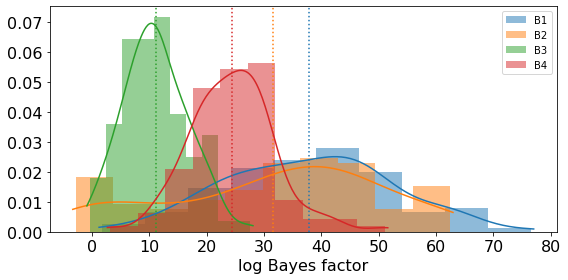

In [6]:
plt.figure(figsize=(8,4),)
for file,color,name in zip(file_array,["C0","C1","C2","C3"],["B1","B2","B3","B4"]):
    data = pd.read_csv(file)
    logB = data['logB']
    probDensityFun = scipy.stats.gaussian_kde(logB)
    x = np.linspace(logB.min() - 0.5, logB.max() + 0.5, 200)
    plt.plot(x, probDensityFun(x), color=color)
    plt.axvline(np.mean(logB), color=color, linestyle=":")
    plt.hist(logB,10,density=1,alpha=0.5,label = name,color=color,)
plt.legend()
plt.xlabel("log Bayes factor",fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig('logBBenchmark.pdf',dpi=300)

# 4 benchmarks and search results

In [7]:
result_json_B1_new = glob('w1specM50Rw0.99Chi0.69/newlikelihood/*N100*SNR*.json')
result_json_B1_new.sort()


result_json_B2_new = glob('w1specM50RdV0.2Chi0.69/newlikelihood/*N100*SNR*.json')
result_json_B2_new.sort()


result_json_B3_new = glob('w1specM50RbolT10Chi0.69/newlikelihood/*N100*SNR*.json')
result_json_B3_new.sort()

result_json_B4_new = glob('w1Xin/newlikelihood/*N100*SNR*.json')
result_json_B4_new.sort()

print(len(result_json_B1_new),len(result_json_B2_new),len(result_json_B3_new),len(result_json_B4_new))

100 100 100 100


In [8]:
posterior_array_B1_new = [bilby.result.read_in_result(result_single).posterior for result_single in result_json_B1_new]
posterior_all_B1_new = pd.concat(posterior_array_B1_new,ignore_index=True)
posterior_array_B2_new = [bilby.result.read_in_result(result_single).posterior for result_single in result_json_B2_new]
posterior_all_B2_new = pd.concat(posterior_array_B2_new,ignore_index=True)
posterior_array_B3_new = [bilby.result.read_in_result(result_single).posterior for result_single in result_json_B3_new]
posterior_all_B3_new = pd.concat(posterior_array_B3_new,ignore_index=True)
posterior_array_B4_new = [bilby.result.read_in_result(result_single).posterior for result_single in result_json_B4_new]
posterior_all_B4_new = pd.concat(posterior_array_B4_new,ignore_index=True)

In [19]:
result = bilby.result.read_in_result(result_json_B1_new[0])
priors = result.priors

## FIG 10 left

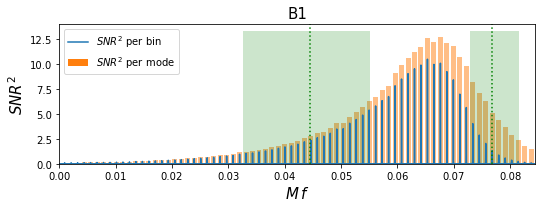

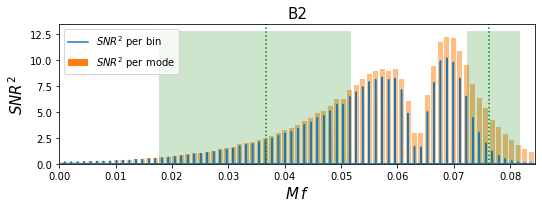

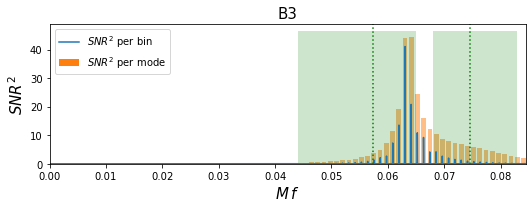

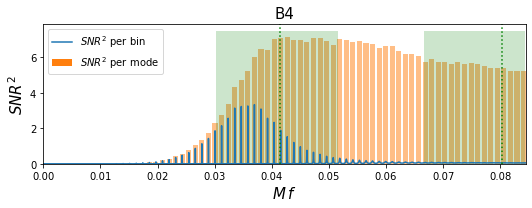

In [16]:
from scipy.signal import find_peaks
spacing_array = []

length0 = int(500*4096)
file_list = glob('echo_waves/*.dat')
file_list.sort()
chi = 0.69
f_RD = (1.5251-1.1568*(1-chi)**0.129)/(2*np.pi)
R_bar = 0.00547/(1+1/np.sqrt(1-chi**2))/(2*np.pi)


amplitude_array = np.concatenate((np.linspace(160,160,6),np.linspace(57,57,6),np.linspace(29,29,6),np.linspace(34,34,6),np.linspace(0,0,6)))

import matplotlib.mlab as mlab
from scipy.interpolate import interp1d


for index,posterior,name in zip(np.arange(3,24,6)[::-1],[posterior_all_B1_new,posterior_all_B2_new,posterior_all_B3_new,posterior_all_B4_new],["B1","B2","B3","B4"]):
	file = file_list[index]
	amplitude_inject = amplitude_array[index]
	inject_data = np.genfromtxt(file,delimiter="\t",dtype=np.complex128)

	omega = np.real(inject_data[0::,0])
	frequency = omega/(2*np.pi)
	df = np.diff(frequency)[0]
	duration = 1/df
	dt = duration/len(omega)
	frequency = frequency[0:len(frequency)//2]


	inject_strain_fre = inject_data[0::,1]
	inject_strain_fre = (inject_strain_fre + np.conjugate(inject_strain_fre[::-1]))/2
	inject_strain_fre = inject_data[0::,1]
	inject_strain_plus = inject_strain_fre
	inject_strain_minus = np.conjugate(inject_strain_fre[::-1])


	inject_strain_fre = (inject_strain_plus+inject_strain_minus)/2
	inject_strain_fre = inject_strain_fre[0:len(frequency)]

	length = len(inject_strain_fre)*2

	i=0

	noise0 = np.load('noise100_500second.npy')
	noisep = noise0[i*length0:(i+1)*length0]
	noise = noisep[0:length]

	NFFT = 2048
	fs = 1/dt
	psd_window = np.blackman(NFFT)
	NOVL = int(NFFT/2)

	Pxx_strain, freqs = mlab.psd(noisep, Fs = fs, NFFT = NFFT,window = psd_window,noverlap = NOVL)
	psd_strain = interp1d(freqs, Pxx_strain)
	noisefre = dt * np.fft.fft(noise)[0:len(frequency)]

 
	fmin = 0
	fmax = f_RD

 
	strainfre = inject_strain_fre * amplitude_inject + noisefre
	frequencye = frequency[int(fmin/df):int(fmax/df+2)]

	hi = inject_strain_fre[int(fmin/df):int(fmax/df+2)] * amplitude_inject
	hi_plus = inject_strain_plus[int(fmin/df):int(fmax/df+2)] * amplitude_inject
	hi_minus = inject_strain_minus[int(fmin/df):int(fmax/df+2)] * amplitude_inject
 
	rho_opt_signal = np.sqrt(4*df * np.sum(np.abs(hi)**2/psd_strain(frequencye)))
	rho_opt_signal_plus = np.sqrt(4*df * np.sum(np.abs(hi_plus)**2/psd_strain(frequencye)))/2
	rho_opt_signal_minus = np.sqrt(4*df * np.sum(np.abs(hi_minus)**2/psd_strain(frequencye)))/2
 
	rho_opt_signal_square_list_plus= 4*df * (np.abs(hi_plus)**2/psd_strain(frequencye))/4
	rho_opt_signal_square_list_minus= 4*df * (np.abs(hi_minus)**2/psd_strain(frequencye))/4
 
	peaks_plus , _=find_peaks(np.abs(hi_plus),distance=2*R_bar/df,height=20)
	peaks_plus = peaks_plus[0:len(peaks_plus)-1]
	peaks_minus , _=find_peaks(np.abs(hi_minus),distance=2*R_bar/df,height=20)
	peaks_minus = peaks_minus[0:len(peaks_minus)-1]

	fminbar1 = np.percentile(posterior.fmin.values,5)
	fminbar2 = np.percentile(posterior.fmin.values,95)
	fmaxbar1 = np.percentile(posterior.fmax.values,5)
	fmaxbar2 = np.percentile(posterior.fmax.values,95)

	plt.figure(figsize=(7.5,3))
	if index == 3:
		comb_length_minus, comb_phase_minus=np.polyfit(np.arange(len(peaks_minus)),frequencye[peaks_minus],1,w=np.abs(hi_minus)[peaks_minus])
		snr_all_minus = np.sqrt(np.sum(rho_opt_signal_square_list_minus))
		spacing = comb_length_minus
		shift = comb_phase_minus
		shift = shift- spacing*int(shift/spacing)-0.5*spacing
		plt.plot(frequencye,rho_opt_signal_square_list_minus,label=r'$SNR^2$ per bin')
		for x in np.arange(0,f_RD/comb_length_minus,1):
			# plt.axvline(x*spacing+fmin+shift, color='red', linestyle=":",alpha = 1)
			fmine = x*spacing+fmin+shift
			fmaxe = (x+1)*spacing+fmin+shift
			hie = np.abs(inject_strain_minus)[int(fmine/df):int(fmaxe/df+2)]* amplitude_inject/2
			frequencyee = frequency[int(fmine/df):int(fmaxe/df+2)]
			rho_opt_signale = np.sum(4*df * (hie**2/psd_strain(np.abs(frequencyee))))
			plt.bar((fmine+fmaxe)/2,rho_opt_signale,spacing/1.3,color = 'C1',alpha = 0.5)
		plt.xlim(0,f_RD)
		plt.xlabel('frequency')
		plt.ylabel('$SNR^2$')
	else:
		comb_length_plus, comb_phase_plus=np.polyfit(np.arange(len(peaks_plus)),frequencye[peaks_plus],1,w=np.abs(hi_plus)[peaks_plus])
		snr_all_plus = np.sqrt(np.sum(rho_opt_signal_square_list_plus))
		spacing = comb_length_plus
		shift = comb_phase_plus
		shift = shift- spacing*int(shift/spacing)-0.5*spacing
		plt.plot(frequencye,rho_opt_signal_square_list_plus,label= r'$SNR^2$ per bin')
		for x in np.arange(0,f_RD/comb_length_plus,1):
			# plt.axvline(x*spacing+fmin+shift, color='red', linestyle=":",alpha = 1)
			fmine = x*spacing+fmin+shift
			fmaxe = (x+1)*spacing+fmin+shift
			hie = np.abs(inject_strain_plus)[int(fmine/df):int(fmaxe/df+2)]* amplitude_inject/2
			frequencyee = frequency[int(fmine/df):int(fmaxe/df+2)]
			rho_opt_signale = np.sum(4*df * (hie**2/psd_strain(np.abs(frequencyee))))
			plt.bar((fmine+fmaxe)/2,rho_opt_signale,spacing/1.3,color = 'C1',alpha = 0.5)
		plt.xlim(0,f_RD)
		
	height = plt.gca().get_ylim()[1]
	plt.bar((fminbar2+fminbar1)/2,height,(fminbar2-fminbar1),color = 'green',alpha = 0.2)
	plt.bar((fmaxbar2+fmaxbar1)/2,height,(fmaxbar2-fmaxbar1),color = 'green',alpha = 0.2)
	plt.axvline(np.mean(posterior.fmin.values), color='green', linestyle=":",alpha = 1)
	plt.axvline(np.mean(posterior.fmax.values), color='green', linestyle=":",alpha = 1)
	plt.title(name,fontsize = 15)
	plt.bar(0,0,color = 'C1',label= r'$SNR^2$ per mode')
	plt.legend(fontsize = 15)
	plt.xlabel(r'$M\, f$',fontsize = 15)
	plt.ylabel('$SNR^2$',fontsize = 15)
	# plt.axvline(np.mean(posterior.fmin.values),color='g',label='fmin mean')
	# plt.axvline(np.mean(posterior.fmax.values),color='g',label='fmax mean')
	plt.legend(loc='upper left')
	plt.tight_layout()
	plt.savefig('SNRBenchmark'+name+'.pdf',dpi=300)
	plt.show()
 
	spacing_array.append(spacing)

## Figure 10 right

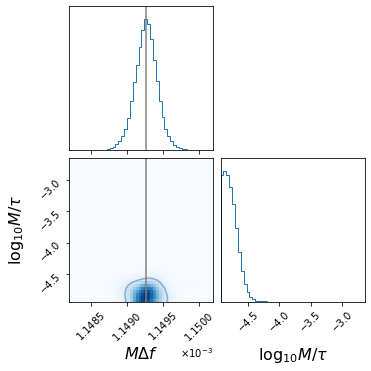

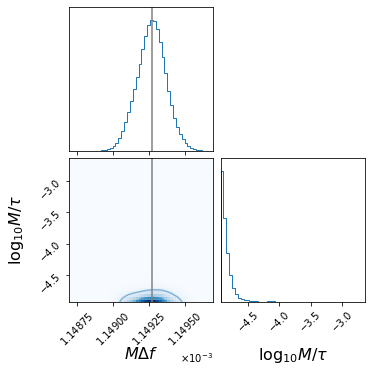

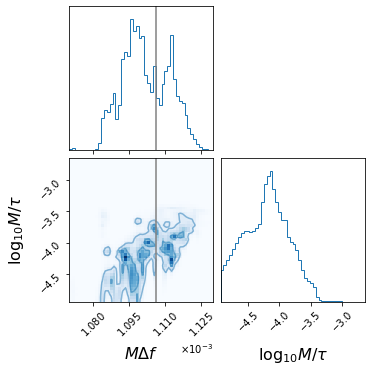

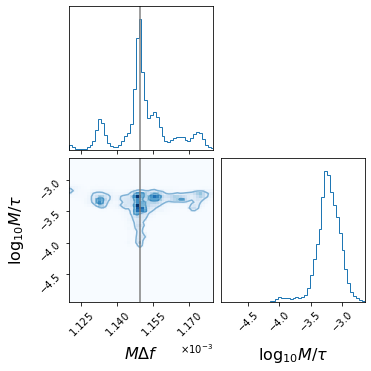

In [20]:
import matplotlib.lines as mlines
from matplotlib.transforms import Bbox
range_array = [[0.0011482,0.0011502],[0.0011487,0.0011497],[0.00107,0.00113],[0.00112,0.00118]]
for posterior,name,spacing,spacing_range in zip([posterior_all_B1_new,posterior_all_B2_new,posterior_all_B3_new,posterior_all_B4_new],["B1","B2","B3","B4"],spacing_array,range_array):   
    # line1 = mlines.Line2D([], [], color='C0', label='newlikelihood')
    # line2 = mlines.Line2D([], [], color='C1', label='oldlikelihood')
    # #line3 = mlines.Line2D([], [], color='gray', label='injected value')
    # line4 = mlines.Line2D([], [], ls = '--',color='black', alpha = 0.5,label='prior')

    datanew = np.transpose([posterior.spacing.values,np.log10(posterior.width.values)])
    kwargsnew = dict(labels=[r"$M \Delta f$",r"$\log_{10}{M/\tau}$"], range=[spacing_range,[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)]],show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C0',plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    
    def get_normalisation_weight(len_current_samples, len_of_longest_samples):
        return np.ones(len_current_samples) * (len_of_longest_samples / len_current_samples)
    figure = corner.corner(datanew,**kwargsnew)
    inject = np.array([spacing,1])
    corner.overplot_lines(figure, inject, color="gray")
    corner.overplot_points(figure, inject[None], marker="s", color="gray")

    axes = np.array(figure.axes).reshape((2, 2))
    ax = axes[1,1]
    #logprior = 1/(np.log10(priors['width'].maximum/priors['width'].minimum))
    #ax.plot(np.log10(np.linspace(priors['width'].minimum, priors['width'].maximum, 1000)),np.linspace(logprior,logprior, 1000),color = 'black',ls='--',alpha = 0.5,label = 'prior')
    ax = axes[1,0]
    ax.hist2d(posterior.spacing.values,np.log10(posterior.width.values),bins=50,density=True,cmap='Blues',range=[range,[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)]])
    ax.ticklabel_format(axis="x", style="sci", scilimits=(0, 0),useMathText=True)
    ax = axes[1,1]
    plt.savefig(name+"BenchmarkPosterior.pdf",dpi = 300)
    plt.show()
    plt.close()

# violin plot for logB
Fig 11 , Fig 17 lower

In [32]:
import pandas as pd
import scipy
import os
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import bilby
import corner

from glob import glob

In [33]:
duration_array_str = glob("echo_waves/*.dat")
duration_array_str.sort()
for i in range(len(duration_array_str)):
    duration_array_str[i] = duration_array_str[i].split("/")[1].split("N")[1].split('.')[0]
duration_array_str = list(dict.fromkeys(duration_array_str))
duration_array_str

['010', '020', '050', '100', '150', '200']

In [34]:
duration_array = glob("echo_waves/*.dat")
duration_array.sort()
for i in range(len(duration_array)):
    duration_array[i] = int(duration_array[i].split("/")[1].split("N")[1].split('.')[0])
duration_array = list(dict.fromkeys(duration_array))
duration_array.sort()
duration_array = np.array(duration_array)*2
duration_array

array([ 20,  40, 100, 200, 300, 400])

In [35]:
name_array = glob("echo_waves/*.dat")
name_array.sort()
for i in range(len(name_array)):
    name_array[i] = name_array[i].split("/")[1].split("N")[0]
#delete duplicates in name array
name_array = list(dict.fromkeys(name_array))
name_array.sort()
name_array = name_array[::-1]
name_array.append('noise')
name_array

['w1specM50Rw0.99Chi0.69',
 'w1specM50RdV0.2Chi0.69',
 'w1specM50RbolT10Chi0.69',
 'w1Xin',
 'noise']

In [36]:
file_array_new = [sorted(glob('%s/*%s*.csv'%(name,string_likelihood))) for name in name_array for string_likelihood in ['newlikelihood']]
file_array_old = [sorted(glob('%s/*%s*.csv'%(name,string_likelihood))) for name in name_array for string_likelihood in ['oldlikelihood']]
np.shape(file_array_new)
# (5,6) 5 rows, 6 columns means each row is a different signal, each column is a different duration
# file_array_new[i] could get all the duration with the i-th signal

(5, 6)

In [37]:
new_likelihood_logB_upper = []
new_likelihood_logB_lower = []
old_likelihood_logB_upper = []   
old_likelihood_logB_lower = []    
for file_new,file_old in zip(file_array_new[-1],file_array_old[-1]):
	data = pd.read_csv(file_new)
	log_b = data["logB"]
	new_likelihood_logB_upper.append(np.percentile(log_b.values, 95))
	new_likelihood_logB_lower.append(np.percentile(log_b.values, 5))
	data = pd.read_csv(file_old)
	log_b = data["logB"]
	old_likelihood_logB_upper.append(np.percentile(log_b.values, 95))
	old_likelihood_logB_lower.append(np.percentile(log_b.values, 5))
new_likelihood_logB_upper = np.array(new_likelihood_logB_upper)
new_likelihood_logB_lower = np.array(new_likelihood_logB_lower)
old_likelihood_logB_upper = np.array(old_likelihood_logB_upper)
old_likelihood_logB_lower = np.array(old_likelihood_logB_lower)

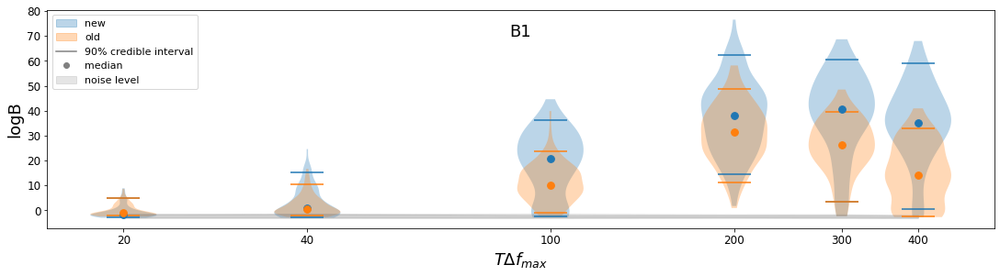

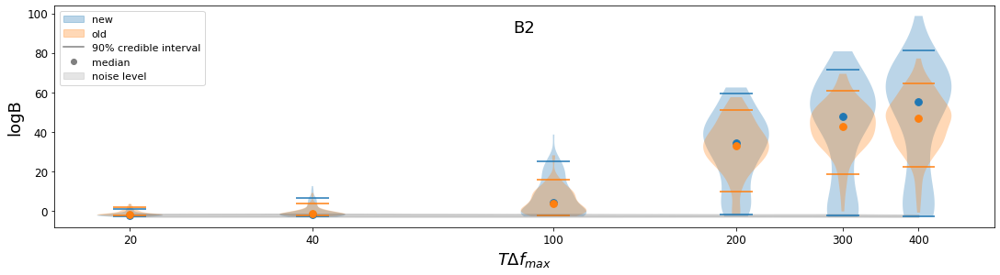

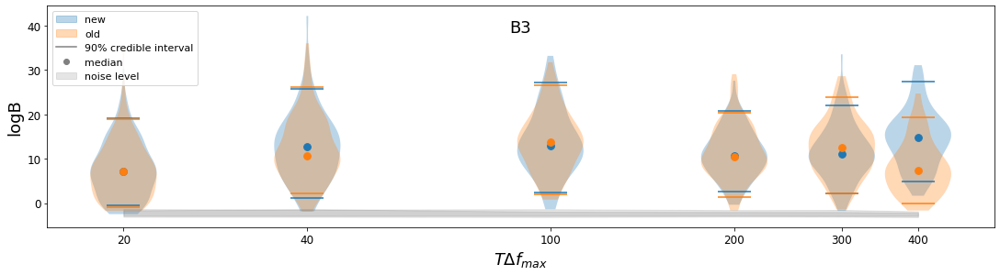

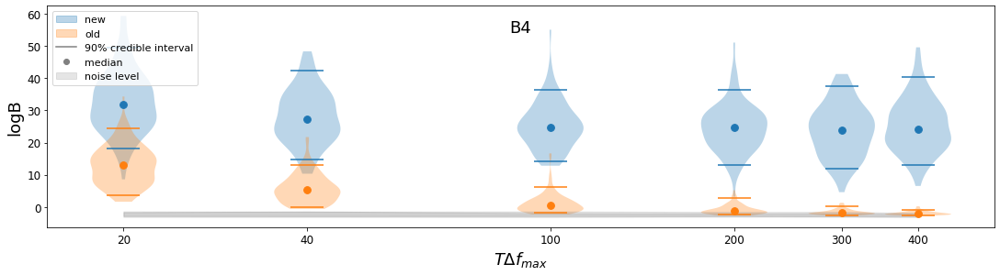

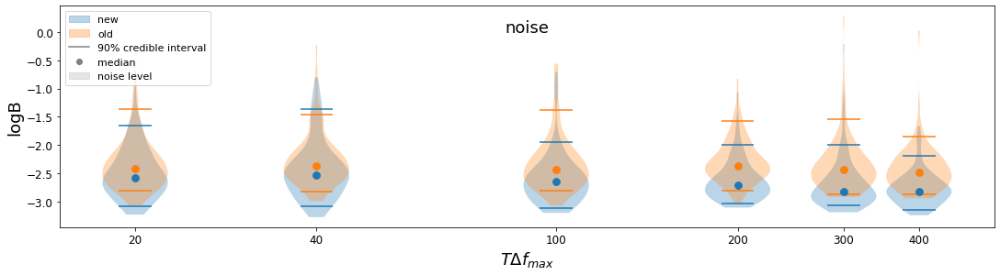

In [38]:
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
# min & max use solid line
# median use point
name_label_array= ['B1','B2','B3','B4','noise']
for file_array_new_2,file_array_old_2,name_string in zip(file_array_new,file_array_old,name_label_array):
    # quantilesnew = [[0,1],[0,1],[0,1],[0,1],[0,1],[0,1]]
    # quantilesold = [[0,1],[0,1],[0,1],[0,1],[0,1],[0,1]]
    quantilesnew = [[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95]]
    quantilesold = [[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95]]
    fig, ax = plt.subplots(figsize = (15,4),constrained_layout=True)
    labels = []

    new_likelihood_logB = []
    old_likelihood_logB = []
    for file_new,file_old in zip(file_array_new_2,file_array_old_2):
        data = pd.read_csv(file_new)
        log_b = data["logB"]
        new_likelihood_logB.append(log_b.values)
        data = pd.read_csv(file_old)
        log_b = data["logB"]
        old_likelihood_logB.append(log_b.values)
    parts1 = ax.violinplot(new_likelihood_logB,positions=np.log(duration_array),showmedians=False,quantiles=quantilesnew,widths = 0.25,showextrema=False)
    parts2 = ax.violinplot(old_likelihood_logB,positions=np.log(duration_array),showmedians=False,quantiles=quantilesold,widths = 0.25,showextrema=False)
    #parts1['cmedians'].set_linestyle('solid')
    parts1['cquantiles'].set_linestyle('solid')
    parts1['zorder'] = 2
    #parts2['cmedians'].set_linestyle('solid')
    parts2['cquantiles'].set_linestyle('solid')
    parts1['zorder'] = 1
    ax.set_xticks(np.log(duration_array))
    ax.set_xticklabels([str(x) for x in duration_array],fontsize = 12)
    patch1 = mpatches.Patch(color=parts1["bodies"][0].get_facecolor().flatten(), label='new')
    patch2 = mpatches.Patch(color=parts2["bodies"][0].get_facecolor().flatten(), label='old')
    patch3 = mpatches.Patch(alpha=0.2, color='gray', label='noise level')
    line1 = mlines.Line2D([], [], color='grey', label='90% credible interval')
    points1 = mlines.Line2D([], [], color='grey', marker='o',linestyle='None', label='median')
    positions = np.log(duration_array)
    medians1 = [np.median(x) for x in new_likelihood_logB]
    ax.scatter(positions, medians1, marker='o', color=parts1["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    medians2 = [np.median(x) for x in old_likelihood_logB]
    ax.scatter(positions, medians2, marker='o', color=parts2["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    ax.text(0.5, 0.9, name_string, horizontalalignment='center',verticalalignment='center', transform=ax.transAxes,fontsize = 18)
    if name_string != 'noise':
        ax.fill_between(np.log(duration_array), new_likelihood_logB_upper, new_likelihood_logB_lower, alpha=0.2, color='gray')
        ax.fill_between(np.log(duration_array), old_likelihood_logB_upper, old_likelihood_logB_lower, alpha=0.2, color='gray')
    ax.set_xlabel(r'$T\Delta f_{max}$',fontsize = 18)
    ax.set_ylabel('logB',fontsize = 18)
    plt.yticks(fontsize = 12)
    plt.legend(handles=[patch1, patch2, line1, points1,patch3], loc=2,fontsize = 11)
    plt.savefig('logB_violinplot_%s.pdf'%name_string,dpi=300)
    plt.show()
    plt.close()

# corner plot for posterior 
Fig 12

In [1]:
import pandas as pd
import scipy
import os
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import bilby
import corner
import csv
from glob import glob

import matplotlib.lines as mlines
from matplotlib.transforms import Bbox

In [2]:
duration_array_str = glob("echo_waves/*.dat")
duration_array_str.sort()
for i in range(len(duration_array_str)):
    duration_array_str[i] = duration_array_str[i].split("/")[1].split("N")[1].split('.')[0]
duration_array_str = list(dict.fromkeys(duration_array_str))
duration_array_str

['010', '020', '050', '100', '150', '200']

In [3]:
duration_array = glob("echo_waves/*.dat")
duration_array.sort()
for i in range(len(duration_array)):
    duration_array[i] = int(duration_array[i].split("/")[1].split("N")[1].split('.')[0])
duration_array = list(dict.fromkeys(duration_array))
duration_array.sort()
duration_array = np.array(duration_array)*2
duration_array

array([ 20,  40, 100, 200, 300, 400])

In [4]:
name_array = glob("echo_waves/*.dat")
name_array.sort()
for i in range(len(name_array)):
    name_array[i] = name_array[i].split("/")[1].split("N")[0]
#delete duplicates in name array
name_array = list(dict.fromkeys(name_array))
name_array.sort()
name_array = name_array[::-1]
name_array.append('noise')
name_array

['w1specM50Rw0.99Chi0.69',
 'w1specM50RdV0.2Chi0.69',
 'w1specM50RbolT10Chi0.69',
 'w1Xin',
 'noise']

In [5]:
file_array_new = [sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration))) for name in name_array for string_likelihood in ['newlikelihood'] for duration in duration_array_str]
file_array_old = [sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration))) for name in name_array for string_likelihood in ['oldlikelihood'] for duration in duration_array_str]

In [6]:
import pandas as pd

import matplotlib.pyplot as plt
import numpy as np
import csv

import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d
import bilby
from glob import glob
from bilby.core.prior import PriorDict



import sys
sys.path.append("..")
from burstevidence_newcomb import burstevidence as burstevidence_old
from burstevidence_newcomb import burstevidence_qnm as burstevidence
from comb_models_version3 import qnmcombmodel_cut as combmodel

#chi = 2/3
chi = 0.69
f_RD = (1.5251-1.1568*(1-chi)**0.129)/(2*np.pi)
R_bar = 0.00547/(1+1/np.sqrt(1-chi**2))
#0.006 should be 0.00572031?


fmin = 0
fmax = f_RD

noise0 = np.load('noise100_500second.npy')
duration_array_str = ['010', '020', '050', '100', '150', '200']
name = 'w1specM50Rw0.99Chi0.69'

amplitude_normalize_factor_array = []

for duration_str in duration_array_str:

    file = glob('echo_waves/*%s*%s.dat'%(name,'N'+duration_str))[0]
    i = 0
    inject_data = np.genfromtxt(file,delimiter="\t",dtype=np.complex128)

    omega = np.real(inject_data[0::,0])
    frequency = omega/(2*np.pi)
    df = np.diff(frequency)[0]
    duration = 1/df
    dt = duration/len(omega)
    frequency = frequency[0:len(frequency)//2]

    length0 = int(500*4096)
    noisep = noise0[i*length0:(i+1)*length0]

    NFFT = 2048
    fs = 1/dt
    psd_window = np.blackman(NFFT)
    NOVL = int(NFFT/2)

    Pxx_strain, freqs = mlab.psd(noisep, Fs = fs, NFFT = NFFT,window = psd_window,noverlap = NOVL)
    psd_strain = interp1d(freqs, Pxx_strain)
    
    amplitude_normalize_factor = np.sqrt(np.mean(psd_strain(frequency))/(4*df))
    amplitude_normalize_factor_array.append(amplitude_normalize_factor)
amplitude_normalize_factor_array    

[116.97508003340951,
 165.4118308656583,
 261.52407266674993,
 369.8553075334389,
 452.9801165068924,
 523.057310270927]

In [7]:
tem = [amplitude_normalize_factor_array,amplitude_normalize_factor_array,amplitude_normalize_factor_array,amplitude_normalize_factor_array,amplitude_normalize_factor_array]
amplitude_normalize_factors_array = [item for sublist in tem for item in sublist]
amplitude_normalize_factors_array

[116.97508003340951,
 165.4118308656583,
 261.52407266674993,
 369.8553075334389,
 452.9801165068924,
 523.057310270927,
 116.97508003340951,
 165.4118308656583,
 261.52407266674993,
 369.8553075334389,
 452.9801165068924,
 523.057310270927,
 116.97508003340951,
 165.4118308656583,
 261.52407266674993,
 369.8553075334389,
 452.9801165068924,
 523.057310270927,
 116.97508003340951,
 165.4118308656583,
 261.52407266674993,
 369.8553075334389,
 452.9801165068924,
 523.057310270927,
 116.97508003340951,
 165.4118308656583,
 261.52407266674993,
 369.8553075334389,
 452.9801165068924,
 523.057310270927]

In [8]:
names_array = ['B1','B1','B1','B1','B1','B1'
 ,'B2', 'B2', 'B2', 'B2', 'B2', 'B2'
 ,'B3', 'B3', 'B3', 'B3', 'B3', 'B3'
 ,'B4', 'B4', 'B4', 'B4', 'B4', 'B4'
 ,'noise', 'noise', 'noise', 'noise', 'noise', 'noise']

In [9]:
headers = ['names', 'log10width_median', 'log10width_plus', 'log10width_minus', 'amplitude_median', 'amplitude_plus', 'amplitude_minus', 'phase_median', 'phase_plus', 'phase_minus', 'spacing_median', 'spacing_plus', 'spacing_minus', 'fmin_median', 'fmin_plus', 'fmin_minus', 'fmax_median', 'fmax_plus', 'fmax_minus', 'duration_median', 'duration_plus', 'duration_minus', 'log_likelihood_median', 'log_likelihood_plus', 'log_likelihood_minus', 'log_prior_median', 'log_prior_plus', 'log_prior_minus', 'SNR_median', 'SNR_plus', 'SNR_minus']
keys_all = ['width', 'amplitude', 'phase', 'spacing', 'fmin', 'fmax', 'duration','log_likelihood', 'log_prior', 'SNR']
with open('PE.csv', 'w') as f:
    f_csv = csv.writer(f)
    f_csv.writerow(headers)
# The file PE.csv contains the parameter estimation with combined posterior results of all the signals with different durations and different likelihoods
# The data used in Table 3 is contained in PE_new.csv


100 100
B1N010


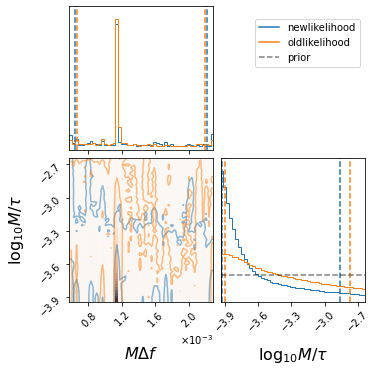

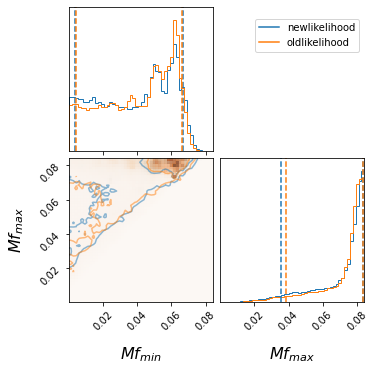

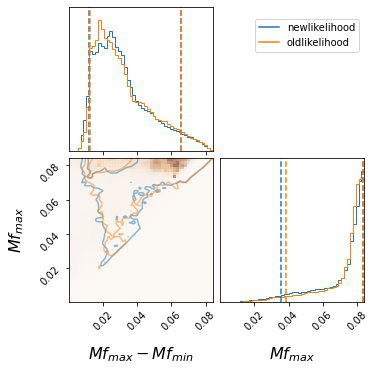

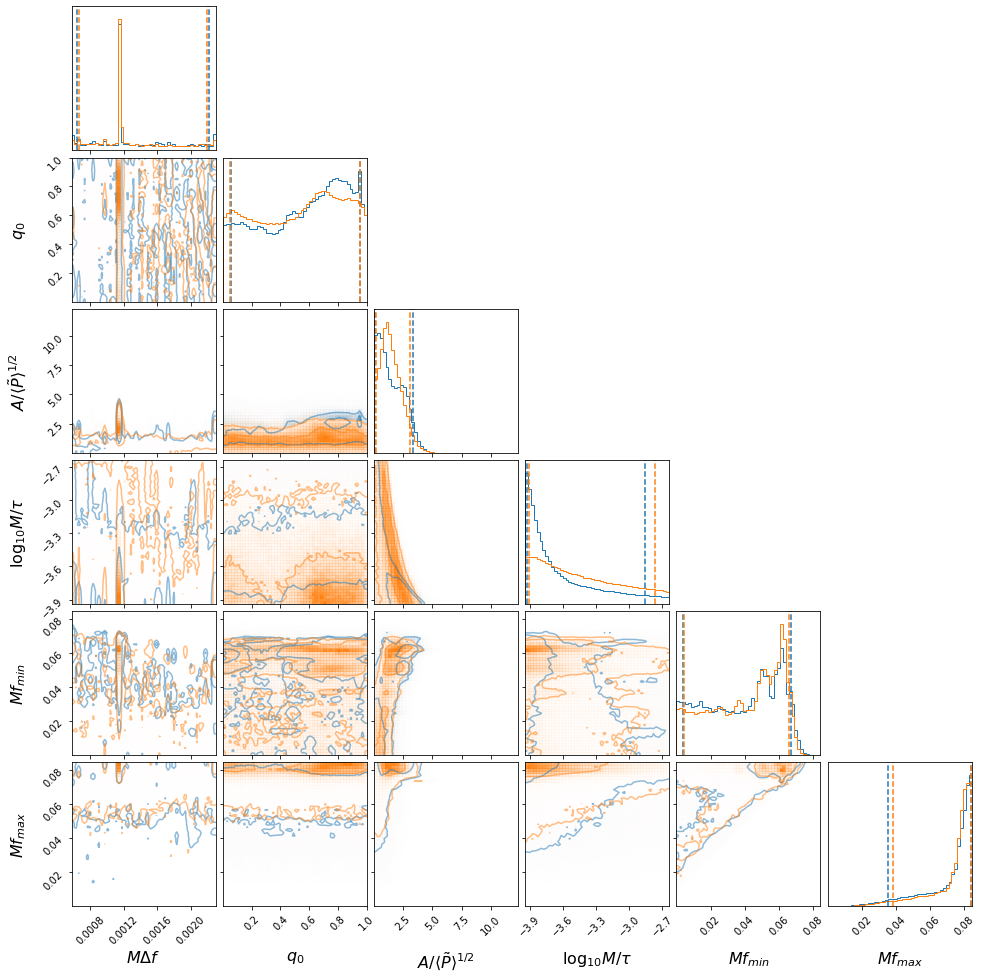

width -3.7332533445801164 0.8714164873930264 0.19351573913174303
amplitude 1.3056145681171523 2.0473035247594478 1.176475716197229
phase 0.5883755667007068 0.3639381408470058 0.5294096778345146
spacing 0.001152983478875796 0.0010629614618676915 0.0005123455087432665
fmin 0.04229493196580702 0.02476489965857364 0.038563733466616214
fmax 0.07736820233140906 0.006509547701321117 0.04176617446665439
duration 8701.17437140776 0.0 0.0
log_likelihood 6.205204299414771 17.390427885883735 6.556288342462009
log_prior 12.578351677268415 0.446942456285365 2.005355134088326
SNR 6.296729437630336 4.160638411041402 5.493658373625697
width -3.5051301318429045 0.7386105539556942 0.3980473839371985
amplitude 1.3250687575990079 1.773303525684629 1.124463551313308
phase 0.5523501674378108 0.397664619408993 0.4999019284103857
spacing 0.001153327830489148 0.0010376902808800926 0.0004892474131017824
fmin 0.04438152661983825 0.021733307033070463 0.0400660975294415
fmax 0.07811801973346225 0.005730889021532057

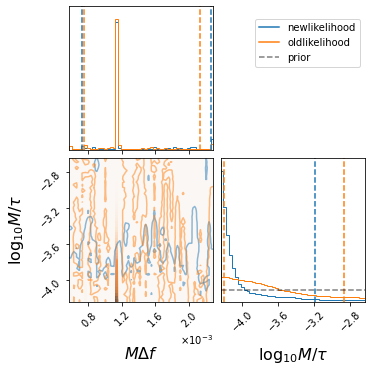

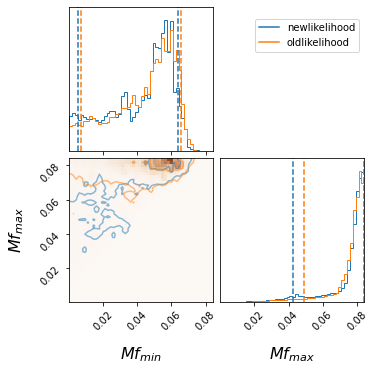

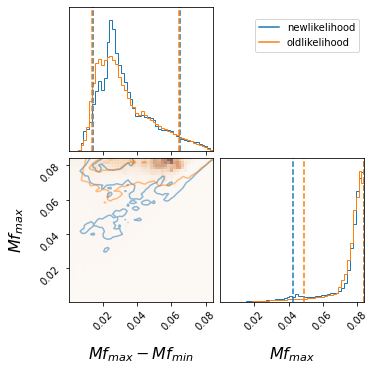

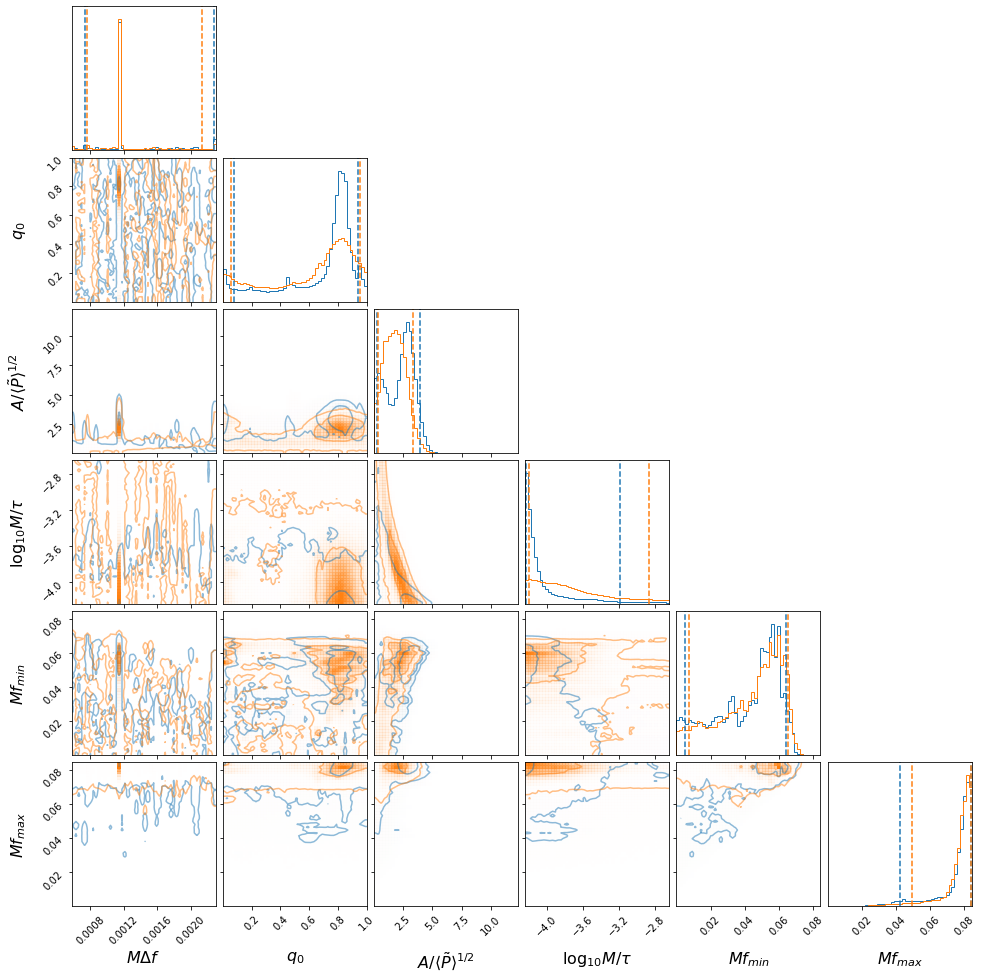

width -4.141495821736195 0.949810350655504 0.09259217149574361
amplitude 2.4548249044784485 1.4638297444187311 2.2228138199489047
phase 0.7835148524041654 0.1574838957725181 0.7084705140743797
spacing 0.0011498553666640784 0.0011223261285534833 0.0004202078232843527
fmin 0.04760136846045769 0.016496825393988987 0.0425139390228186
fmax 0.07950448944623559 0.004521317157624813 0.03696714531093728
duration 17402.34874281552 0.0 0.0
log_likelihood 19.721557230283885 17.214111857258523 19.75942302547136
log_prior 12.962944882126338 0.2133393492468727 2.188125381878965
SNR 9.140718921446204 3.3784812306305056 7.505843087629353
width -3.8058475240660954 0.9432096687512743 0.3959204258123066
amplitude 1.7486150270608483 1.6401427171223584 1.4137876200509965
phase 0.71192206224399 0.2436294950012431 0.6580627693325504
spacing 0.001150314760469423 0.0009831488489173666 0.0003958704950670764
fmin 0.04846054380267239 0.01695372397252374 0.04132986819776219
fmax 0.07933604245601916 0.00462831088729

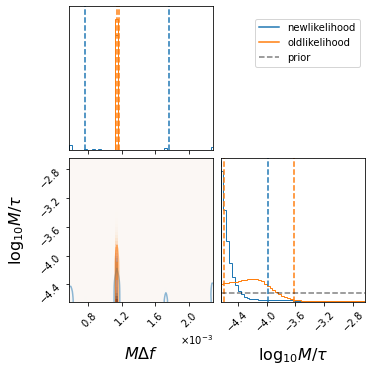

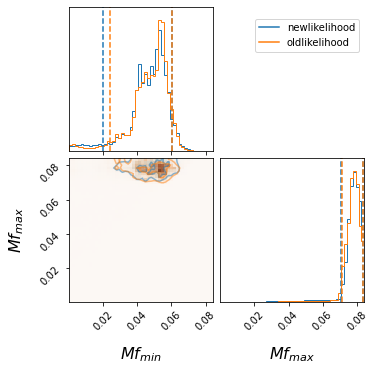

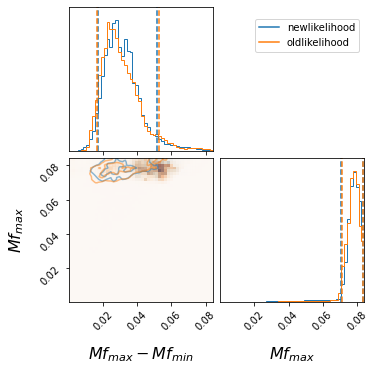

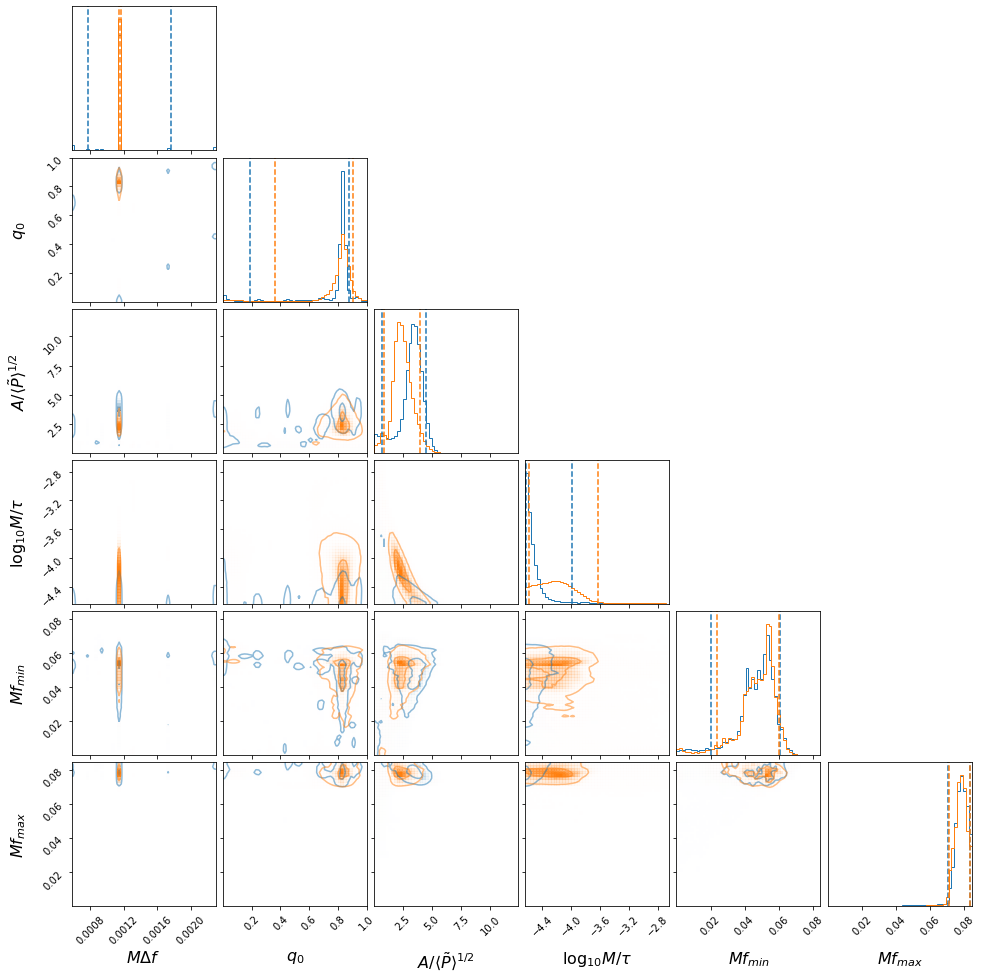

width -4.563814266484685 0.5810868261708508 0.06894542259419278
amplitude 3.3420589240082674 1.1504753360581632 2.637230399122908
phase 0.8259490353367975 0.04890881838777905 0.6357565628330786
spacing 0.001149302764449282 0.0006109635694861719 0.00038305968192680674
fmin 0.04849688948590455 0.012056446245193128 0.028502147674754272
fmax 0.0784868465247534 0.005150035111118542 0.00785464981186404
duration 43505.871857038794 0.0 0.0
log_likelihood 44.81841218220021 16.862857303846084 42.323222210442545
log_prior 13.257011718871444 0.15892651624625032 1.340800585190463
SNR 12.363317891896891 2.663147835851399 7.29294375432396
width -4.216511606025051 0.593357733991775 0.37334419574949607
amplitude 2.3833301226174597 1.5449961176022775 1.472563752523521
phase 0.8276177699570749 0.07940136804623665 0.4669785096560848
spacing 0.0011493066548727065 1.5467788606354175e-05 3.2213247529618017e-06
fmin 0.04925096997103666 0.011144452743147883 0.0254815079818166
fmax 0.0780646605970703 0.00534220

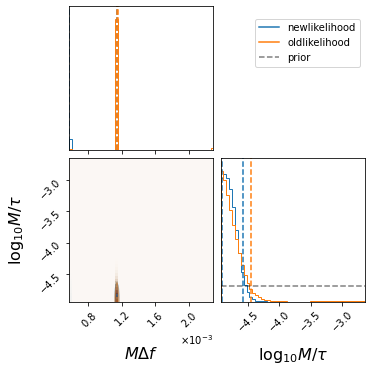

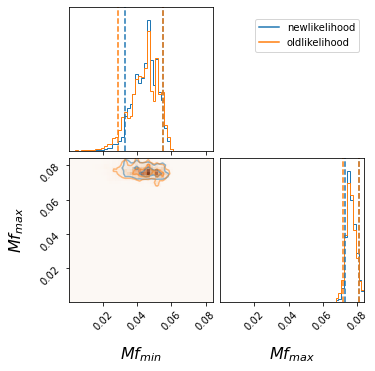

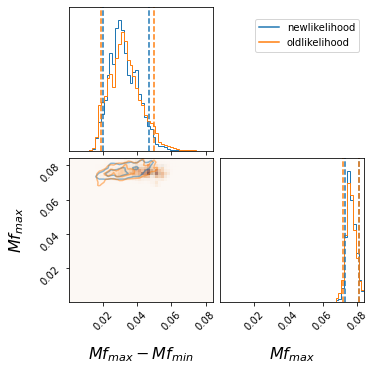

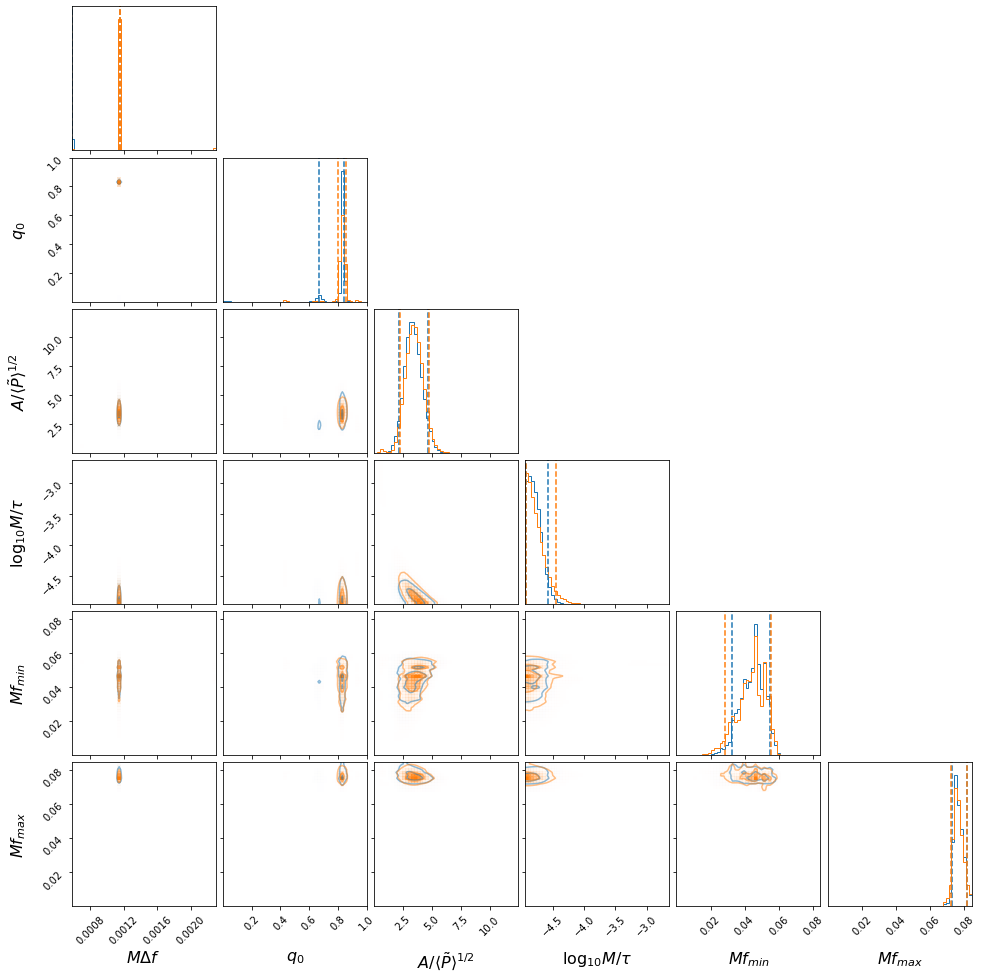

width -4.798122886569455 0.2198021151191556 0.12663568356787103
amplitude 3.3451961385403064 1.3212637135908394 1.1538651809978266
phase 0.8309983650783332 0.012914162627635895 0.16267503527675575
spacing 0.0011492453707412013 2.724346185589699e-07 0.0005746153404077945
fmin 0.0455424394474205 0.009560407152314945 0.012897850680978415
fmax 0.07630934954048163 0.00526986522988486 0.0034531135603692448
duration 87011.74371407759 0.0 0.0
log_likelihood 62.46575101813219 25.279664026492803 23.835211425607298
log_prior 13.309320309005933 0.2915017389913448 0.5064681398421822
SNR 14.26545584175965 2.5837747498070804 2.7668612104400125
width -4.790106580588302 0.3378147415373203 0.13598853892768936
amplitude 3.463602598811188 1.2991518166083598 1.190381636923712
phase 0.8288937831587251 0.023340597203892477 0.026321824415694417
spacing 0.0011492949185318204 5.335452382549798e-07 5.117052459065099e-07
fmin 0.044585618624619204 0.010715762583622591 0.015910744298669628
fmax 0.07623275907469652 

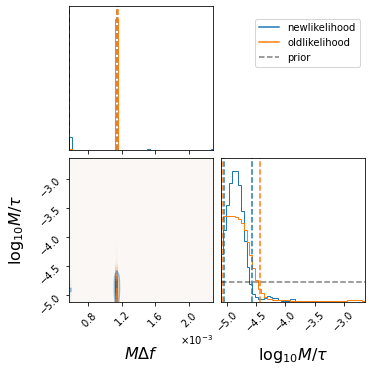

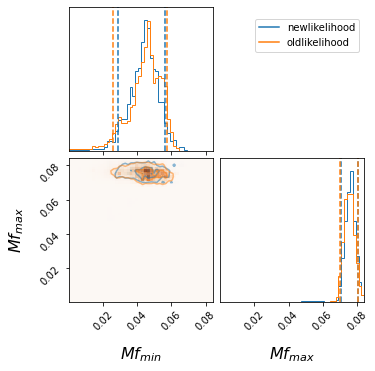

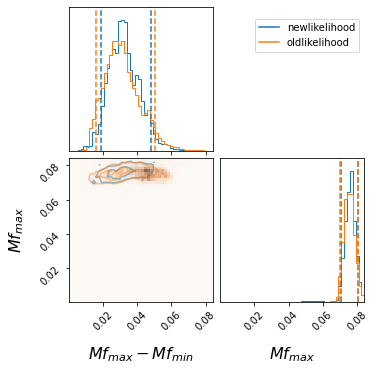

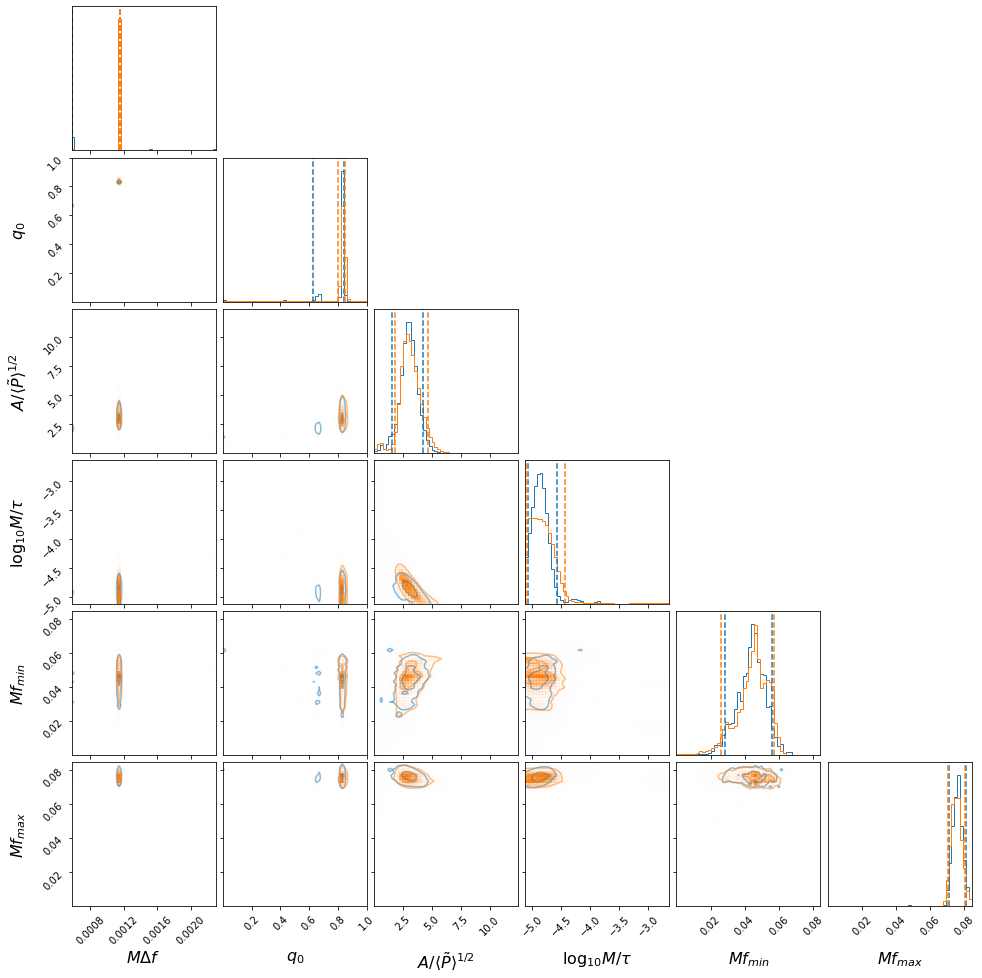

width -4.861493624961041 0.2918943944477306 0.2039811020441471
amplitude 3.011881016677044 1.2308267850298154 1.44684459969073
phase 0.829537116954522 0.010413191449507586 0.20171455889067014
spacing 0.0011492826465315385 2.9799413798245293e-07 0.0005746332458786699
fmin 0.044648171344282735 0.011415646655478472 0.016076146537459687
fmax 0.076156900475548 0.0048746112561771915 0.005120712623221169
duration 130517.61557111642 0.0 0.0
log_likelihood 66.62174359223089 19.774690726573994 41.714406964786605
log_prior 13.178724482575566 0.4699206538223901 0.6726276191692815
SNR 14.513036491802794 2.442493884461644 4.608695865949118
width -4.835195249235945 0.40279475926177355 0.25100991274463436
amplitude 3.075009732294209 1.5759816109849716 1.2490170418073998
phase 0.8335139793145891 0.01782771062006716 0.0324205824599163
spacing 0.0011492296223410145 4.971028579954691e-07 4.4662225519168444e-07
fmin 0.045566340219483054 0.011616700902109603 0.019607175631827106
fmax 0.07541707952863105 0.0

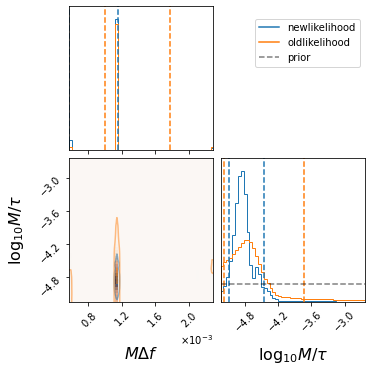

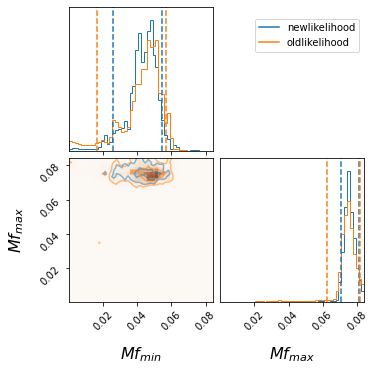

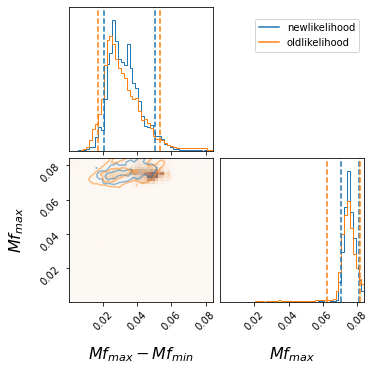

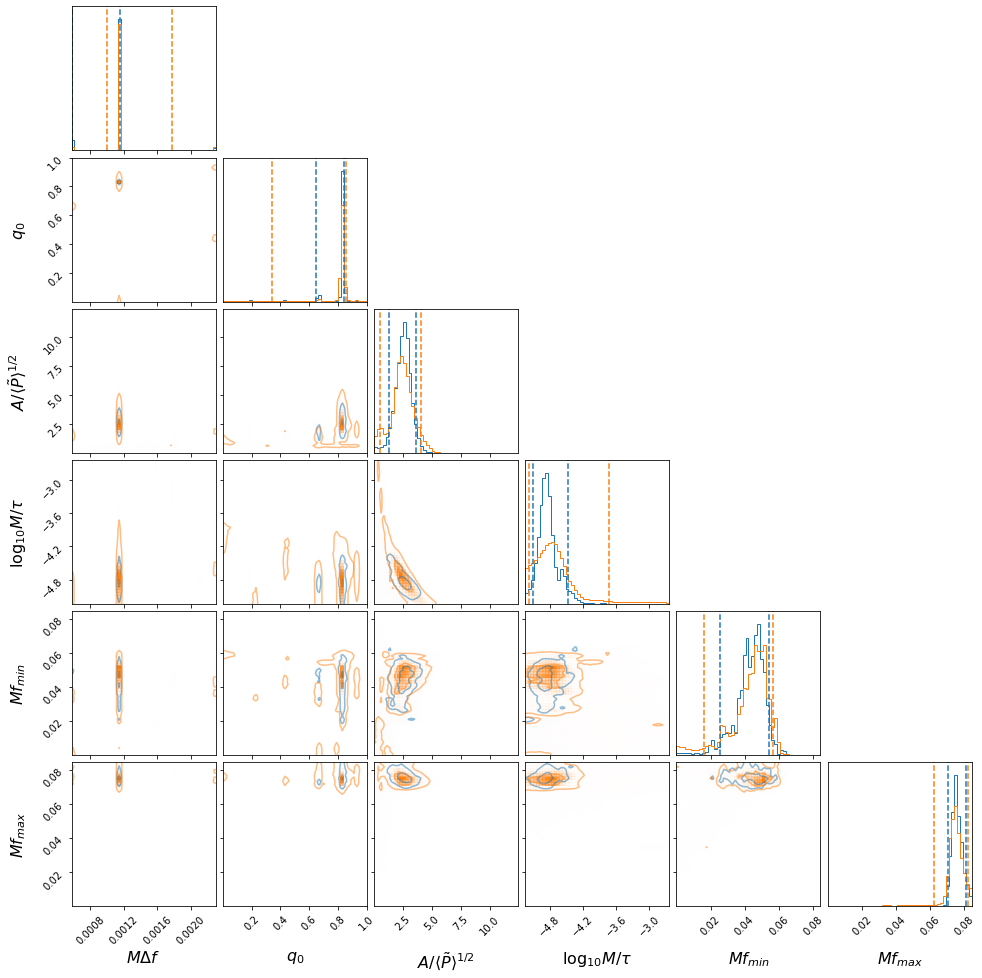

width -4.855394855653655 0.3963867358047919 0.24091284049477313
amplitude 2.549084771334351 1.049531388467173 1.27589907446626
phase 0.8313915217040416 0.00992134736222483 0.18763498033857917
spacing 0.00114925398508133 3.7920493445916387e-07 0.0005745902086947727
fmin 0.04411905815920151 0.010272032551542624 0.018649152798632256
fmax 0.07539181555808559 0.0060397290838825335 0.00474802623543924
duration 174023.48742815517 0.0 0.0
log_likelihood 62.00647749885656 24.8932505676135 39.992020607012506
log_prior 12.971160568825704 0.5548306672963257 0.9142601079665749
SNR 14.200983608346778 2.6188220102199296 5.173978499075606
width -4.7695116414862095 1.0347418805028394 0.40800324506992425
amplitude 2.443824425013137 1.6175976190278272 1.9356210177874094
phase 0.8269203712120917 0.027164872085238878 0.48560268238299
spacing 0.0011493396853236677 0.0006297984446391903 0.00014652962384685466
fmin 0.04536825212193563 0.011498768255208451 0.029239200736294692
fmax 0.07486329866406394 0.007192

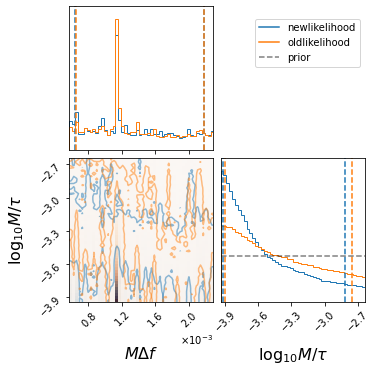

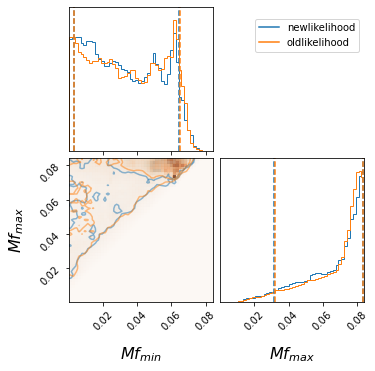

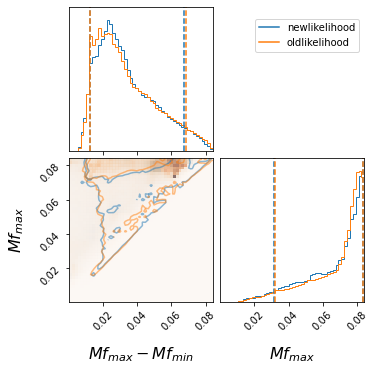

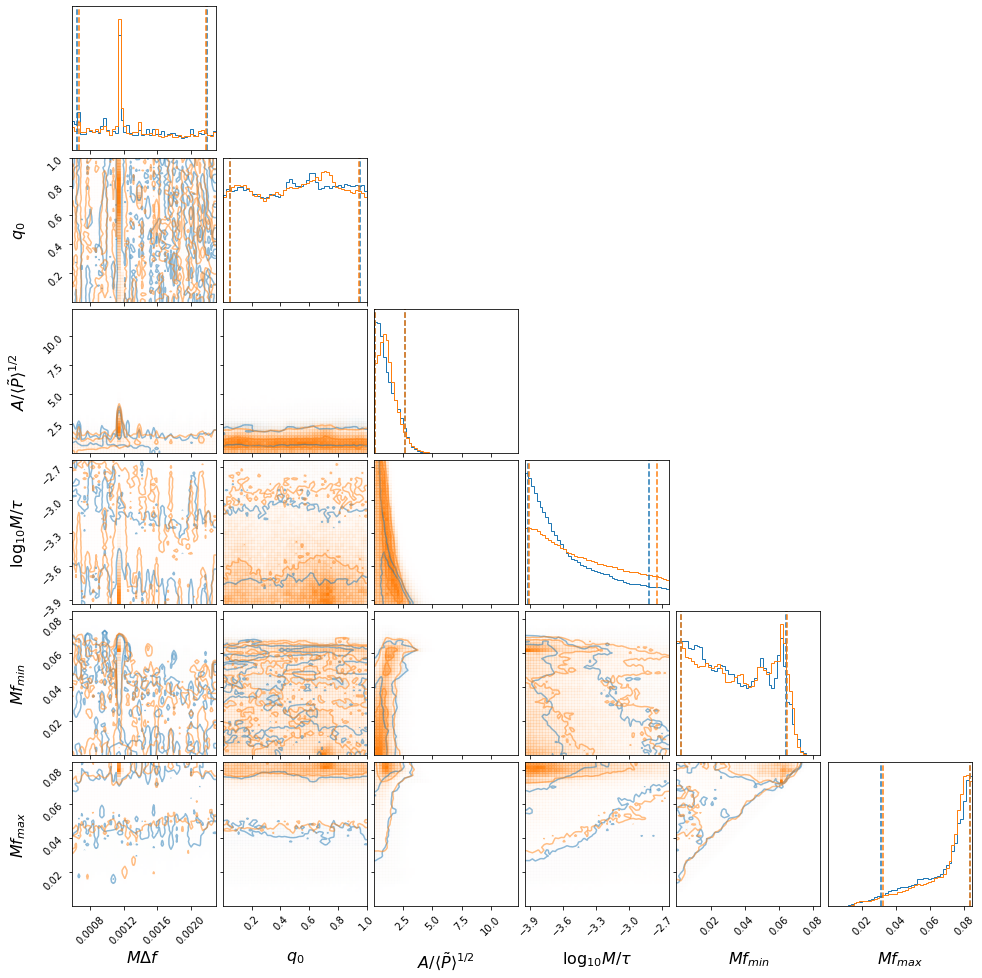

width -3.6372537713476336 0.8193832356179604 0.2799322138335816
amplitude 0.90167119808489 1.7442430622447702 0.8070321822508213
phase 0.5144169696611922 0.4358483107078356 0.46290410583884506
spacing 0.0012321904638953223 0.0009572894759644665 0.000592706635897553
fmin 0.030415086439259175 0.03377794874176497 0.027715034201372165
fmax 0.0723611311033813 0.011186841225897567 0.041104869592981964
duration 8701.17437140776 0.0 0.0
log_likelihood 2.2048179431864803 14.846912848230332 2.7837971052560477
log_prior 12.356728404245313 0.6453635652228407 1.885467057553086
SNR 4.956244498898286 4.698891572908353 4.364804334658195
width -3.4760529325924012 0.7236616861648066 0.42491314299548444
amplitude 1.0400854040792333 1.6589570434858578 0.9057345435161863
phase 0.5157819347607938 0.43157328670154715 0.4632452791432927
spacing 0.0012106112064667618 0.0009736729267795722 0.0005517422875827319
fmin 0.03320480723498746 0.031874415321664684 0.03054894565784841
fmax 0.07450494925991458 0.00904534

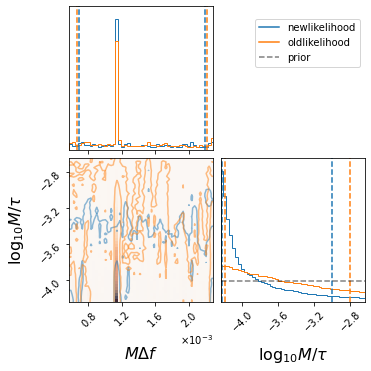

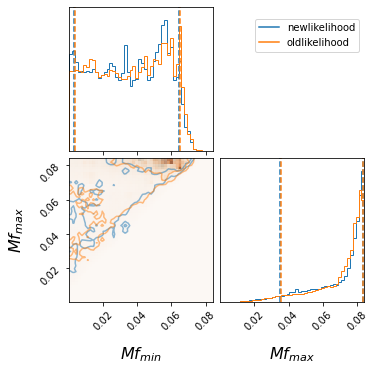

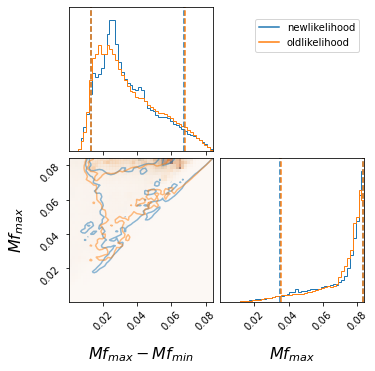

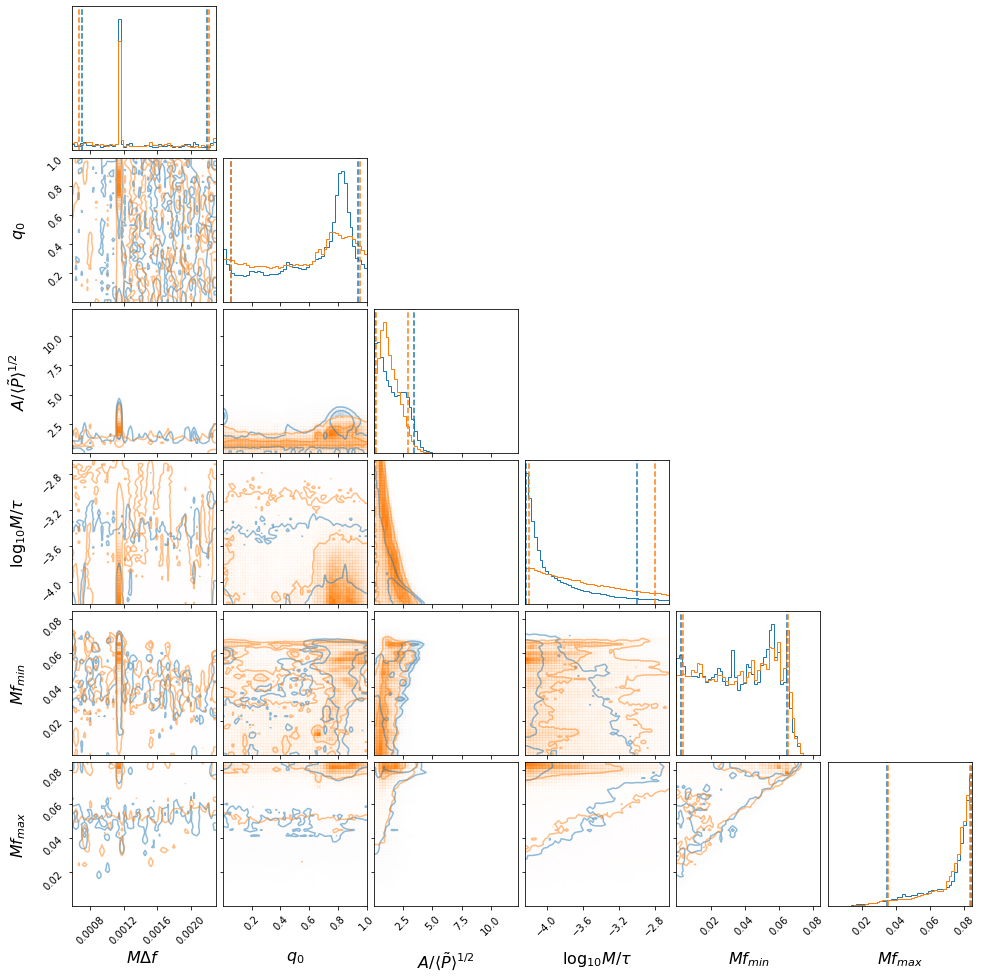

width -4.02468494176626 1.0266331332473397 0.20413337129223574
amplitude 1.379357145854881 2.037479942046369 1.2524305476962423
phase 0.6914631200640173 0.24837382263922736 0.6368589599633667
spacing 0.0011504472163284822 0.0010460206584992616 0.00045555165920933285
fmin 0.03508914776469933 0.029479306382079268 0.032141971209914987
fmax 0.07675891311829748 0.0071736029143077 0.04198830177415717
duration 17402.34874281552 0.0 0.0
log_likelihood 8.049713417565226 19.568689706781367 8.352122797717863
log_prior 12.695036152912063 0.4686327921340876 2.3659756766470394
SNR 6.910035341041934 4.469097311178001 6.008460860074894
width -3.693169808946864 0.893191122115264 0.5015059932764045
amplitude 1.1670718695239952 1.7413858312759 0.9951958895512133
phase 0.6133870166024449 0.3416683190293126 0.5599112748463398
spacing 0.0011521810203296123 0.001070397641903831 0.00048796162613873794
fmin 0.03663519434653453 0.028661017007944267 0.03302646575577644
fmax 0.07669435374184971 0.0070810724455235

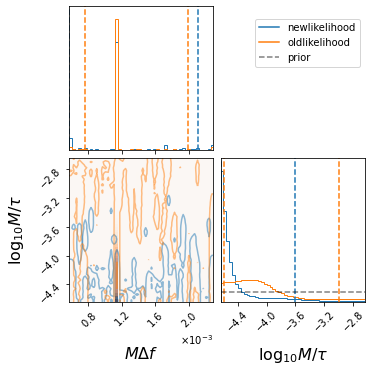

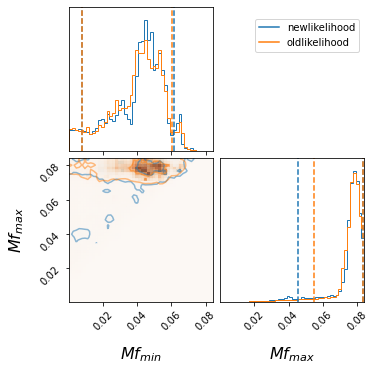

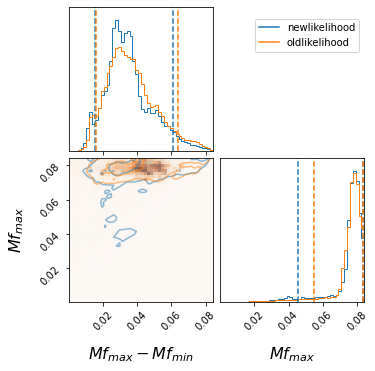

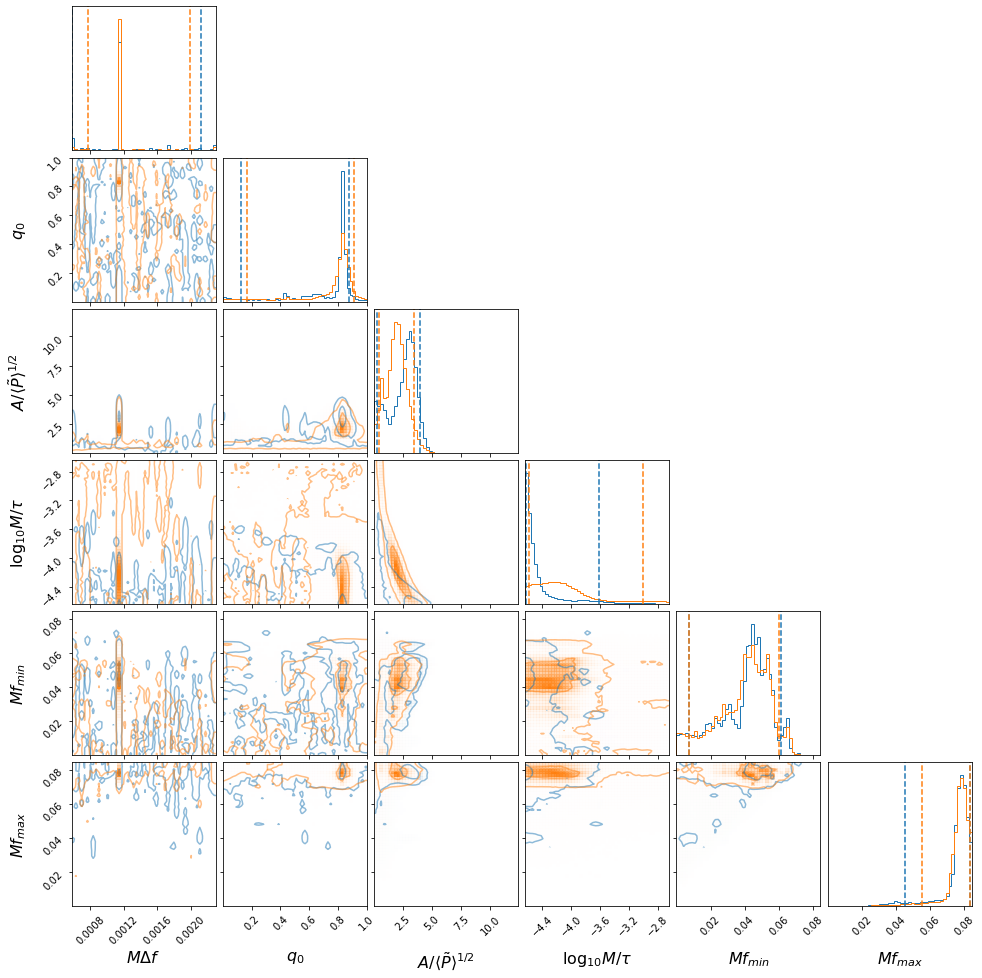

width -4.545191198366963 0.935968231104233 0.08667293093409523
amplitude 2.709681651398048 1.248348849228928 2.4341410328399165
phase 0.8213027222910233 0.05806953011819205 0.696908092701658
spacing 0.0011493251470533843 0.0009680163190131383 0.0005745116709963853
fmin 0.04358740433414895 0.017722936274262455 0.03607746449244201
fmax 0.07791351642124236 0.005531026054043778 0.03231284211564662
duration 43505.871857038794 0.0 0.0
log_likelihood 29.132854398553487 19.590153966902452 29.125733608561216
log_prior 13.212589951258956 0.20005515734017543 2.152089519674135
SNR 10.804580959570018 3.2454441910804075 8.59890243685447
width -4.16255262826062 1.1621426337219845 0.4234100136195966
amplitude 1.9290291807344193 1.523348004650082 1.4938438478526717
phase 0.819494024139614 0.09243194525286791 0.6523890934577192
spacing 0.0011493973733236276 0.0008455493520749119 0.00038271006774285915
fmin 0.0420626291197372 0.01829066248295058 0.03455123758836232
fmax 0.07792021206481904 0.005577944316

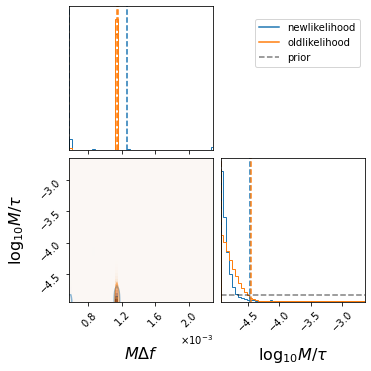

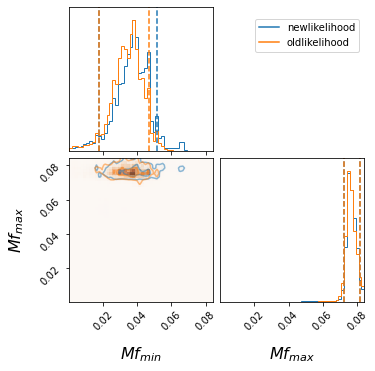

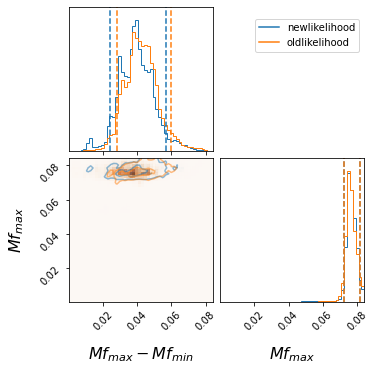

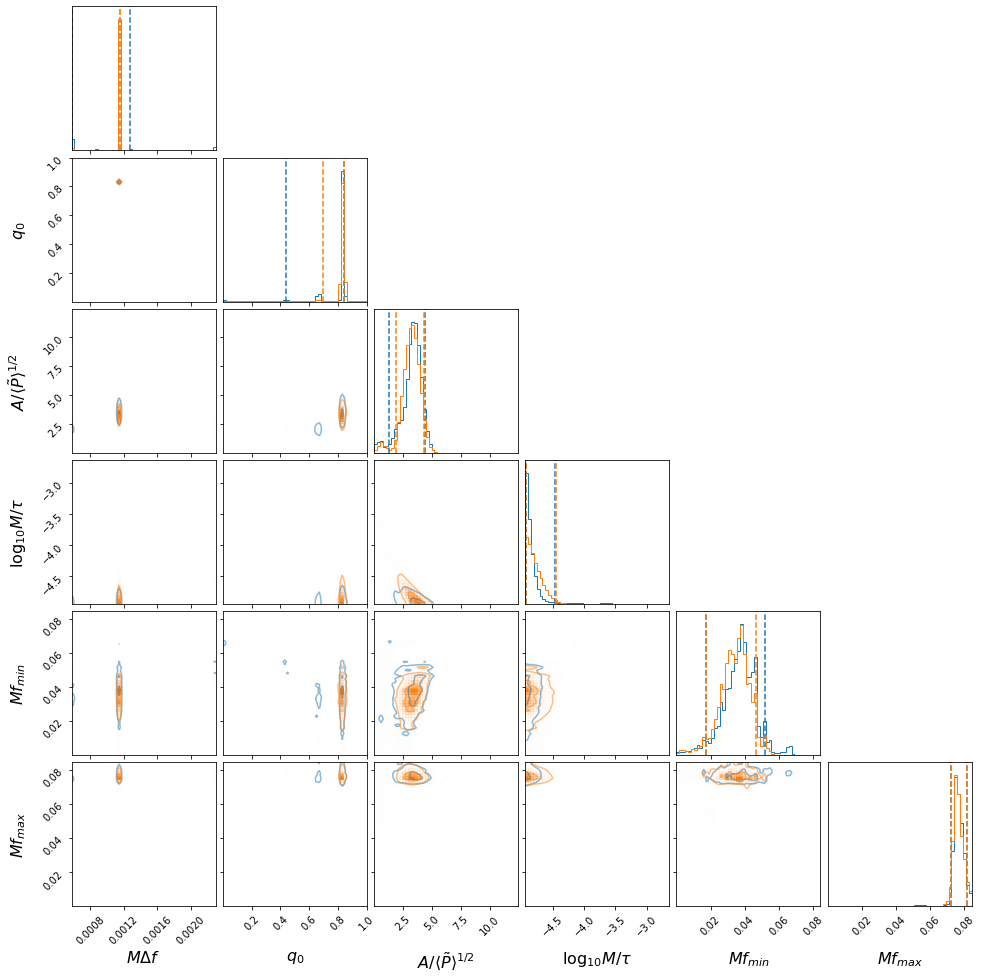

width -4.873671718910282 0.4030157187853085 0.06064844055654017
amplitude 3.380670972521545 1.0355288626768977 2.081593697275161
phase 0.8306029720490417 0.009079117853029617 0.3923155799952013
spacing 0.0011492620112695875 0.00011873929695147044 0.0005746085237818702
fmin 0.03743196555808742 0.014298508441166327 0.019824795374095622
fmax 0.07640798171273779 0.005252392590679708 0.004115266069078041
duration 87011.74371407759 0.0 0.0
log_likelihood 60.83030272462371 25.460934701162387 45.85940998050913
log_prior 13.482793502329416 0.13965603062552212 0.9249900359896426
SNR 14.427465432846287 2.651367297675222 6.503301986422005
width -4.8059010637935256 0.35933408609095974 0.12181287265134877
amplitude 3.239772362594834 1.082075365962155 1.3385284989733333
phase 0.8295879874340244 0.013831802578866292 0.13504402912290536
spacing 0.001149272648119311 3.5868376926538256e-07 3.5211685578406815e-07
fmin 0.03482516789107261 0.012064787661778376 0.01749882731152175
fmax 0.07625949247348604 0.

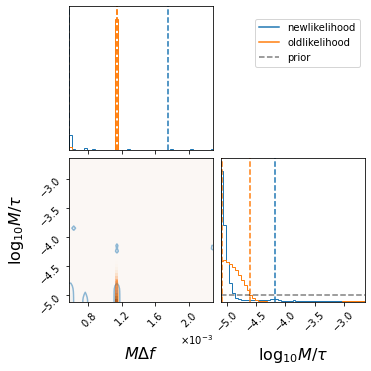

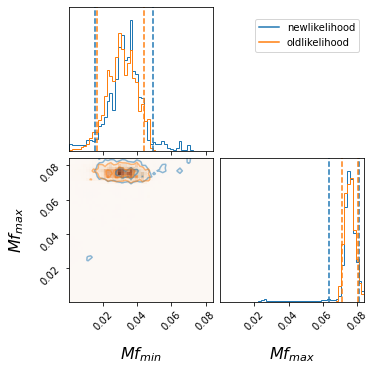

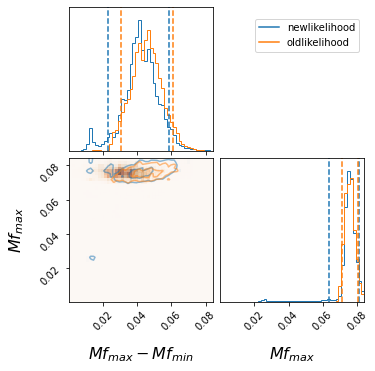

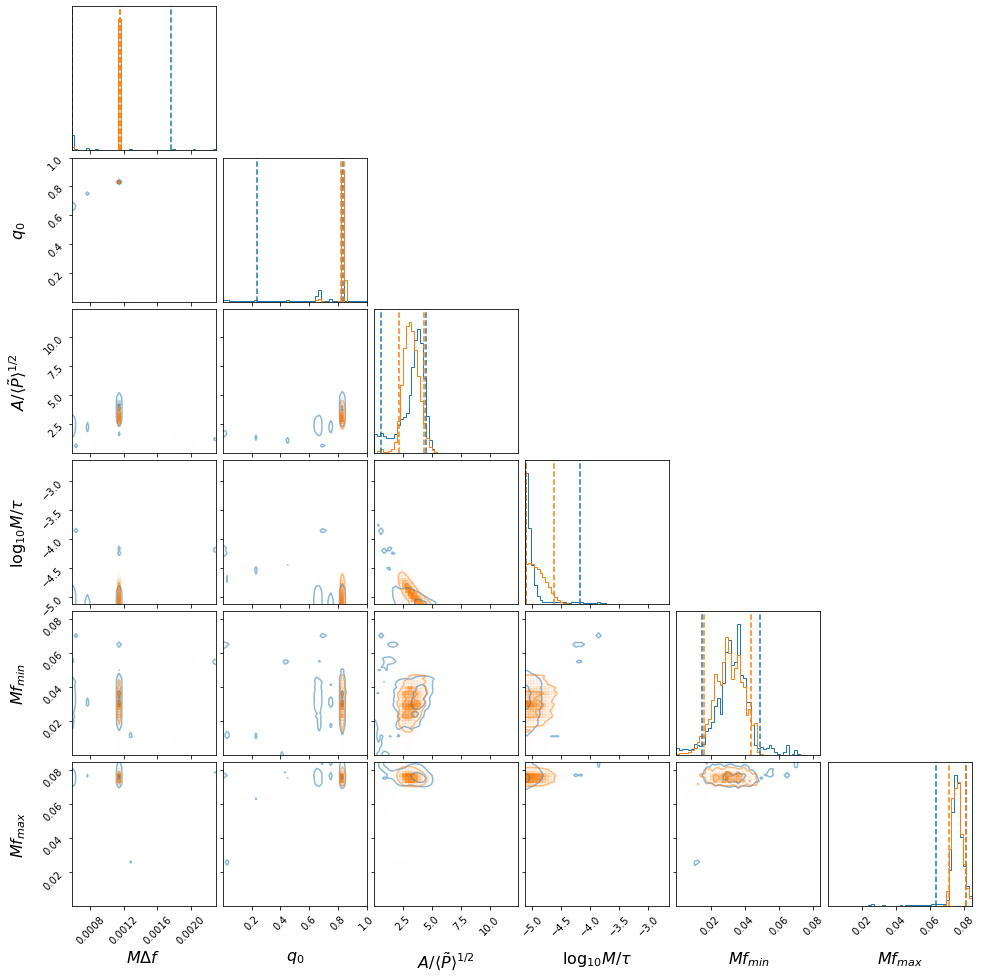

width -5.051456625028349 0.8762064382934946 0.05911699392241587
amplitude 3.5644418526397095 0.9749315281919886 2.960370989816018
phase 0.8302589487428494 0.0051355756683434395 0.5958487996084626
spacing 0.0011492726892938139 0.0006103495576079462 0.0005746407557134379
fmin 0.032905505681185186 0.016013577833394063 0.01795671691940876
fmax 0.07572779490367826 0.00549298420820675 0.012215508598251351
duration 130517.61557111642 0.0 0.0
log_likelihood 77.13110997812298 21.320150210722332 72.43488293679937
log_prior 13.616042488829548 0.13632783442382035 2.0171656027276708
SNR 15.811545704986065 2.566119733431753 10.108245696285767
width -4.91698646278677 0.29859923593268434 0.1786879873000018
amplitude 3.1699705745143367 1.1326004077717844 0.9762773690362092
phase 0.834435115797217 0.007472654706532023 0.010296317905817087
spacing 0.0011492173079729546 2.2977495608067153e-07 1.8350476286687484e-07
fmin 0.030622815776707415 0.013367887589208618 0.01446886476918426
fmax 0.07573625472814151

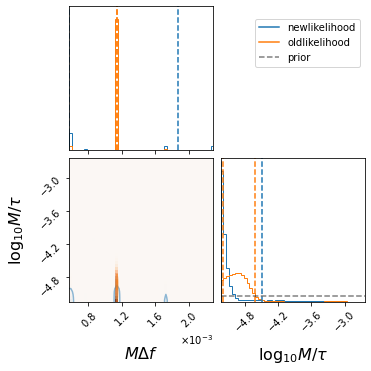

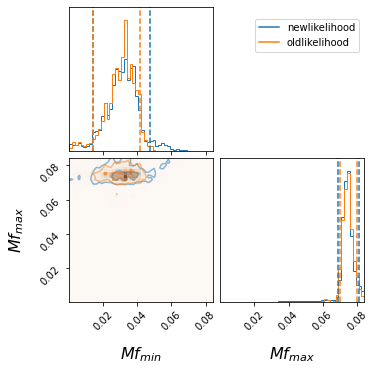

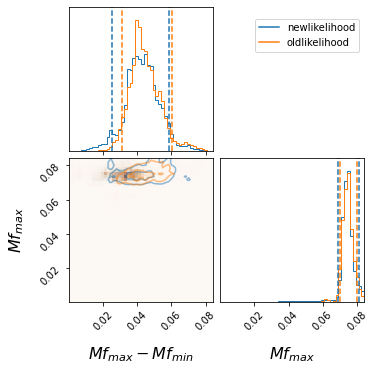

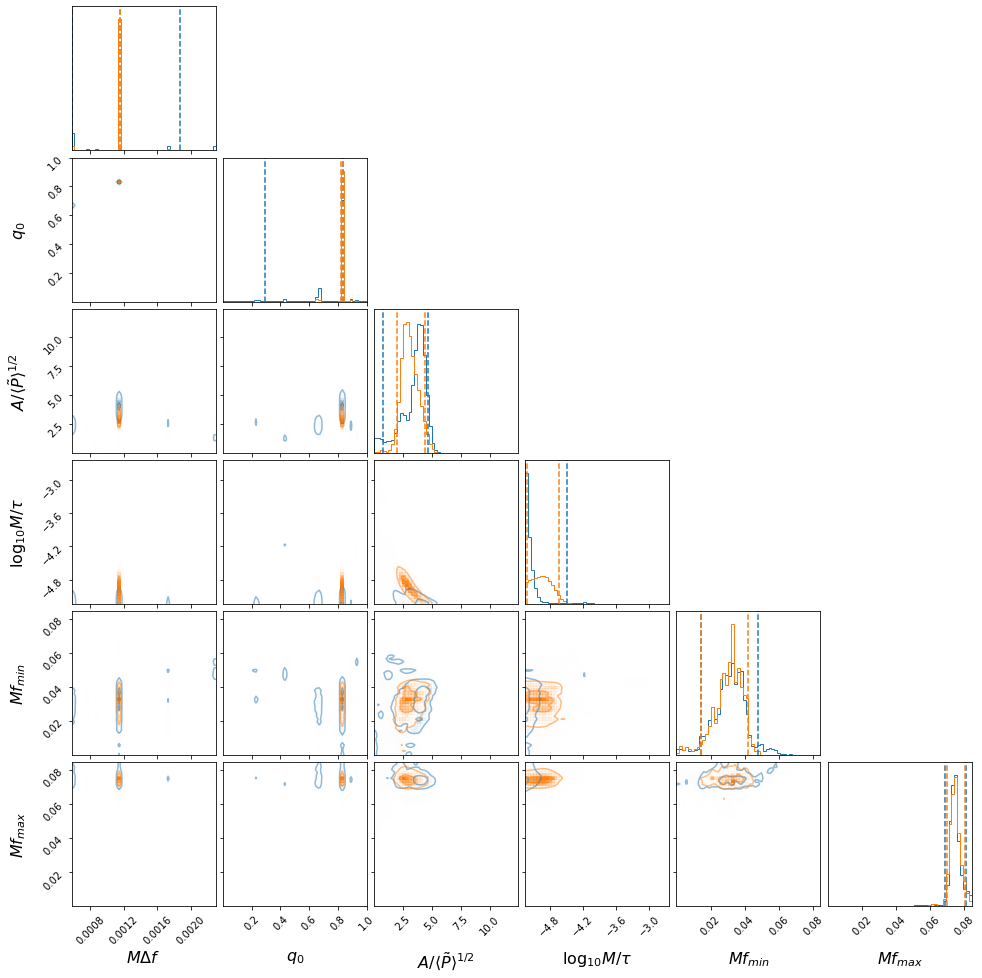

width -5.181942541677413 0.6948605538169232 0.054244816158512954
amplitude 3.7279339378272107 0.9676046456783656 2.912007629092736
phase 0.8311046148776574 0.004584803172046459 0.5347447049069811
spacing 0.0011492646660836102 0.000723652218268994 0.000574637782045809
fmin 0.0315841531082224 0.015975820003003488 0.01739106676091036
fmax 0.07440194411032043 0.006700259650060339 0.005466181806866921
duration 174023.48742815517 0.0 0.0
log_likelihood 85.06355780588211 28.710177954867774 79.32590273336001
log_prior 13.724123966566903 0.1252046668872655 1.601378863527044
SNR 16.434122749993648 2.6379482885836367 10.340077169262909
width -4.947276695383858 0.32049467165389967 0.2581902073421878
amplitude 3.0133188721869177 1.361100145359511 0.987781676117057
phase 0.8297738785698482 0.006907860584644099 0.008152377273100808
spacing 0.001149302779232042 1.6111417192499373e-07 2.0730723760005974e-07
fmin 0.031595276012589525 0.010084754805454454 0.017438081440386766
fmax 0.0745972878264444 0.00

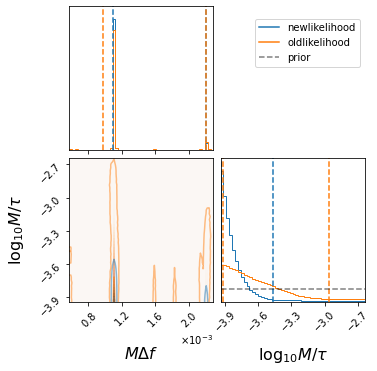

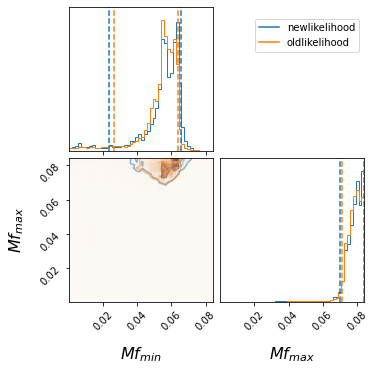

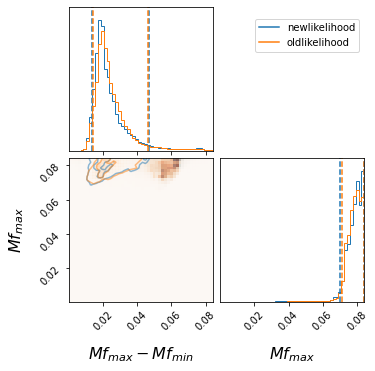

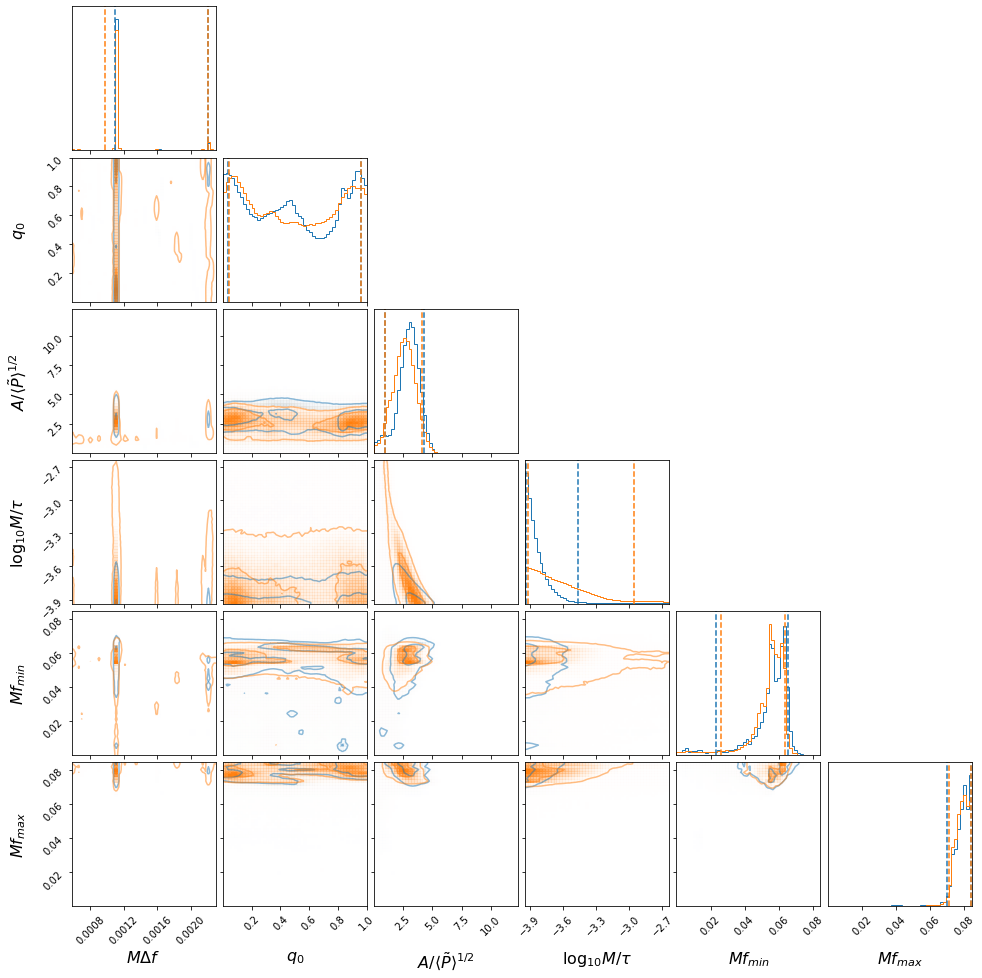

width -3.860043706410643 0.3935711324127107 0.07346562231840537
amplitude 3.0057465689384726 1.2748215481526408 2.0590275434499823
phase 0.47666560438886374 0.4839509607634651 0.439784420806057
spacing 0.0011091445920311236 0.0010955810909024609 1.3633490739702655e-05
fmin 0.05668900220356206 0.008648643749884291 0.03349003335484776
fmax 0.07939717020447577 0.004669584832024565 0.009244660566591609
duration 8701.17437140776 0.0 0.0
log_likelihood 24.18254976393553 15.498866335784594 19.047621262432898
log_prior 12.870637293069938 0.17069371741123618 0.9059122906159391
SNR 9.62030732073843 2.7041410739069818 3.969681665657033
width -3.669444922154999 0.7111650657978257 0.24695443247225857
amplitude 2.5842391154953175 1.4926623185909387 1.6389240703222687
phase 0.4855946718283528 0.4716972091697782 0.44439295812736523
spacing 0.0011087136654940061 0.0010997697997508224 0.0001358925939744938
fmin 0.05591058601943527 0.007823042901516128 0.029505862459408547
fmax 0.07895920386220738 0.0050

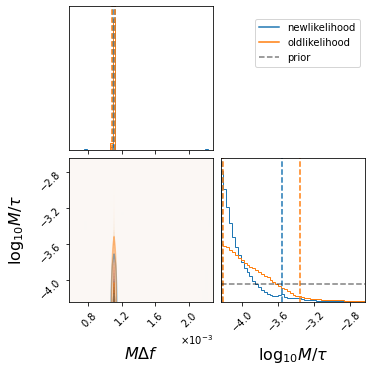

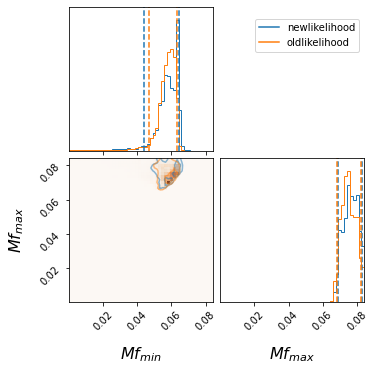

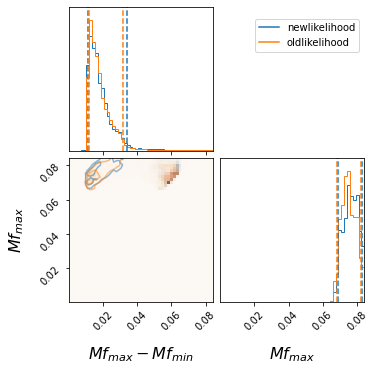

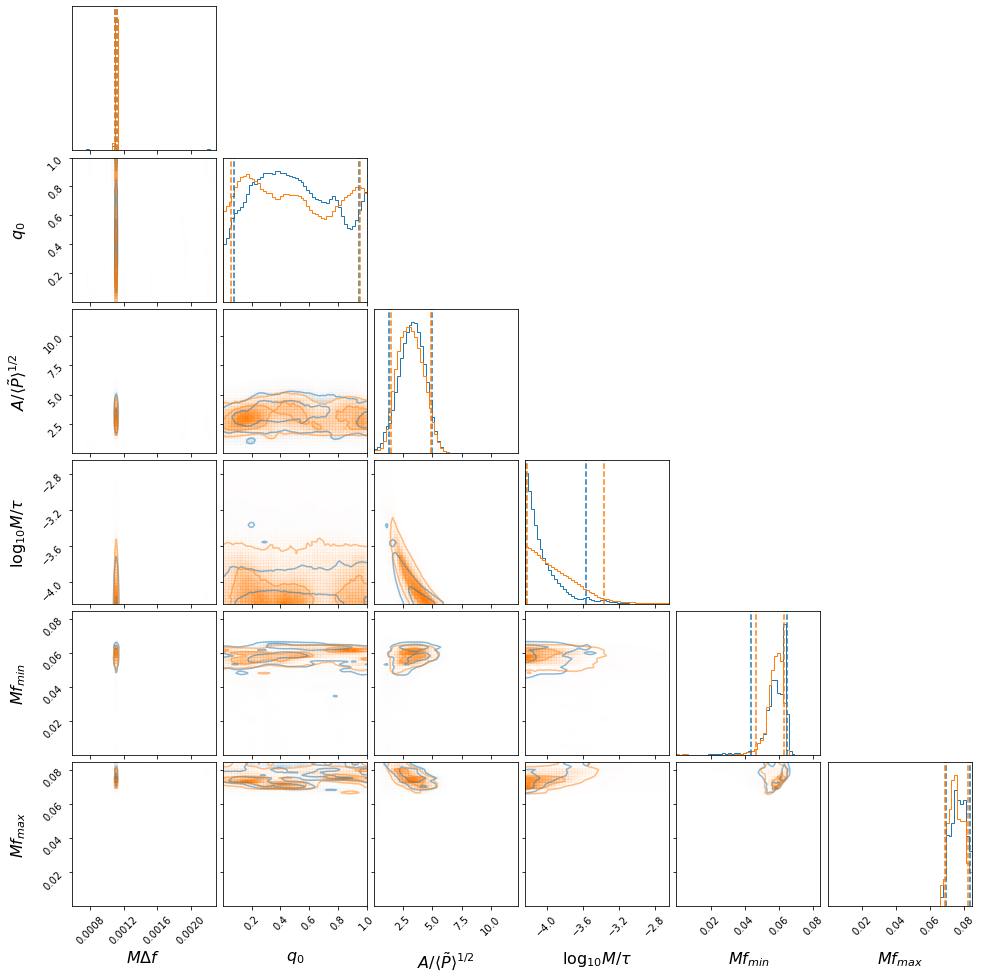

width -4.105974677823357 0.5459536461619732 0.12442124384645048
amplitude 3.2647255168777276 1.6969529136767907 1.9320864349272782
phase 0.47676435776274817 0.47207742240108697 0.40040208158861657
spacing 0.0011066129498638647 1.4305012797541502e-05 1.528336469893885e-05
fmin 0.05877817353431599 0.0057675193681942585 0.015017370421818027
fmax 0.07644353549858539 0.006766606633385588 0.007232491354221798
duration 17402.34874281552 0.0 0.0
log_likelihood 31.401952390823396 16.580814213891294 16.160299366396046
log_prior 12.881535196883629 0.28677152438969067 1.254033479051671
SNR 10.231869750647384 2.5027237432951495 2.8459298592208393
width -3.9593689025478636 0.599089276439766 0.2570855121825888
amplitude 3.0818538029362736 1.8158234425662538 1.6458413639088956
phase 0.47149723039586133 0.4814011337698847 0.4161854363302579
spacing 0.0011037156407321925 1.260794591717183e-05 1.3988037210934355e-05
fmin 0.058069367924346194 0.004976354475880615 0.011510356500985752
fmax 0.07494709035927

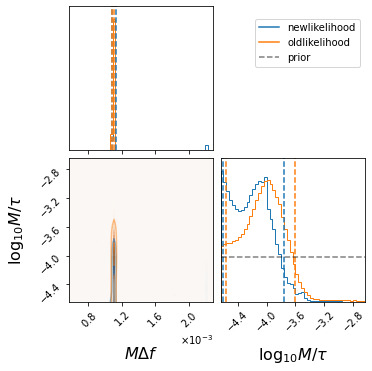

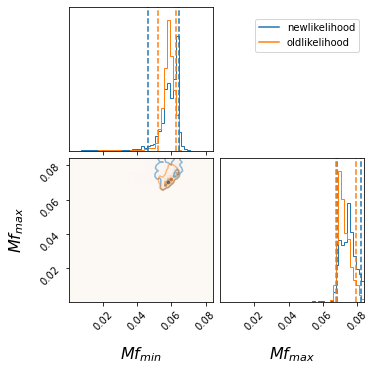

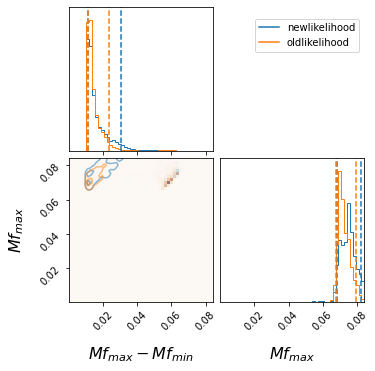

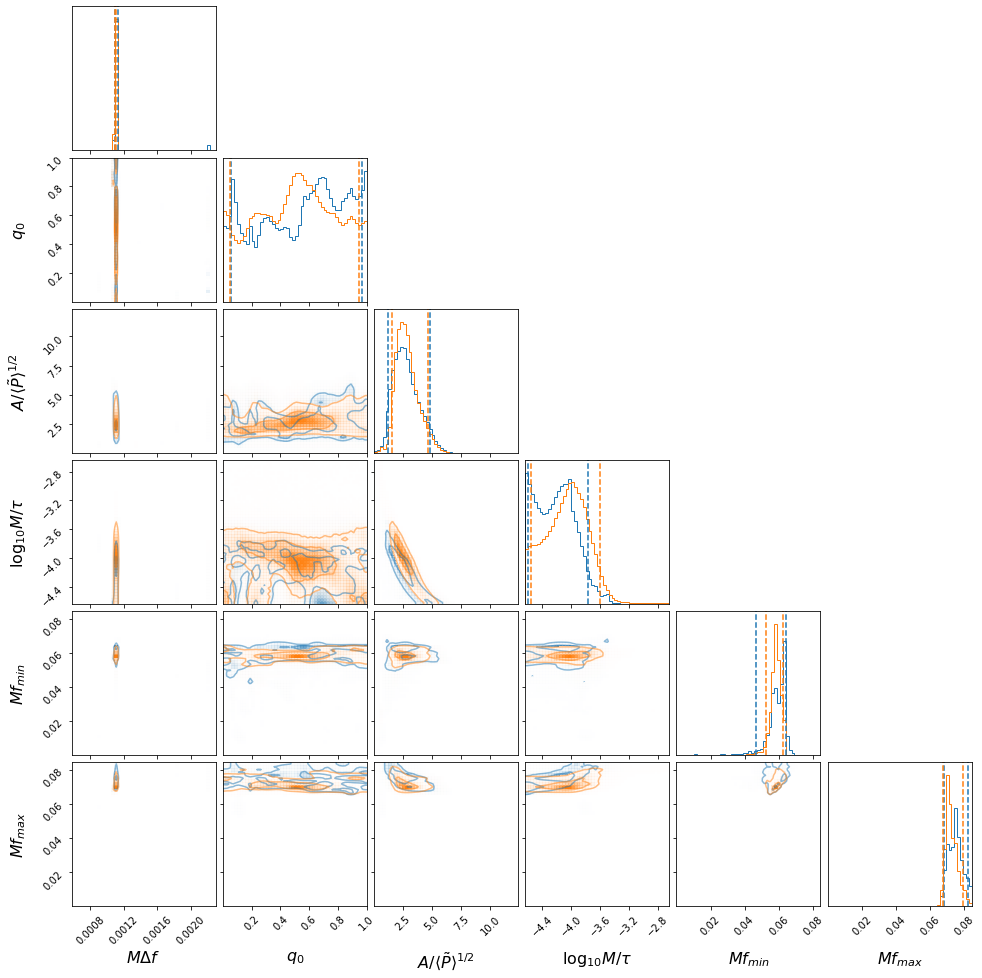

width -4.206262241861061 0.4439688011645746 0.3985793745961921
amplitude 2.624450151961691 2.199825921344759 1.428988523104834
phase 0.5865389194142783 0.3765601581632677 0.5287964591662708
spacing 0.0011053994931081472 2.3674945529766466e-05 1.570641089015121e-05
fmin 0.059492545221863674 0.004749322478828477 0.013006443460934054
fmax 0.07483639073503784 0.007454304002573894 0.006626225658579829
duration 43505.871857038794 0.0 0.0
log_likelihood 34.015111925304254 16.42109255382227 14.587407609153267
log_prior 12.432510785407768 0.917579359942069 1.0189933452613467
SNR 10.350970684262567 2.355671178497218 2.547829414792788
width -4.0477591832592825 0.4423050266172188 0.5118381235246261
amplitude 2.6990746458559456 1.9608830591428545 1.1457287010651958
phase 0.5219719337704779 0.4209268841309398 0.4696725983882999
spacing 0.001098256361438542 1.2704571534437065e-05 1.0098076622407472e-05
fmin 0.058501691716045995 0.004283652480373656 0.006094037992795863
fmax 0.07172692209381604 0.0077

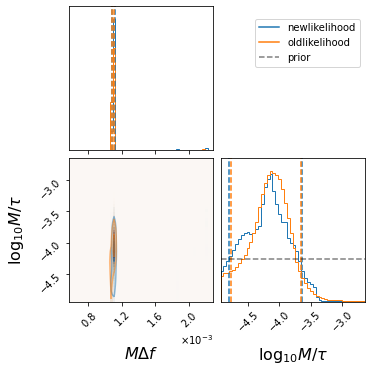

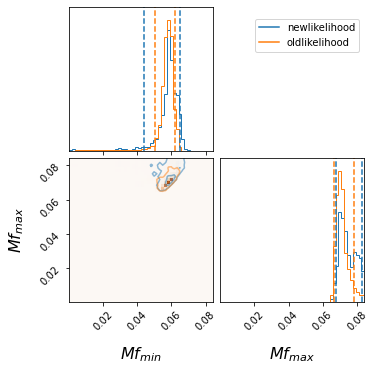

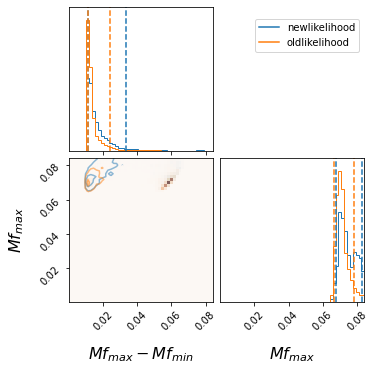

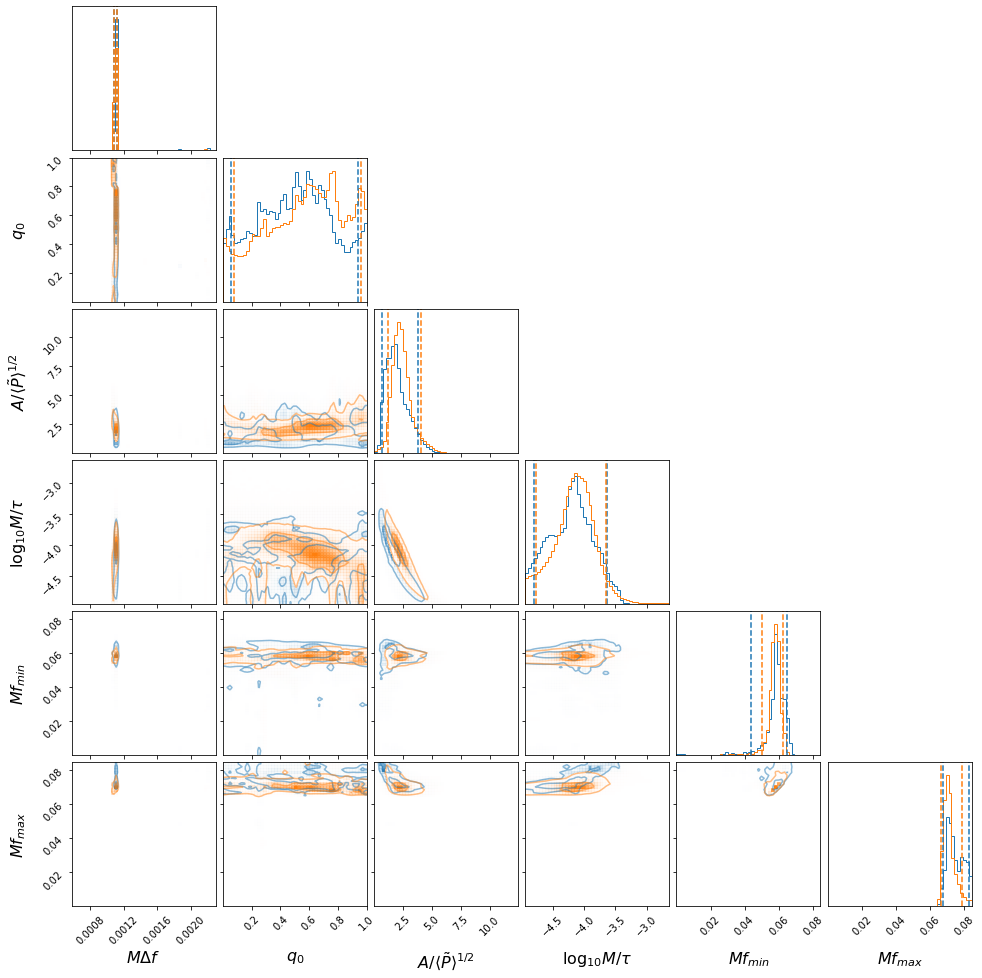

width -4.1916791630364765 0.5510307200740678 0.6120178295277148
amplitude 1.815136338303264 2.013881899910254 1.0993760968732489
phase 0.510010962499367 0.43095249927109014 0.4517139590997638
spacing 0.001100742914677966 1.9081265296228564e-05 1.440850756914496e-05
fmin 0.05882270272862724 0.006177556378164577 0.014818998015589814
fmax 0.07363776587168573 0.009223612058782069 0.005699823736183274
duration 87011.74371407759 0.0 0.0
log_likelihood 32.354932471506494 11.612022389312749 11.926166799723742
log_prior 11.91123206619605 1.410578107423488 1.268628315260992
SNR 10.17490175718471 2.1185975694045123 2.2049712546946942
width -4.142646605874034 0.48889894840237735 0.6246411372770018
amplitude 2.292511212387138 1.8038357168761512 1.0752084205531067
phase 0.5898166989835156 0.3689244963626178 0.5131646837366547
spacing 0.0010939380923969389 1.8244642608908736e-05 1.1504942540416663e-05
fmin 0.05785810739716319 0.004405920372970919 0.00742798362681376
fmax 0.07056220239753488 0.0080711

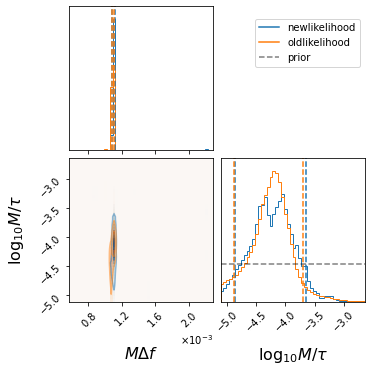

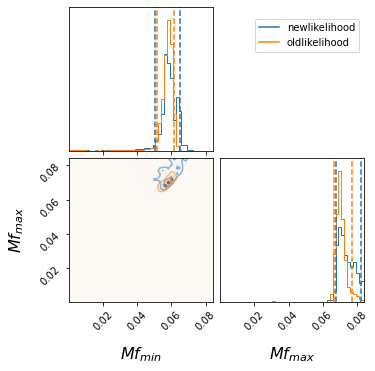

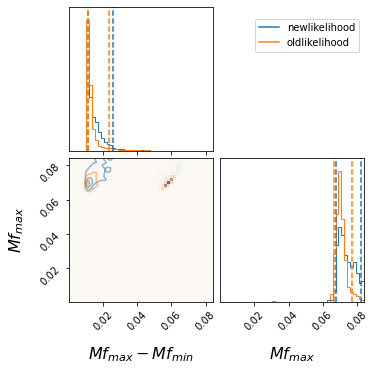

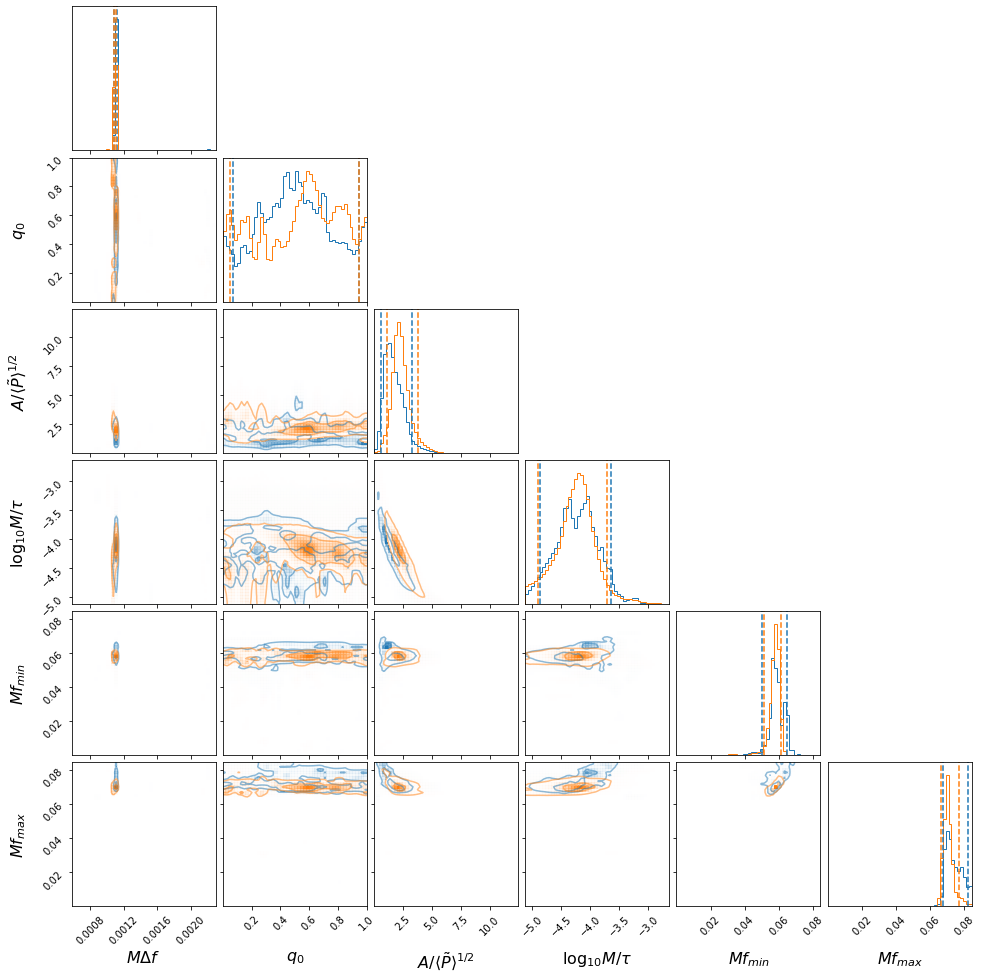

width -4.2288180181979484 0.5810084897780126 0.635186658965532
amplitude 1.5634432907995481 1.7055572693190426 0.9347029662946096
phase 0.5027868626566387 0.44322569349232377 0.4321504930072798
spacing 0.0010997536032229314 1.9011784002047512e-05 1.2987509013398816e-05
fmin 0.05853405562467991 0.006477081132232228 0.008204628161578534
fmax 0.07282053727420604 0.009770892330617995 0.004988193926755147
duration 130517.61557111642 0.0 0.0
log_likelihood 33.16982586456017 14.285471035984799 13.877452558607057
log_prior 11.721328019630459 1.4624460353421416 1.3373282566838682
SNR 10.152337310039622 2.269104739585689 2.415524480881186
width -4.237662032405496 0.5316178003487919 0.6519634990504874
amplitude 2.2318133188696794 1.6029681668650544 1.105808245559926
phase 0.5647619196450724 0.3836146964226784 0.5161397871156036
spacing 0.0010923572561947453 1.286468332588873e-05 1.0945032764632856e-05
fmin 0.057912819214728156 0.0033374354128231365 0.006295896397075118
fmax 0.07027904901599533 0.

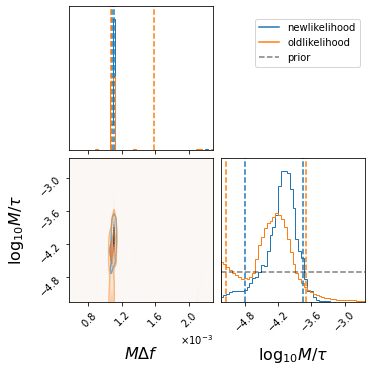

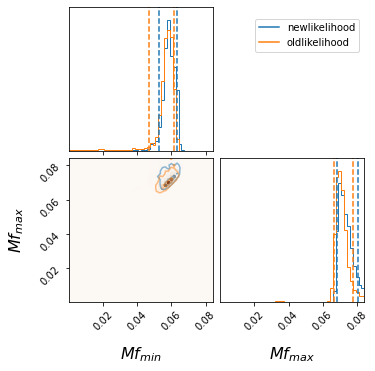

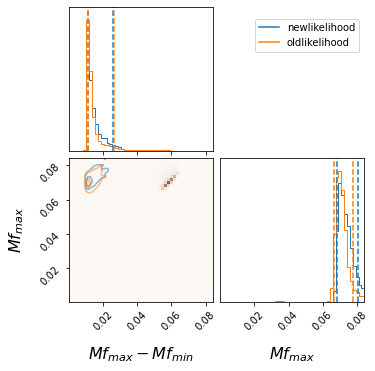

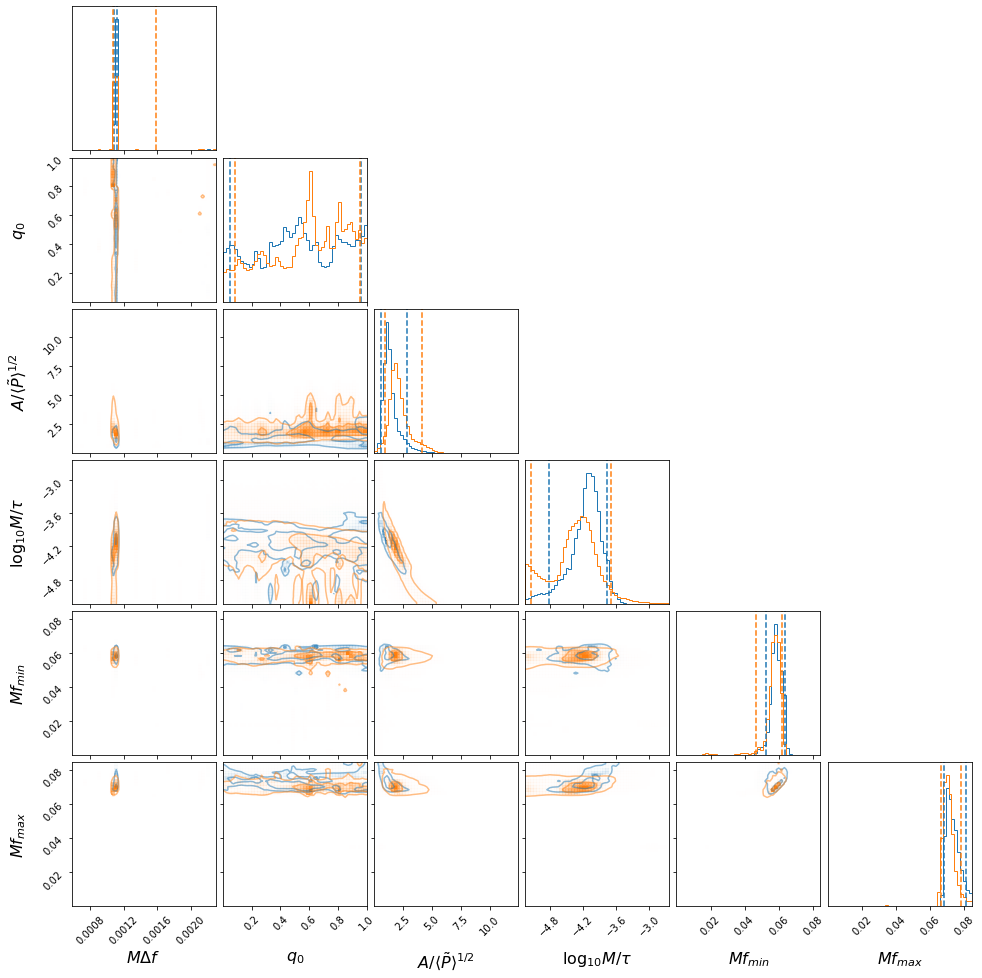

width -4.118462526345921 0.360501512997212 0.686259292770341
amplitude 1.2576485365010956 1.614922838557642 0.6471298308487521
phase 0.5239478344188145 0.43786545146792344 0.47205767838277324
spacing 0.001098422920785861 1.4718460739655782e-05 1.1987595502796575e-05
fmin 0.058581219807347366 0.0048130779092328616 0.006155740347869948
fmax 0.07262903580877199 0.008367759066307268 0.004456759657981937
duration 174023.48742815517 0.0 0.0
log_likelihood 36.95200691085118 13.22286914589737 13.36763354074828
log_prior 11.273817812006452 1.5816551747573087 0.8297369550623781
SNR 10.552187711402574 2.148393445490969 2.2335608694553972
width -4.310944114378145 0.6207961866228184 0.8322288022778137
amplitude 1.9946182897560512 2.1338974283375816 1.040404985007966
phase 0.6104365869918424 0.3455818576426908 0.5236089542674675
spacing 0.0010919427905401384 0.0004951978002374147 2.088169782988366e-05
fmin 0.057693941881228915 0.003975287311461427 0.010754098993845662
fmax 0.07046341459831294 0.0074

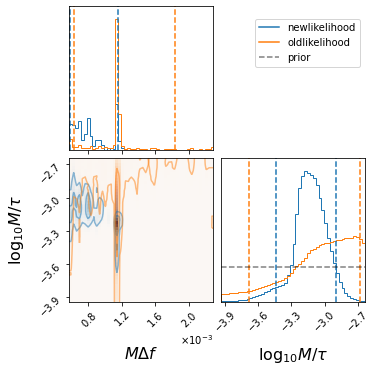

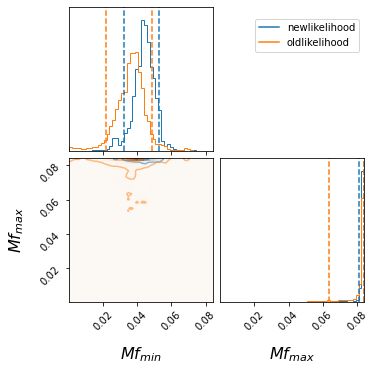

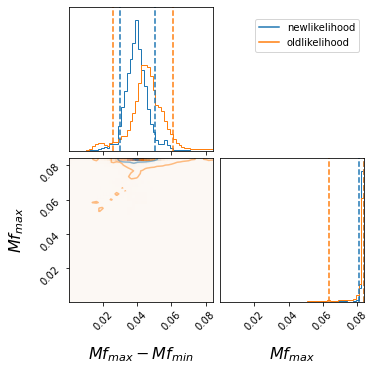

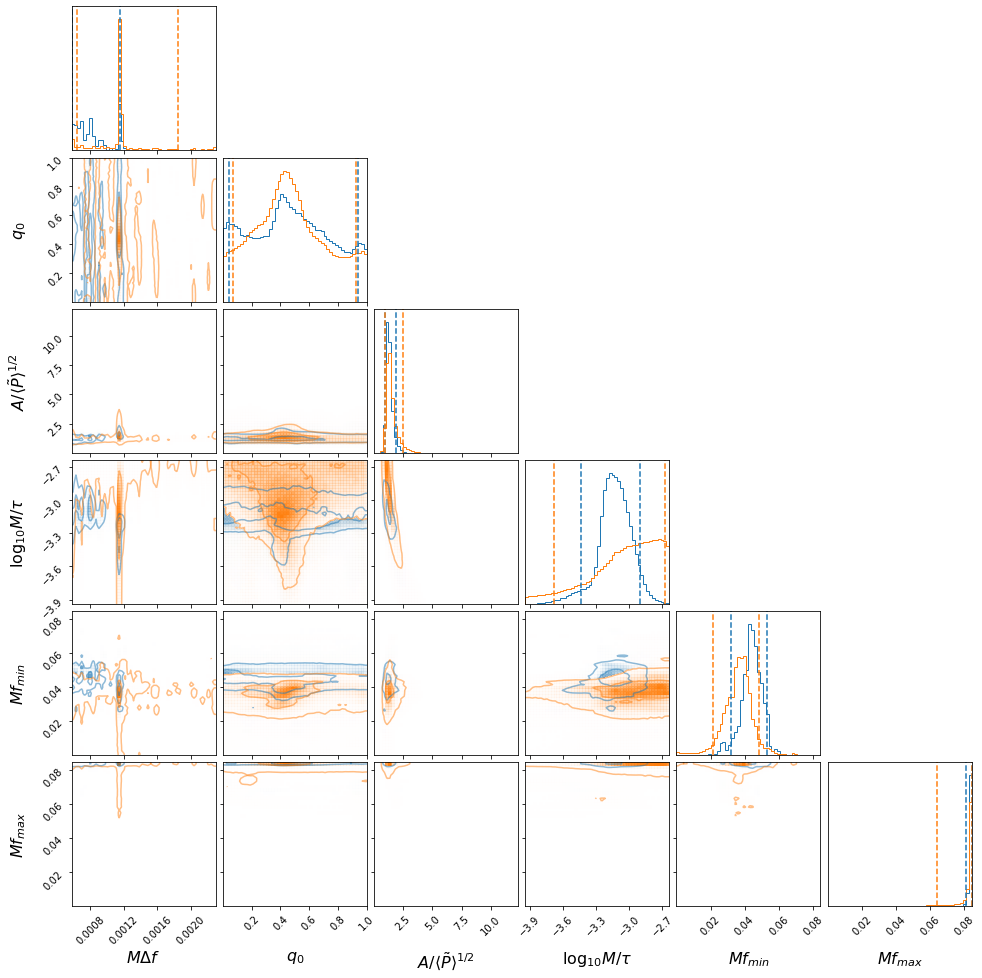

width -3.130892572311992 0.23084641098349978 0.30846807568921264
amplitude 1.2573596607881206 0.5996599024281146 0.31312215308148883
phase 0.4647097387051201 0.47153765420913274 0.41832989403112053
spacing 0.0007864688119492858 0.0003664993827905065 0.00020641148249451492
fmin 0.04420458798139599 0.008723876489380819 0.012150000753221507
fmax 0.0838968980078696 0.0004997451498128386 0.002707914703205569
duration 8701.17437140776 0.0 0.0
log_likelihood 49.63135077609221 20.296607855491665 15.640192266465725
log_prior 11.192655795006491 0.7028115712963281 0.5352783223053894
SNR 14.25235744772361 2.7015094714501497 2.74799432922819
width -3.0045559832333515 0.3277982826755146 0.6764419986702177
amplitude 1.3613890644160411 1.087081764524324 0.41638170903398586
phase 0.4518409972471446 0.47513828675871034 0.37854463877841343
spacing 0.0011397322068980866 0.0007013038379823186 0.0005053052105993307
fmin 0.036699564440928666 0.011838378283316811 0.014998025934913766
fmax 0.08365489940540723 

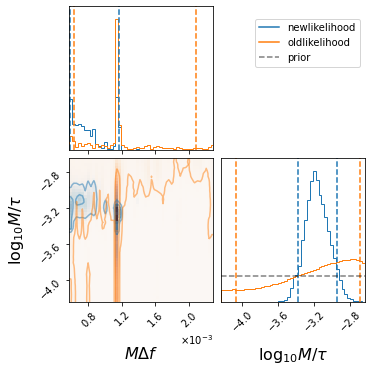

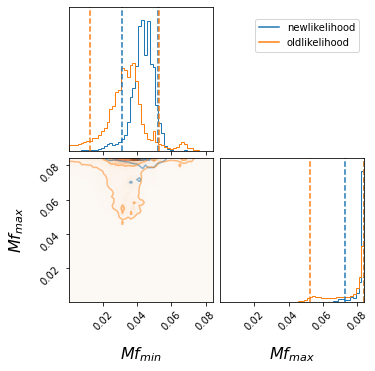

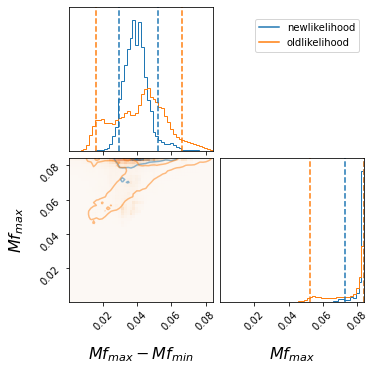

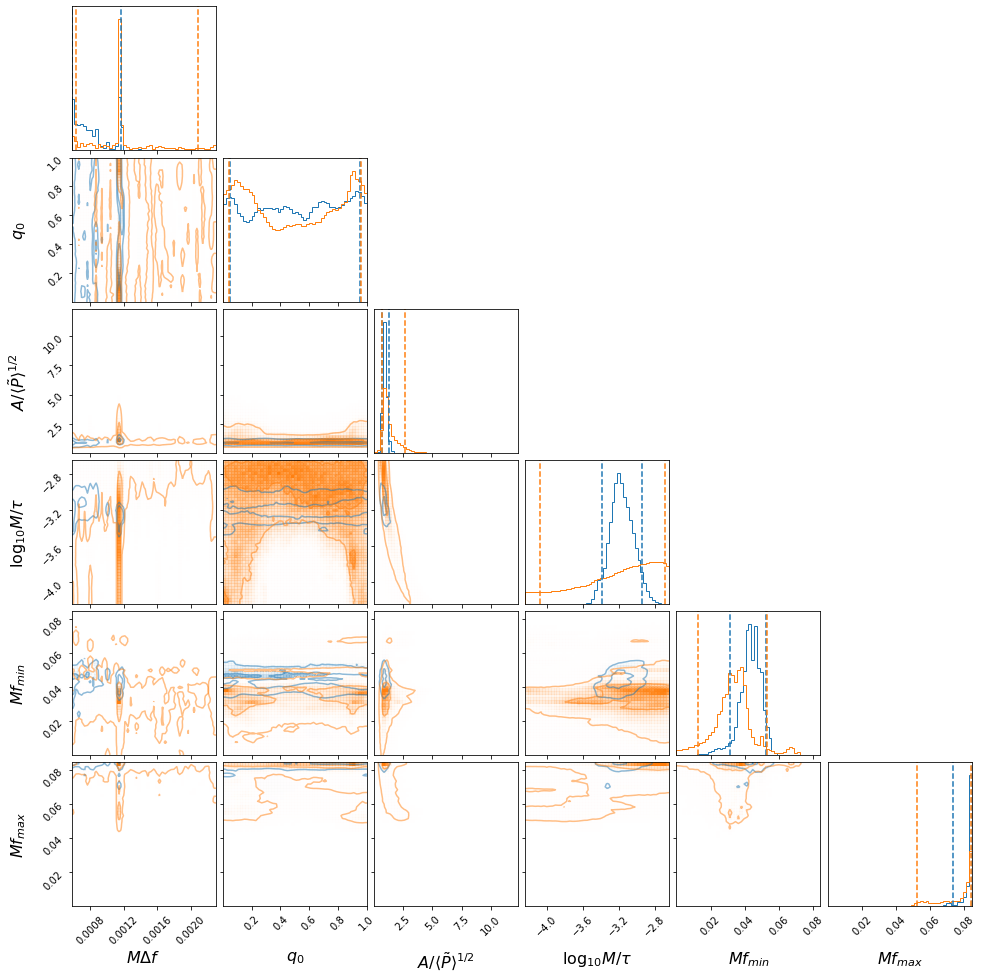

width -3.176141962730977 0.23336731919210196 0.208985938117491
amplitude 0.9002554880309434 0.36339333144625174 0.23878297754762412
phase 0.5124448342415584 0.44182947401138917 0.4657157416110621
spacing 0.0007576269934275716 0.00040632598430888876 0.00017975505063729815
fmin 0.0434559646298223 0.008889767183027891 0.01229707829008458
fmax 0.08372690210096966 0.00066105653082979 0.010454689460140595
duration 17402.34874281552 0.0 0.0
log_likelihood 45.56439034628856 17.50123460023044 15.576986282756707
log_prior 10.73982135538362 0.4848027039214351 0.5369218524654542
SNR 13.840959082663579 2.6974451003379496 2.802653480467715
width -3.1513178706545157 0.4606978835523008 0.9203471841402213
amplitude 1.1075548341322077 1.5976247901843412 0.4526229259636766
phase 0.5004509160990669 0.4577529809661185 0.4572811515308267
spacing 0.0011501645405017488 0.0009354788698814186 0.0005258703998980643
fmin 0.03346886025587167 0.019355621492152746 0.02106181658382758
fmax 0.07994300823880018 0.00428

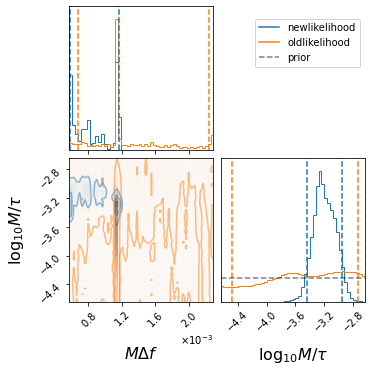

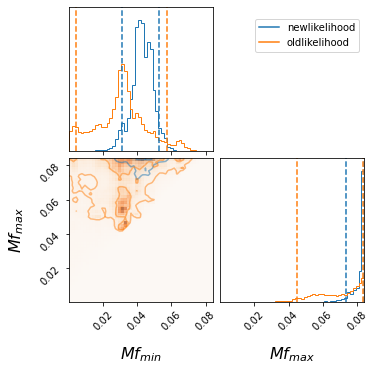

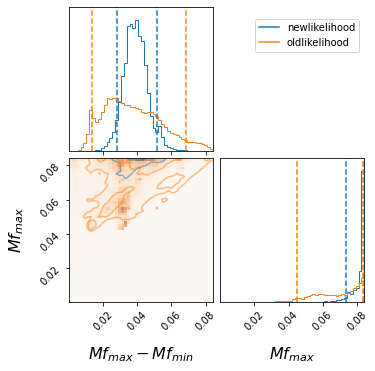

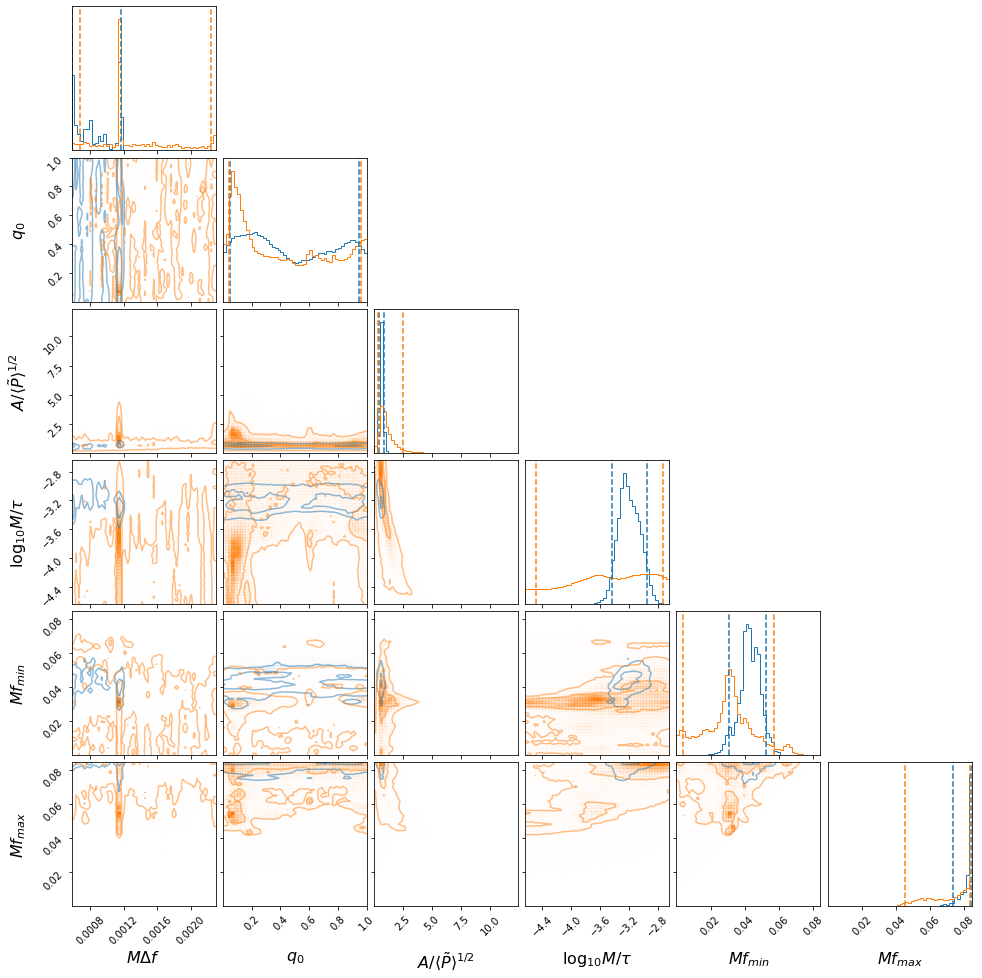

width -3.2069444080382965 0.25832951644048663 0.22740755761526055
amplitude 0.5858523751070044 0.2465140052493805 0.1534409465482039
phase 0.4491278469466772 0.4986904335192587 0.3989000351524212
spacing 0.000807152164483573 0.000358658511244986 0.0002313312026830319
fmin 0.0428648582835959 0.009863879885201945 0.011949808818929555
fmax 0.08334615953605683 0.001008069168232359 0.009822650137869302
duration 43505.871857038794 0.0 0.0
log_likelihood 43.57239429041254 13.331809212430187 12.93027001603
log_prior 10.132427279061856 0.5224348123229721 0.5942197354442893
SNR 13.474719469015572 2.7211434964714485 2.6330384503648148
width -3.4857581314938497 0.7575098338652073 0.9963027059501779
amplitude 0.9067472879418829 1.5499618163548337 0.5737620411059254
phase 0.39807113598539984 0.5581565051272674 0.35565116324038587
spacing 0.0011530694875672041 0.0010883592728277575 0.00047876921228464276
fmin 0.030946412941069812 0.0263899058805213 0.02692372936147671
fmax 0.07064505045343857 0.01308

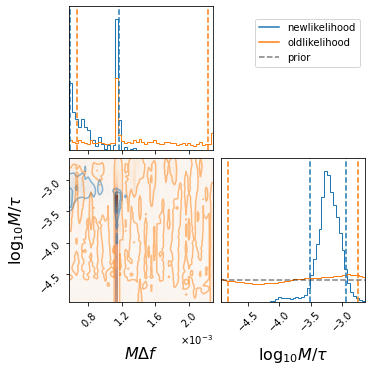

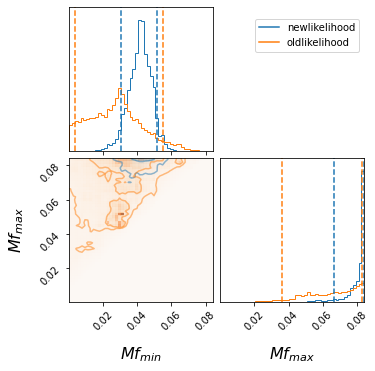

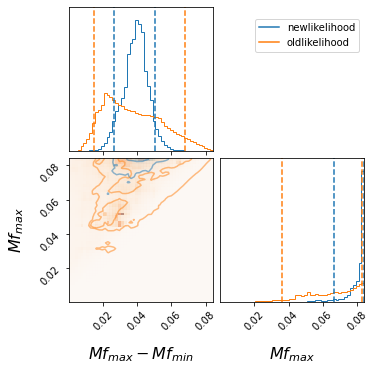

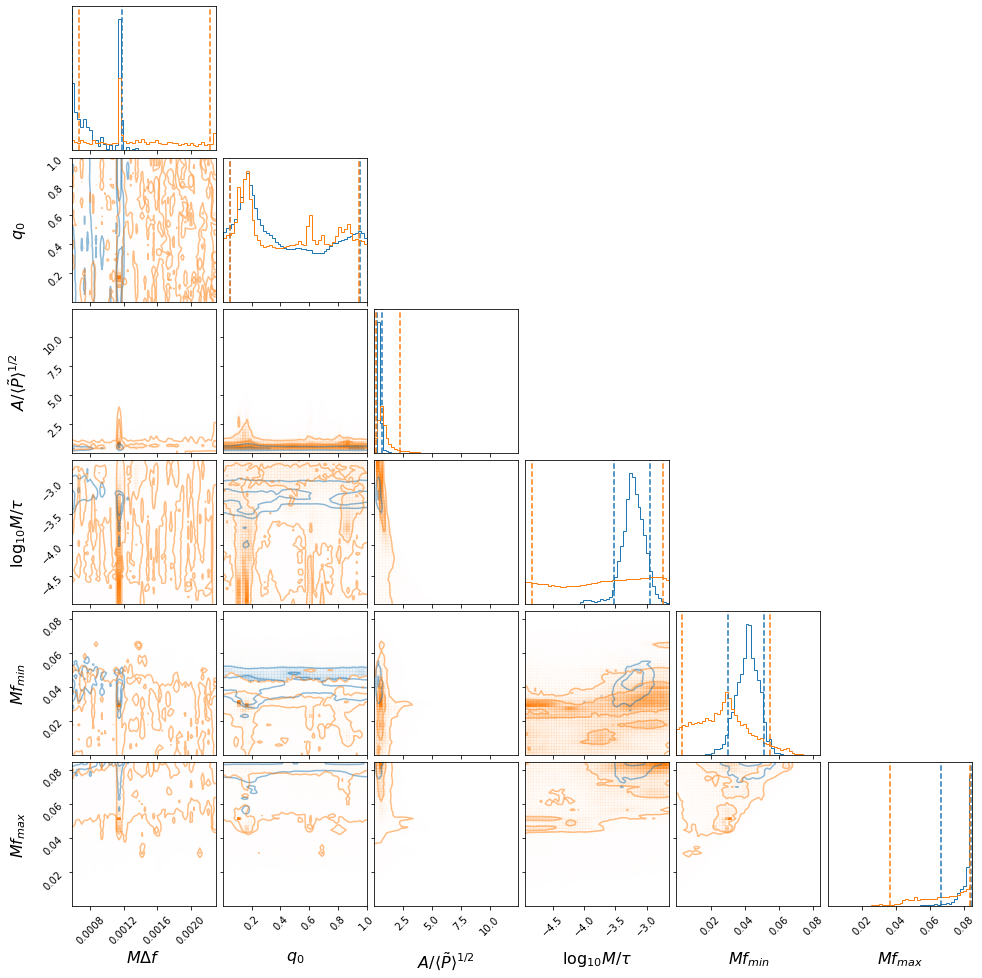

width -3.216096967228849 0.27639247748389684 0.30164550212589436
amplitude 0.4165802235338295 0.24839678762394057 0.11399288108636974
phase 0.4034701418852628 0.5459554709717145 0.35617035016803805
spacing 0.0008072850410557737 0.00036401310978376384 0.00023106721242523414
fmin 0.04186140524155787 0.009712162724083019 0.011572804899383494
fmax 0.08283520410896333 0.0015139804264566598 0.016109219001482794
duration 87011.74371407759 0.0 0.0
log_likelihood 43.03759864923523 15.439478888306894 13.5308852767802
log_prior 9.666131623962539 0.6955824007738372 0.6348537537702477
SNR 13.400025691160952 2.86833979515659 2.798767584722812
width -3.6510863435684744 0.9107622057876532 1.1725812597762113
amplitude 0.6895782310168844 1.5741390200217684 0.5326830574549852
phase 0.4682325763175188 0.47495697329925246 0.41604320312423937
spacing 0.0012666702151505815 0.0009640068081834025 0.0006046512058897369
fmin 0.02730992684330639 0.02778812289768527 0.02385101625014909
fmax 0.06750524238779107 0.0

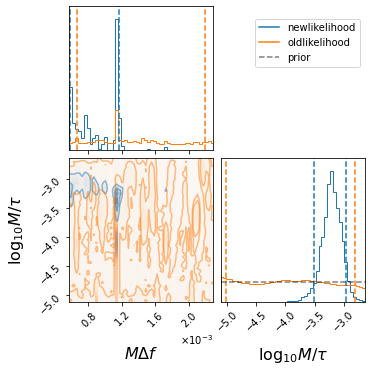

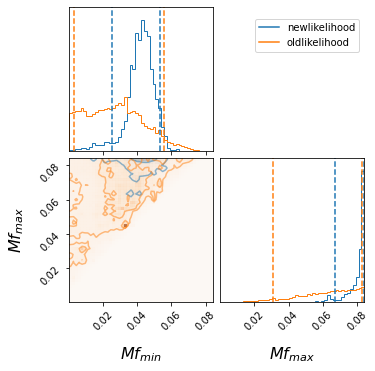

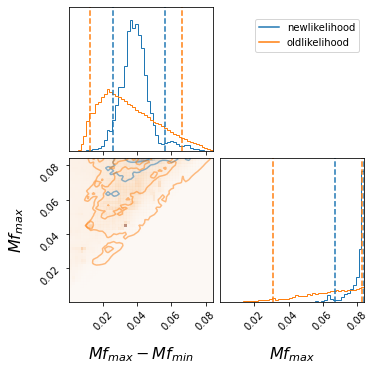

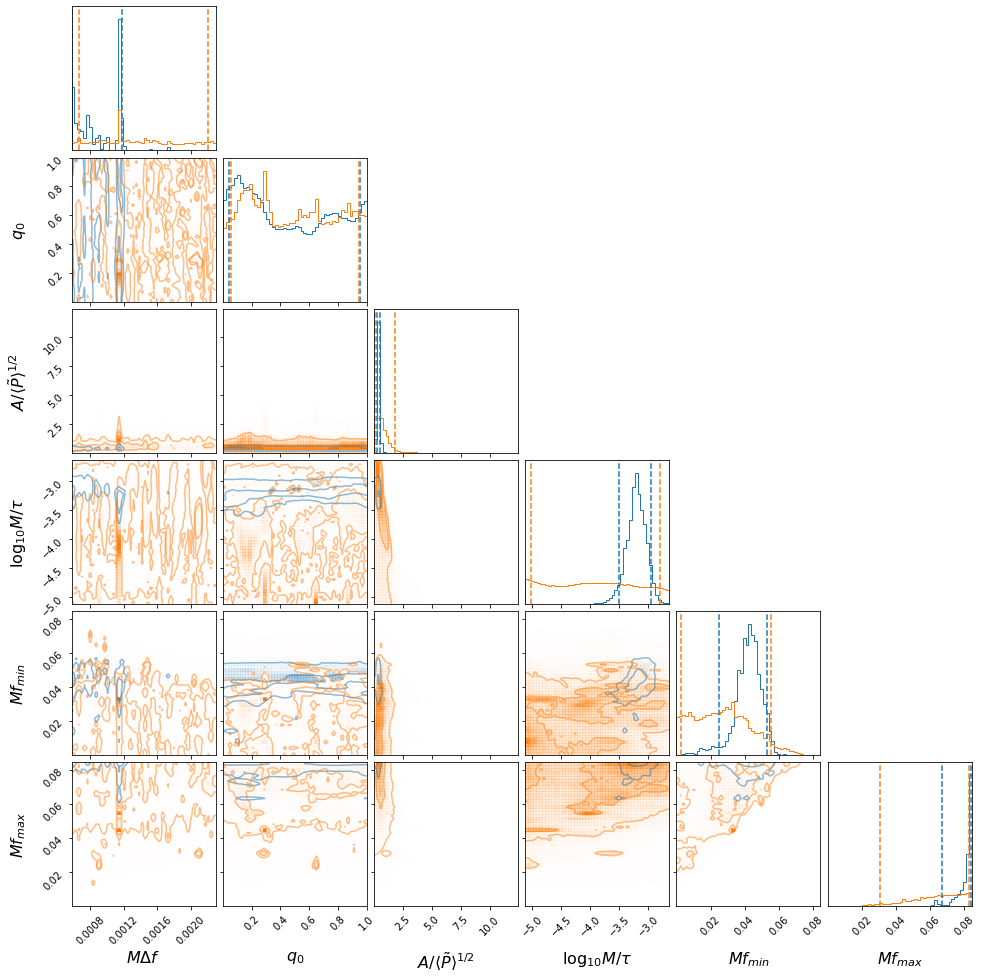

width -3.206158308688982 0.2555830657355913 0.29625726143224096
amplitude 0.33862398286801776 0.19899071608390873 0.09112538810569837
phase 0.4487495546260921 0.5059372974032902 0.4074465011428411
spacing 0.0008885019939861583 0.00028285208187285463 0.00030950422728189073
fmin 0.04260673562311665 0.010720620625393043 0.017609141761534306
fmax 0.08259457914686441 0.0017417891112410377 0.015492881846155784
duration 130517.61557111642 0.0 0.0
log_likelihood 42.424262509341055 15.681799245263079 15.314749176818001
log_prior 9.36714377053703 0.6834918691157323 0.5882363805494659
SNR 13.286657606278139 2.7471165344980637 2.977612173443358
width -3.9267244124324194 1.1272076939487468 1.0910593759979164
amplitude 0.6509039449534537 1.215826466320976 0.5415360950068876
phase 0.48269440322059165 0.46605043593194395 0.4259293181999758
spacing 0.0013231116030012929 0.0008782894921609329 0.0006564271156949984
fmin 0.02666113938866899 0.02881575057864073 0.023938170871741313
fmax 0.06506198333792064

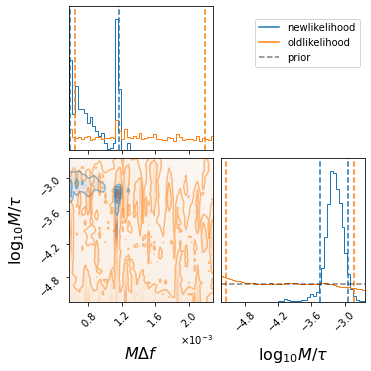

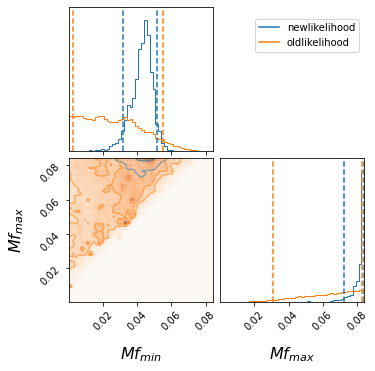

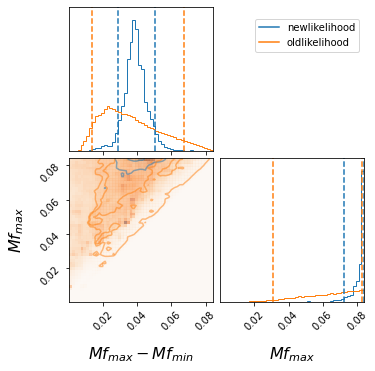

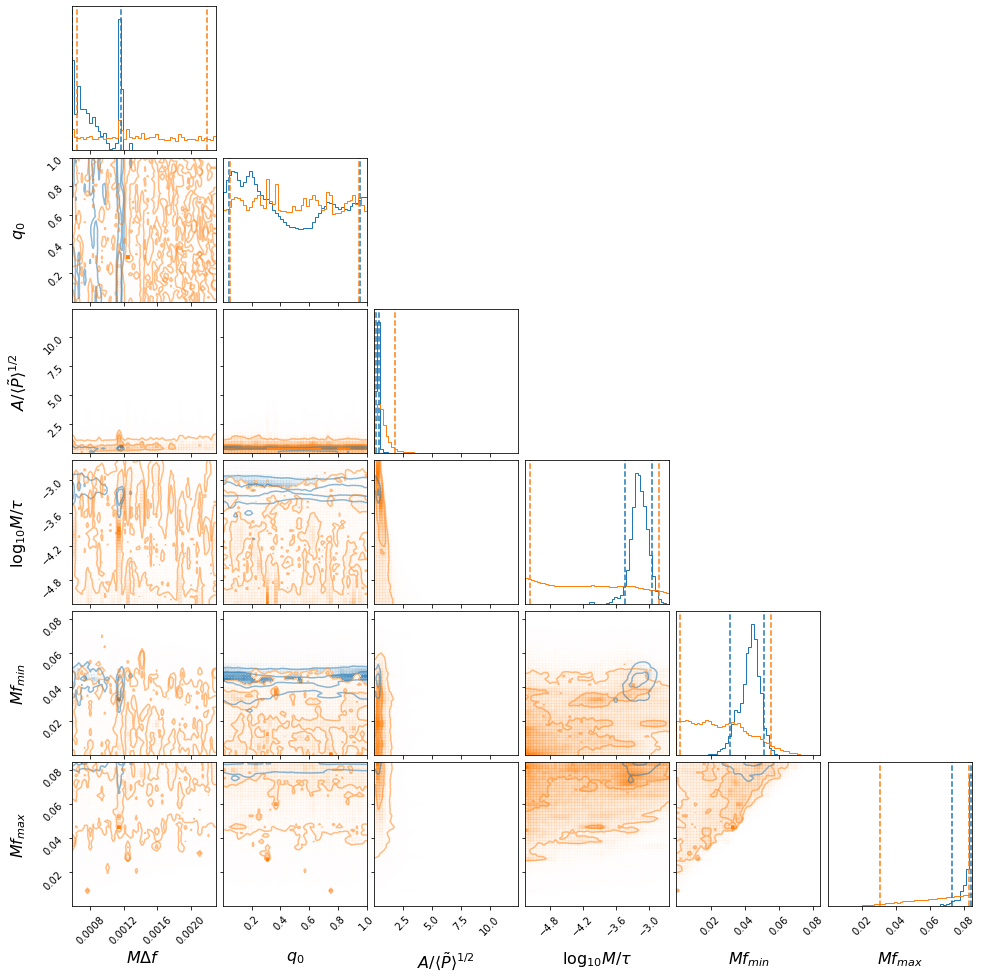

width -3.1858767970440303 0.239520457463962 0.25826376843050136
amplitude 0.28721689670534284 0.1548630627849379 0.07776858120628638
phase 0.44657318929114975 0.5065069963966635 0.4043822612010095
spacing 0.0008082206809987784 0.000361293866591714 0.00023088821940847268
fmin 0.04347842689556483 0.007854711778076881 0.0120120353580817
fmax 0.08311997073975737 0.0012249632057465404 0.01037081109233419
duration 174023.48742815517 0.0 0.0
log_likelihood 43.83202533857316 17.875448937910534 14.30972337615098
log_prior 9.127111142874135 0.5957493433806 0.5515799391829574
SNR 13.56928443856375 2.797228723788388 2.863333659401471
width -4.06076650107464 1.2338211360444324 1.0886954095077321
amplitude 0.5992230661004391 1.1869291122140697 0.5067134001439304
phase 0.49764379711289086 0.45047696638371737 0.4446808944235813
spacing 0.0013667994114328337 0.0008315343645968719 0.0007272872679809405
fmin 0.024575170106904867 0.030614437814027236 0.02222704664044084
fmax 0.06480264104505448 0.01799130

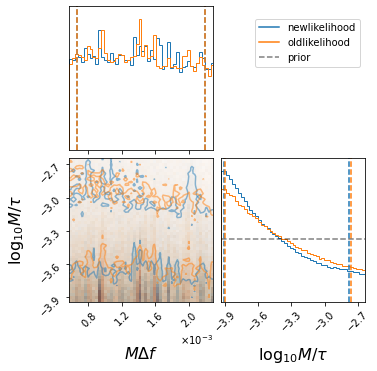

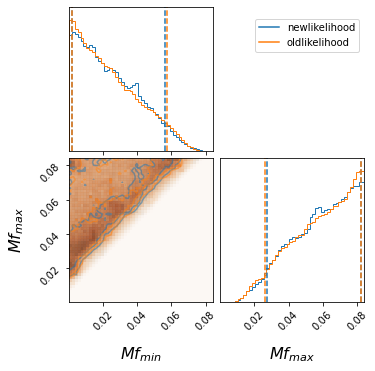

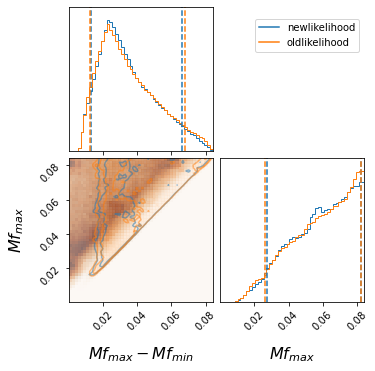

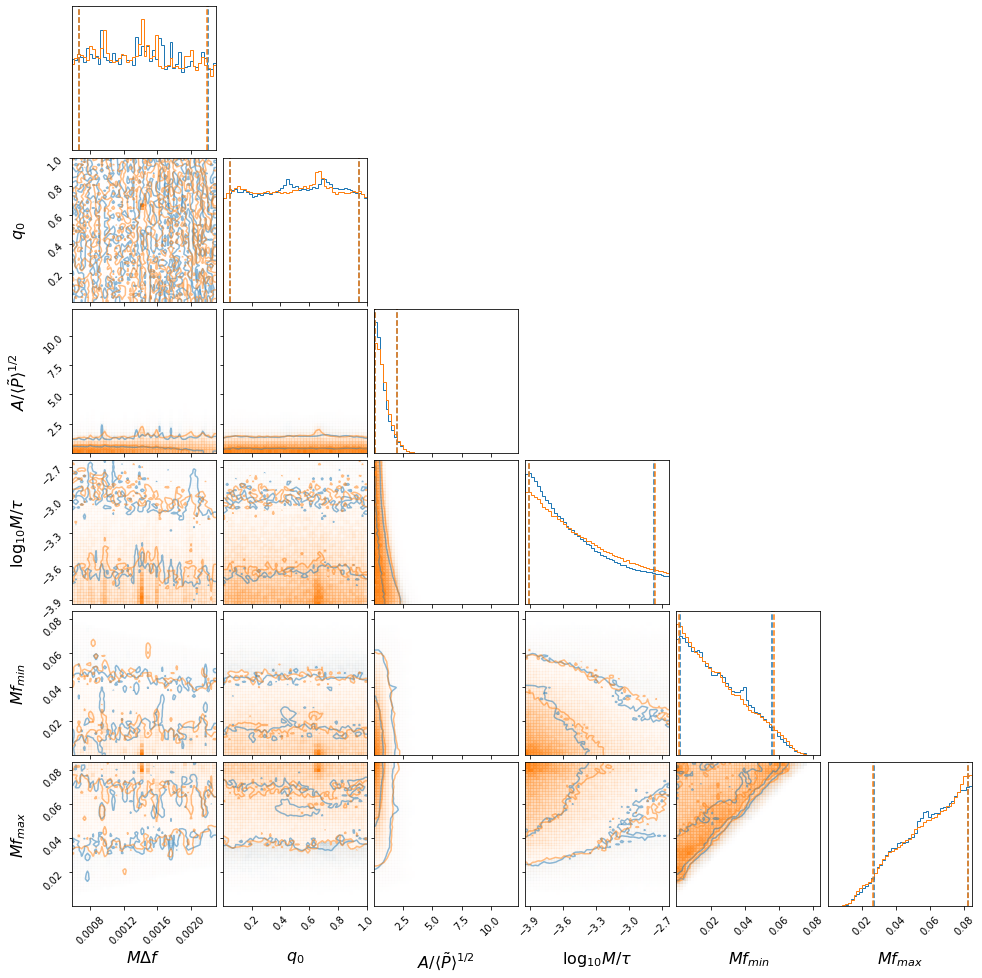

width -3.5500230459685547 0.7712040105435474 0.3581159204027893
amplitude 0.5599008296922798 1.4017220292560448 0.4977955614589563
phase 0.5067098249898095 0.44059246602419333 0.45414595798238844
spacing 0.0014211994318562085 0.0007792520478553879 0.000759051204459193
fmin 0.021476672790193746 0.03454430560396273 0.01956602539429843
fmax 0.06113815955699405 0.02124622947089356 0.03379590887052298
duration 8701.17437140776 0.0 0.0
log_likelihood 0.21037540934698706 8.954751483687406 1.149993564113132
log_prior 12.15662229251491 0.8248510923567238 1.7759311722740598
SNR 3.26022377236822 4.4228400829366645 2.873589772578198
width -3.4997502847088096 0.7357666257978299 0.40351150729462004
amplitude 0.651090950265413 1.3344765660019087 0.5794645981751213
phase 0.5073474611591936 0.44035789043462514 0.45548933618423665
spacing 0.00141398091862855 0.0007837625833987841 0.0007525702617351135
fmin 0.020705052436533457 0.03655544785207926 0.01900231098260273
fmax 0.06161335198727829 0.0209295625

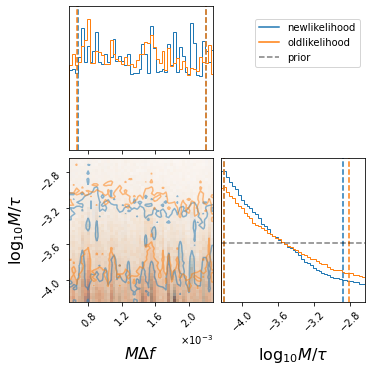

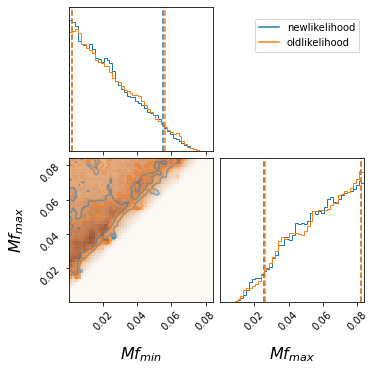

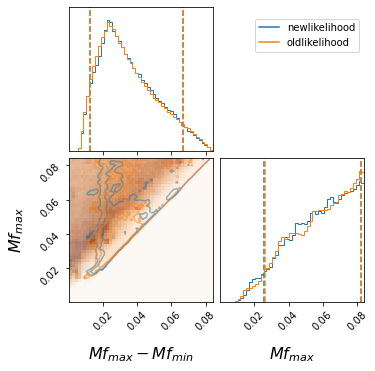

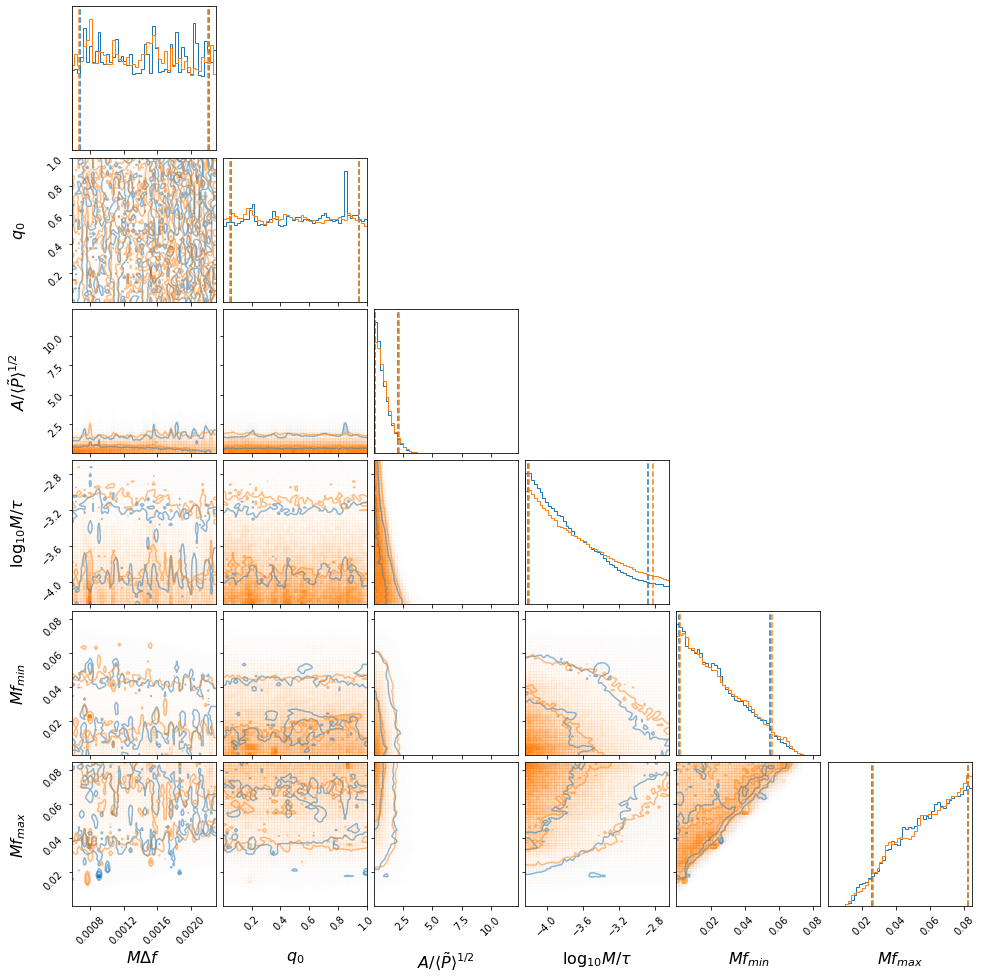

width -3.799372069842442 0.9214512326601918 0.4053577666741921
amplitude 0.6132134832976465 1.4654215676191598 0.5490603665763971
phase 0.5112330249114905 0.4379128733815536 0.4578183012546147
spacing 0.001445503955132855 0.0007668545989903855 0.0007711080471198839
fmin 0.02014618071761881 0.03478945260738835 0.018494619277049963
fmax 0.06044891755725831 0.021831401006996994 0.034602390473177175
duration 17402.34874281552 0.0 0.0
log_likelihood 0.6166769406154664 11.636681151473498 1.4309933842309586
log_prior 12.175038179273924 0.933845949145784 2.1221939938422505
SNR 3.84788249212381 4.583315042262109 3.3936636961472524
width -3.7278149083398495 0.9106857435562246 0.4713610349709758
amplitude 0.6831457846521216 1.4665295029893728 0.6089876543693571
phase 0.49257214531163457 0.4543654985597075 0.4426766884695534
spacing 0.0014236086803465701 0.0007828658312770131 0.0007600609422019084
fmin 0.020670526068017045 0.03554851328626515 0.018853031282149095
fmax 0.060907145537007164 0.021545

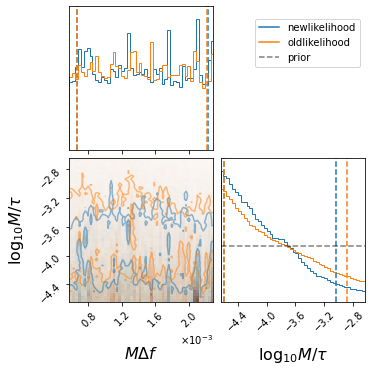

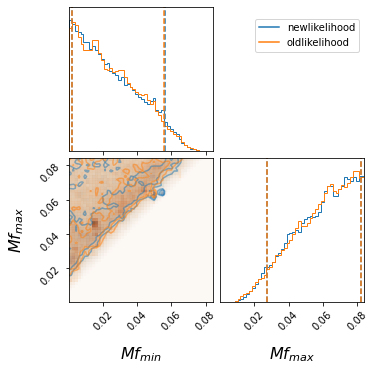

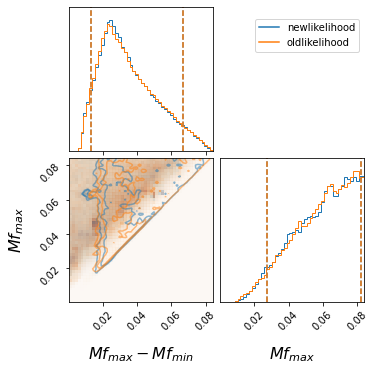

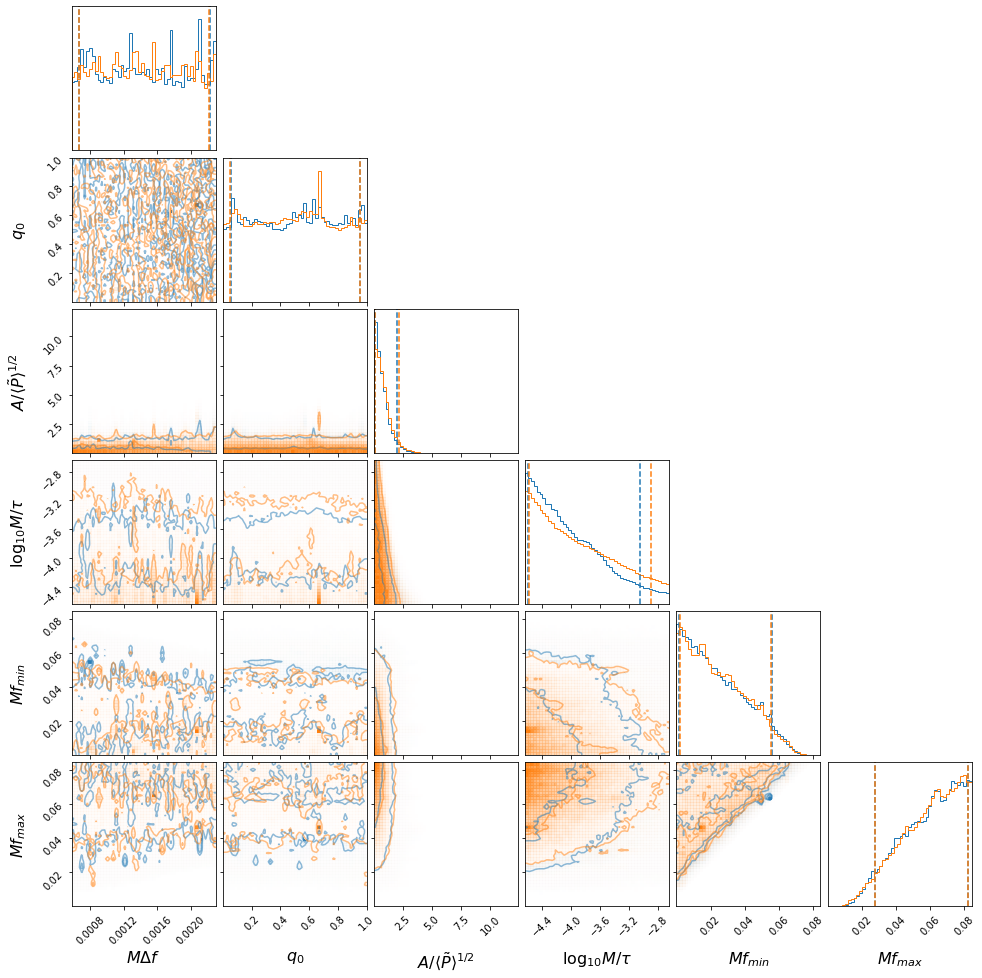

width -4.115556526417661 1.0733626395311324 0.4804598881533577
amplitude 0.5579076483995278 1.3851787182254396 0.5009684962183306
phase 0.5138460514809519 0.4412560512096363 0.45838500530586046
spacing 0.0014245380511291013 0.0008024719303626675 0.0007562804253513991
fmin 0.021305936198538534 0.03480727865056346 0.01953029120105471
fmax 0.061870958962266936 0.020442082262266306 0.03436485329277074
duration 43505.871857038794 0.0 0.0
log_likelihood 0.6194476091907527 12.085038771453263 1.4291691369149429
log_prior 12.224484146522244 1.106759984298991 2.4721307448587737
SNR 3.836395347753887 4.6619354285261725 3.3681012701721955
width -4.002548217771099 1.1161544509843662 0.5864466602236691
amplitude 0.6554825685514089 1.4675841024654774 0.5842804436933857
phase 0.5068649048762233 0.4430576886547848 0.454785130122779
spacing 0.0014248155080327054 0.0007904259339907964 0.0007577483879997397
fmin 0.021691558002986173 0.033816432240377496 0.019802237635701898
fmax 0.06208843505329502 0.0202

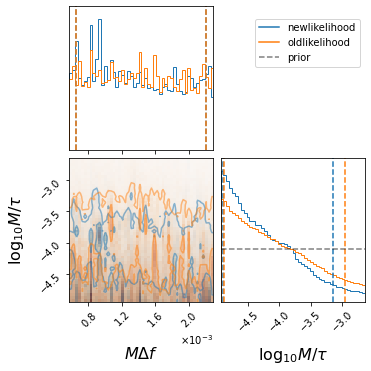

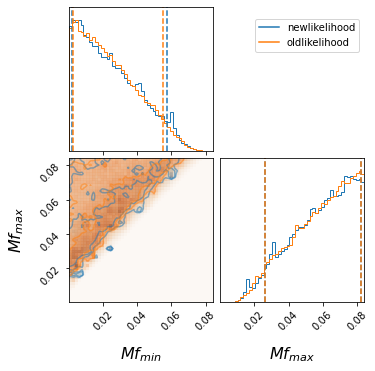

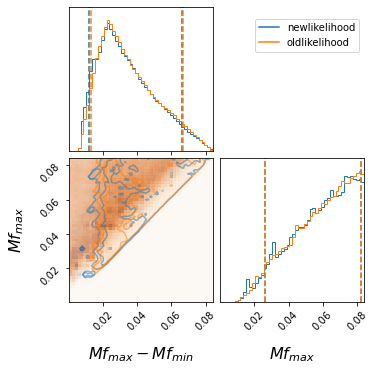

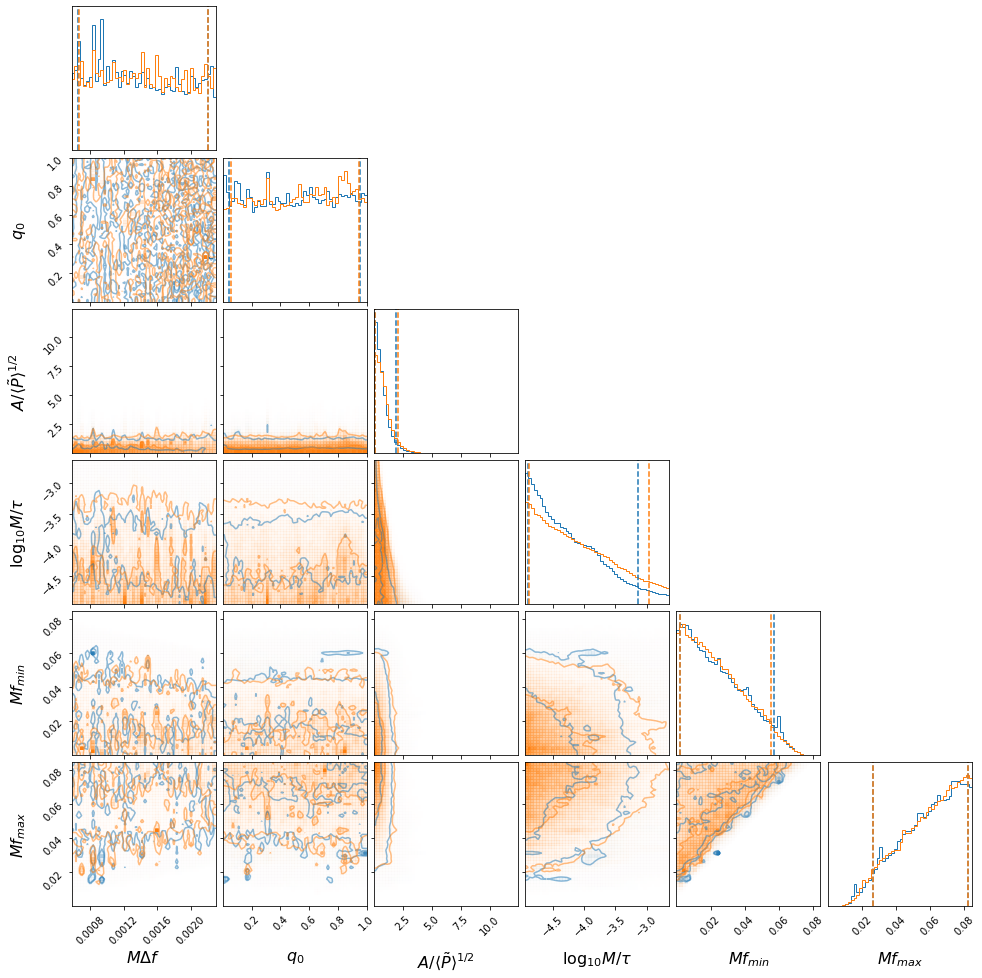

width -4.3411601324590094 1.204277356494202 0.5524719714971429
amplitude 0.5322948478037409 1.3700856685217735 0.47596662848980853
phase 0.5012376385501576 0.4498421170044731 0.45632887715815185
spacing 0.0013504162969781215 0.0008564587702655497 0.0006957783164459653
fmin 0.0216173679769898 0.035529527673508254 0.019662578263584318
fmax 0.06130847212505177 0.020906082605329925 0.03494382951198226
duration 87011.74371407759 0.0 0.0
log_likelihood 0.9317831775193594 11.892144472796257 1.67730921920842
log_prior 12.256829244699937 1.27174032083623 2.7731508344906235
SNR 4.1276462363971325 4.659701956967692 3.6141953044257606
width -4.205127484238801 1.2493342740124902 0.6755439701009216
amplitude 0.6738951831469042 1.45113331837949 0.6002583343964552
phase 0.5224414914567381 0.4265670446749794 0.466879638488632
spacing 0.0014094026109629744 0.0007992746246662848 0.0007522277107468414
fmin 0.021286177272826275 0.034014287232014245 0.01929004429055274
fmax 0.061735635920433934 0.0206254241

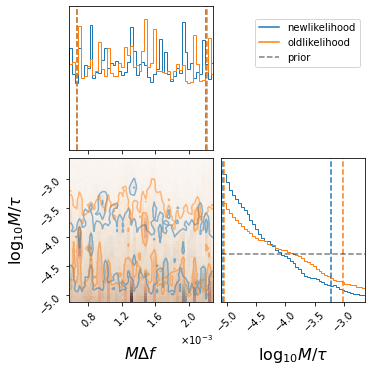

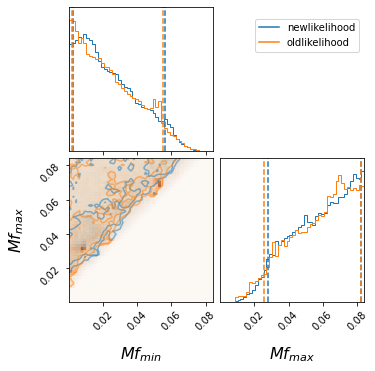

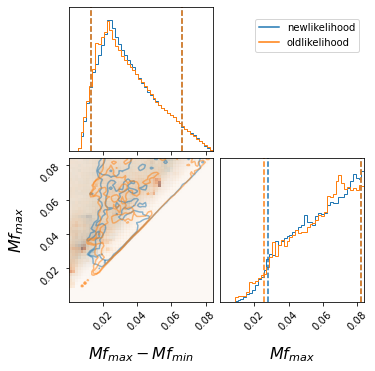

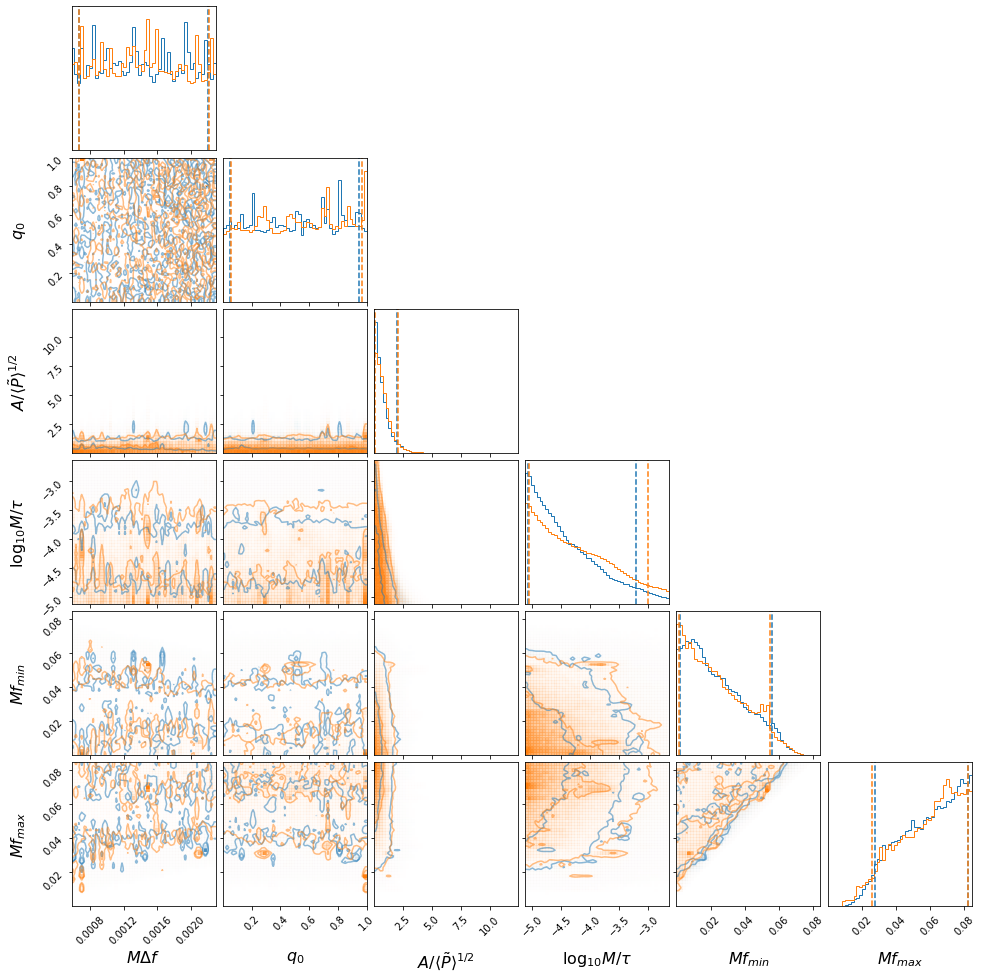

width -4.540857980372681 1.3311058023832532 0.5294339100156664
amplitude 0.5210716509201611 1.5142765394386952 0.4678146199947181
phase 0.5148121207656129 0.43281504977814256 0.46348753807088977
spacing 0.0014246177369621384 0.0007851497933091338 0.0007631244796552989
fmin 0.02058761583897028 0.035540969099355994 0.01855214401772764
fmax 0.060926838680304275 0.021514966615173305 0.03299838707199732
duration 130517.61557111642 0.0 0.0
log_likelihood 0.8912741135138623 13.203377265877577 1.6503947612569425
log_prior 12.439926489948789 1.2194028201581464 3.064386290755518
SNR 4.1023882831891605 4.6929832794516795 3.5927659144113164
width -4.3423713864707105 1.3340079006943384 0.7139942485223978
amplitude 0.6396666570123631 1.4334050783992334 0.5711053821682935
phase 0.5207337943542472 0.44287604899323774 0.4641572794035627
spacing 0.0014281388813986128 0.0007881455379803184 0.0007676345180389363
fmin 0.020685942597374586 0.034090863731034246 0.019021344705155357
fmax 0.06159032840574385 0

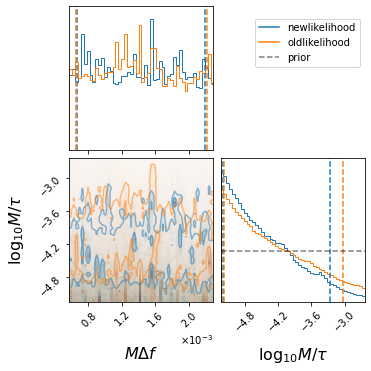

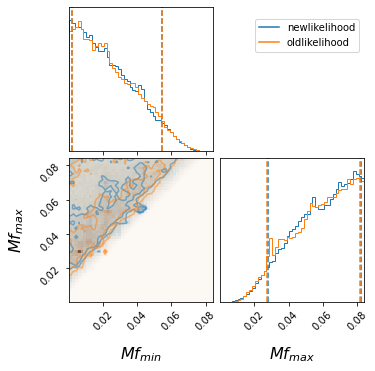

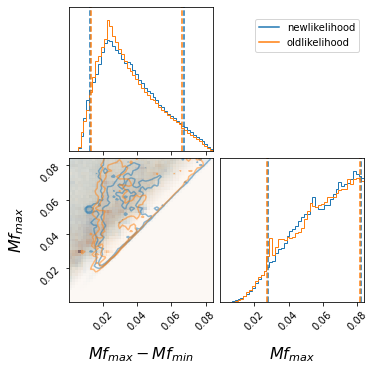

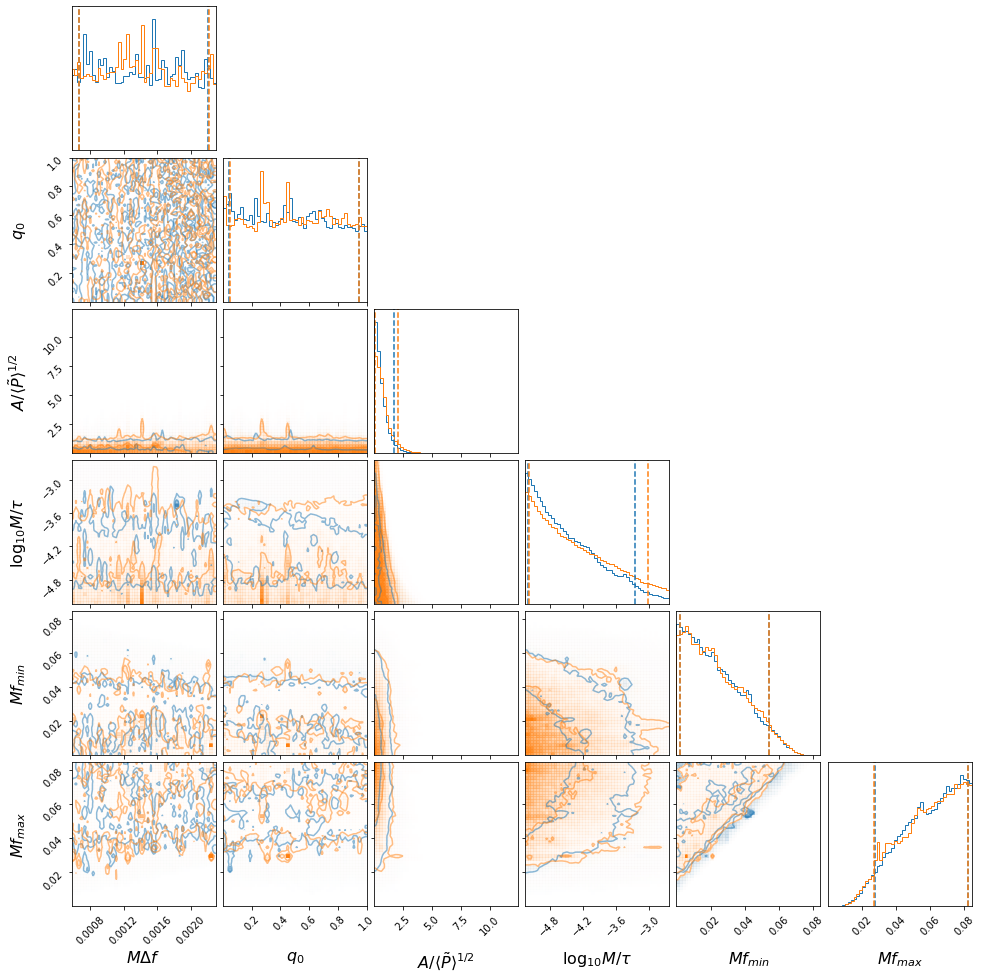

width -4.580480325309493 1.3170540072013672 0.6094170443541094
amplitude 0.4636000814350442 1.2414595462718374 0.41218830465333717
phase 0.4738282296094306 0.4700778283149343 0.43046952065508765
spacing 0.0014305196960348755 0.0007693872764117618 0.0007664987198354951
fmin 0.0206701445375598 0.03379450996705277 0.01884642961936593
fmax 0.06107329593882625 0.021177118279871537 0.03337764294467684
duration 174023.48742815517 0.0 0.0
log_likelihood 0.8596242232020141 11.632180300530171 1.6194730935208494
log_prior 12.338956930191696 1.402990345197674 3.032906079830253
SNR 4.054368934924159 4.654289697389694 3.542871850813677
width -4.461378975450278 1.4368430328832171 0.7196053366471
amplitude 0.6130439407687904 1.4963687022829968 0.5468632120789003
phase 0.4890016424712561 0.4572470758480589 0.4421841137121579
spacing 0.0014071308415913174 0.000808627887749221 0.0007481753244497746
fmin 0.0209695339723076 0.03359871392898496 0.018993248685974087
fmax 0.06059333334623539 0.021604853421770

In [10]:
for file_array_new_2,file_array_old_2,name,amplitude_normalize_factors in zip(file_array_new,file_array_old,names_array,amplitude_normalize_factors_array):
    print(len(file_array_new_2),len(file_array_old_2))
    priors = bilby.result.read_in_result(file_array_new_2[0]).priors
    posterior_array_new = [bilby.result.read_in_result(result_single).posterior for result_single in file_array_new_2]
    posterior_array_old = [bilby.result.read_in_result(result_single).posterior for result_single in file_array_old_2]
    posterior_array_allplus_new = pd.concat(posterior_array_new,ignore_index=True)
    posterior_array_allplus_old = pd.concat(posterior_array_old,ignore_index=True)
    priors = bilby.result.read_in_result(file_array_new_2[0]).priors
    
    
    duration_str = file_array_new_2[0].split("/")[2].split("N")[1].split('_')[0]
    print(name+"N"+duration_str)
    line1 = mlines.Line2D([], [], color='C0', label='newlikelihood')
    line2 = mlines.Line2D([], [], color='C1', label='oldlikelihood')
    #line3 = mlines.Line2D([], [], color='gray', label='injected value')
    line4 = mlines.Line2D([], [], ls = '--',color='black', alpha = 0.5,label='prior')

    datanew = np.transpose([posterior_array_allplus_new.spacing.values,np.log10(posterior_array_allplus_new.width.values)])
    dataold = np.transpose([posterior_array_allplus_old.spacing.values,np.log10(posterior_array_allplus_old.width.values)])
    kwargsnew = dict(labels=[r"$M \Delta f$",r"$\log_{10}{M/\tau}$"], range=[[priors['spacing'].minimum,priors['spacing'].maximum],[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)]],show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C0',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    kwargsold = dict(labels=[r"$M \Delta f$",r"$\log_{10}{M/\tau}$"], range=[[priors['spacing'].minimum,priors['spacing'].maximum],[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)]],
                     show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),
                     hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),
                     color='C1',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    
    def get_normalisation_weight(len_current_samples, len_of_longest_samples):
        return np.ones(len_current_samples) * (len_of_longest_samples / len_current_samples)
    figure = corner.corner(datanew,**kwargsnew)
    corner.corner(dataold,**kwargsold,fig = figure)
    axes = np.array(figure.axes).reshape((2, 2))
    ax = axes[1,1]
    logprior = 1/(np.log10(priors['width'].maximum/priors['width'].minimum))
    ax.plot(np.log10(np.linspace(priors['width'].minimum, priors['width'].maximum, 1000)),np.linspace(logprior,logprior, 1000),color = 'black',ls='--',alpha = 0.5,label = 'prior')
    ax = axes[1,0]
    ax.hist2d(posterior_array_allplus_new.spacing.values,np.log10(posterior_array_allplus_new.width.values),bins=50,density=True,cmap='Blues',range=[[priors['spacing'].minimum,priors['spacing'].maximum],[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)]])
    ax.hist2d(posterior_array_allplus_old.spacing.values,np.log10(posterior_array_allplus_old.width.values),bins=50,density=True,cmap='Oranges',alpha = 0.5,range=[[priors['spacing'].minimum,priors['spacing'].maximum],[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)]])
    ax.ticklabel_format(axis="x", style="sci", scilimits=(0, 0),useMathText=True)
    ax = axes[1,1]
    plt.legend(handles=[line1,line2,line4], bbox_to_anchor=(0., 2.0, 1., .0),loc=0)
    plt.savefig(name+"N"+duration_str+"SpacingWidth_corner.pdf",dpi = 300)
    plt.savefig(name+"N"+duration_str+"SpacingWidth_corner_cut.pdf",dpi = 300,bbox_inches=Bbox([[0.1,0.1],[3.05,3.03]]))
    plt.show()
    plt.close()
    

    datanew = np.transpose([posterior_array_allplus_new.fmin.values,posterior_array_allplus_new.fmax.values])
    dataold = np.transpose([posterior_array_allplus_old.fmin.values,posterior_array_allplus_old.fmax.values])
    kwargsnew = dict(labels=[r"$M f_{min}$",r"$M f_{max}$"], range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]],show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C0',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    kwargsold = dict(labels=[r"$M f_{min}$",r"$M f_{max}$"], range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]],show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C1',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    def get_normalisation_weight(len_current_samples, len_of_longest_samples):
        return np.ones(len_current_samples) * (len_of_longest_samples / len_current_samples)
    figure = corner.corner(datanew,**kwargsnew)
    corner.corner(dataold,**kwargsold,fig = figure)

    axes = np.array(figure.axes).reshape((2, 2))
    ax = axes[1,0]
    ax.hist2d(posterior_array_allplus_new.fmin.values,posterior_array_allplus_new.fmax.values,bins=50,density=True,cmap='Blues',range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]],alpha =0.5)
    ax.hist2d(posterior_array_allplus_old.fmin.values,posterior_array_allplus_old.fmax.values,bins=50,density=True,cmap='Oranges',alpha = 0.5,range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]])
    ax = axes[1,1]
    plt.legend(handles=[line1,line2], bbox_to_anchor=(0., 2.0, 1., .0),loc=0)
    plt.savefig(name+"N"+duration_str+"FRange_corner.pdf",dpi = 300)
    plt.savefig(name+"N"+duration_str+"FRange_corner_cut.pdf",dpi = 300,bbox_inches=Bbox([[0.1,0.1],[3.05,3.03]]))
    plt.show()
    plt.close()
    
    datanew = np.transpose([posterior_array_allplus_new.fmax.values-posterior_array_allplus_new.fmin.values,posterior_array_allplus_new.fmax.values])
    dataold = np.transpose([posterior_array_allplus_old.fmax.values-posterior_array_allplus_old.fmin.values,posterior_array_allplus_old.fmax.values])
    kwargsnew = dict(labels=[r"$M f_{max}-M f_{min}$",r"$M f_{max}$"], range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]],show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C0',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    kwargsold = dict(labels=[r"$M f_{max}-M f_{min}$",r"$M f_{max}$"], range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]],show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C1',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    def get_normalisation_weight(len_current_samples, len_of_longest_samples):
        return np.ones(len_current_samples) * (len_of_longest_samples / len_current_samples)
    figure = corner.corner(datanew,**kwargsnew)
    corner.corner(dataold,**kwargsold,fig = figure)

    axes = np.array(figure.axes).reshape((2, 2))
    ax = axes[1,0]
    ax.hist2d(posterior_array_allplus_new.fmin.values,posterior_array_allplus_new.fmax.values,bins=50,density=True,cmap='Blues',range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]],alpha =0.5)
    ax.hist2d(posterior_array_allplus_old.fmin.values,posterior_array_allplus_old.fmax.values,bins=50,density=True,cmap='Oranges',alpha = 0.5,range=[[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]])
    ax = axes[1,1]
    plt.legend(handles=[line1,line2], bbox_to_anchor=(0., 2.0, 1., .0),loc=0)
    plt.savefig(name+"N"+duration_str+"FRange_corner_new.pdf",dpi = 300)
    plt.savefig(name+"N"+duration_str+"FRange_corner_new_cut.pdf",dpi = 300,bbox_inches=Bbox([[0.1,0.1],[3.05,3.03]]))
    plt.show()
    plt.close()
    
    kwargsnew = dict(show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C0',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)
    kwargsold = dict(show_titles=False, levels=(1 - np.exp(-0.5), 1 - np.exp(-2)),hist_kwargs=dict(density=True),hist2d_kwargs=dict(plot_density=True),contour_kwargs=dict(alpha =0.5),label_kwargs=dict(fontsize=16),color='C1',quantiles=[0.05, 0.95],plot_datapoints=False, fill_contours=False,plot_contours=True,bins = 50)

    kwargsnew['labels'] = [r"$M \Delta f$",r"$q_0$",r"$A/\langle \tilde{P}\rangle ^{1/2}$",r"$\log_{10}{M/\tau}$",r"$M f_{min}$",r"$M f_{max}$"]
    kwargsold['labels'] = [r"$M \Delta f$",r"$q_0$",r"$A/\langle \tilde{P}\rangle ^{1/2}$",r"$\log_{10}{M/\tau}$",r"$M f_{min}$",r"$M f_{max}$"]

    kwargsnew['range'] = [[priors['spacing'].minimum,priors['spacing'].maximum],[priors['phase'].minimum,priors['phase'].maximum],[priors['amplitude'].minimum/amplitude_normalize_factors,priors['amplitude'].maximum/amplitude_normalize_factors],[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)],[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]]
    kwargsold['range'] = [[priors['spacing'].minimum,priors['spacing'].maximum],[priors['phase'].minimum,priors['phase'].maximum],[priors['amplitude'].minimum/amplitude_normalize_factors,priors['amplitude'].maximum/amplitude_normalize_factors],[np.log10(priors['width'].minimum),np.log10(priors['width'].maximum)],[priors['fmin'].minimum,priors['fmin'].maximum],[priors['fmax'].minimum,priors['fmax'].maximum]]

    datanew = np.transpose([posterior_array_allplus_new.spacing.values,posterior_array_allplus_new.phase.values,posterior_array_allplus_new.amplitude.values/amplitude_normalize_factors,np.log10(posterior_array_allplus_new.width.values),posterior_array_allplus_new.fmin.values,posterior_array_allplus_new.fmax.values])
    dataold = np.transpose([posterior_array_allplus_old.spacing.values,posterior_array_allplus_old.phase.values,posterior_array_allplus_old.amplitude.values/amplitude_normalize_factors,np.log10(posterior_array_allplus_old.width.values),posterior_array_allplus_old.fmin.values,posterior_array_allplus_old.fmax.values])
    
    figure = corner.corner(datanew,**kwargsnew)
    corner.corner(dataold,**kwargsold,fig = figure)
    plt.savefig(name+"N"+duration_str+"Full_corner.pdf",dpi = 300)
    plt.show()
    plt.close()
    
    rows = []
    rows.append(name+"N"+duration_str+'new')
    for keys in keys_all:
        median = np.median(posterior_array_allplus_new[keys])
        lowerlimit = np.percentile(posterior_array_allplus_new[keys], 5)
        upperlimit = np.percentile(posterior_array_allplus_new[keys], 95)
        if keys == 'width':
            median = np.median(np.log10(posterior_array_allplus_new[keys]))
            lowerlimit = np.percentile(np.log10(posterior_array_allplus_new[keys]), 5)
            upperlimit = np.percentile(np.log10(posterior_array_allplus_new[keys]), 95)
        if keys == 'amplitude':
            median = np.median(posterior_array_allplus_new[keys])/amplitude_normalize_factors
            lowerlimit = np.percentile(posterior_array_allplus_new[keys], 5)/amplitude_normalize_factors
            upperlimit = np.percentile(posterior_array_allplus_new[keys], 95)/amplitude_normalize_factors
            # headers.append('log10'+keys+'_median')
            # headers.append('log10'+keys+'_plus')
            # headers.append('log10'+keys+'_minus')
        # else:
        #     headers.append(keys+'_median')
        #     headers.append(keys+'_plus')
        #     headers.append(keys+'_minus')
        rows.append(median)
        rows.append(upperlimit-median)
        rows.append(median-lowerlimit)
        print(keys, median, upperlimit-median,median-lowerlimit)
        
    rows = []
    rows.append(name+"N"+duration_str+'old')
    for keys in keys_all:
        median = np.median(posterior_array_allplus_old[keys])
        lowerlimit = np.percentile(posterior_array_allplus_old[keys], 5)
        upperlimit = np.percentile(posterior_array_allplus_old[keys], 95)
        if keys == 'width':
            median = np.median(np.log10(posterior_array_allplus_old[keys]))
            lowerlimit = np.percentile(np.log10(posterior_array_allplus_old[keys]), 5)
            upperlimit = np.percentile(np.log10(posterior_array_allplus_old[keys]), 95)
        if keys == 'amplitude':
            median = np.median(posterior_array_allplus_old[keys])/amplitude_normalize_factors
            lowerlimit = np.percentile(posterior_array_allplus_old[keys], 5)/amplitude_normalize_factors
            upperlimit = np.percentile(posterior_array_allplus_old[keys], 95)/amplitude_normalize_factors           
            # headers.append('log10'+keys+'_median')
            # headers.append('log10'+keys+'_plus')
            # headers.append('log10'+keys+'_minus')
        # else:
        #     headers.append(keys+'_median')
        #     headers.append(keys+'_plus')
        #     headers.append(keys+'_minus')
        rows.append(median)
        rows.append(upperlimit-median)
        rows.append(median-lowerlimit)
        print(keys, median, upperlimit-median,median-lowerlimit)
    # with open('figs/'+'PE.csv', 'w') as f:
    #     f_csv = csv.writer(f)
    #     f_csv.writerow(headers)
    with open('PE.csv', 'a+') as f:
        f_csv = csv.writer(f)
        f_csv.writerow(rows)

# violin plot for posterior 
Fig 13

## snr theory trend

In [61]:
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d
import bilby
from glob import glob
from bilby.core.prior import PriorDict
import csv
import os


import sys
sys.path.append("..")
from burstevidence_newcomb import burstevidence as burstevidence_old
from burstevidence_newcomb import burstevidence_qnm as burstevidence
from comb_models_version3 import qnmcombmodel_cut as combmodel

chi = 2/3
#f_RD = (1-0.759*(1-chi)**0.129)*1.5251
f_RD = (1.5251-1.1568*(1-chi)**0.129)/(2*np.pi)
R_bar = 0.00547/(1+1/np.sqrt(1-chi**2))/(2*np.pi)
#0.006 should be 0.00572031?


fmin = 0
fmax = f_RD
# tem part
start = 0
end = 1
file_index = 9
# tem part end 

length0 = int(500*4096)
file_list = glob('echo_waves/*.dat')
file_list.sort()
# amplitude_array = np.concatenate((np.linspace(135,135,6),np.linspace(57,57,6),np.linspace(28,28,6),np.linspace(34,34,6),np.linspace(0,0,6)))
amplitude_array = np.concatenate((np.linspace(160,160,6),np.linspace(57,57,6),np.linspace(29,29,6),np.linspace(34,34,6),np.linspace(0,0,6)))

j=0
snr_array = []
for index in np.arange(0,24):
	file = file_list[index]
	amplitude_inject = amplitude_array[index]
	inject_data = np.genfromtxt(file,delimiter="\t",dtype=np.complex128)

	omega = np.real(inject_data[0::,0])
	frequency = omega/(2*np.pi)
	df = np.diff(frequency)[0]
	duration = 1/df
	dt = duration/len(omega)
	frequency = frequency[0:len(frequency)//2]


	inject_strain_fre = inject_data[0::,1]
	inject_strain_fre = (inject_strain_fre + np.conjugate(inject_strain_fre[::-1]))/2
	inject_strain_fre = inject_data[0::,1]
	inject_strain_plus = inject_strain_fre
	inject_strain_minus = np.conjugate(inject_strain_fre[::-1])


	inject_strain_fre = (inject_strain_plus+inject_strain_minus)/2
	inject_strain_fre = inject_strain_fre[0:len(frequency)]

	length = len(inject_strain_fre)*2

	i=0

	noise0 = np.load('noise100_500second.npy')
	noisep = noise0[i*length0:(i+1)*length0]
	noise = noisep[0:length]

	NFFT = 2048
	fs = 1/dt
	psd_window = np.blackman(NFFT)
	NOVL = int(NFFT/2)

	Pxx_strain, freqs = mlab.psd(noisep, Fs = fs, NFFT = NFFT,window = psd_window,noverlap = NOVL)
	psd_strain = interp1d(freqs, Pxx_strain)
	noisefre = dt * np.fft.fft(noise)[0:len(frequency)]

	strainfre = inject_strain_fre * amplitude_inject + noisefre
	frequencye = frequency[int(fmin/df):int(fmax/df+2)]

	hi = inject_strain_fre[int(fmin/df):int(fmax/df+2)] * amplitude_inject
	hi_plus = inject_strain_plus[int(fmin/df):int(fmax/df+2)] * amplitude_inject
	hi_minus = inject_strain_minus[int(fmin/df):int(fmax/df+2)] * amplitude_inject

	rho_opt_signal = np.sqrt(4*df * np.sum(np.abs(hi)**2/psd_strain(frequencye)))
	rho_opt_signal_plus = np.sqrt(4*df * np.sum(np.abs(hi_plus)**2/psd_strain(frequencye)))/2
	rho_opt_signal_minus = np.sqrt(4*df * np.sum(np.abs(hi_minus)**2/psd_strain(frequencye)))/2
	snr_array.append(np.max([rho_opt_signal_plus,rho_opt_signal_minus]))
	print(file.split('/')[-1],snr_array[-1])


w1XinN010.dat 15.752026932409908
w1XinN020.dat 16.233975050449473
w1XinN050.dat 16.666352545194187
w1XinN100.dat 16.815385134611443
w1XinN150.dat 16.84506012546179
w1XinN200.dat 16.852985732465317
w1specM50RbolT10Chi0.69N010.dat 11.630875334283212
w1specM50RbolT10Chi0.69N020.dat 13.42699894878039
w1specM50RbolT10Chi0.69N050.dat 15.456675244538873
w1specM50RbolT10Chi0.69N100.dat 16.790000210570167
w1specM50RbolT10Chi0.69N150.dat 17.37121346766126
w1specM50RbolT10Chi0.69N200.dat 18.224575886191776
w1specM50RdV0.2Chi0.69N010.dat 8.07850636879686
w1specM50RdV0.2Chi0.69N020.dat 10.283579625603396
w1specM50RdV0.2Chi0.69N050.dat 13.675246377862177
w1specM50RdV0.2Chi0.69N100.dat 16.632393768274262
w1specM50RdV0.2Chi0.69N150.dat 18.60327573504298
w1specM50RdV0.2Chi0.69N200.dat 20.157725297261972
w1specM50Rw0.99Chi0.69N010.dat 9.242481688380405
w1specM50Rw0.99Chi0.69N020.dat 11.579466480693123
w1specM50Rw0.99Chi0.69N050.dat 14.682985739809418
w1specM50Rw0.99Chi0.69N100.dat 16.444642044051403
w1s

In [62]:
# reshape snr_array to a (4,6) array
snr_array = np.array(snr_array).reshape(4,6)
snr_array = snr_array[::-1]

## violin plot

In [64]:
import pandas as pd
import scipy
import os
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import bilby
import corner
import csv
from glob import glob

import matplotlib.lines as mlines
from matplotlib.transforms import Bbox

In [65]:
duration_array_str = glob("echo_waves/*.dat")
duration_array_str.sort()
for i in range(len(duration_array_str)):
    duration_array_str[i] = duration_array_str[i].split("/")[1].split("N")[1].split('.')[0]
duration_array_str = list(dict.fromkeys(duration_array_str))
duration_array_str

['010', '020', '050', '100', '150', '200']

In [66]:
duration_array = glob("echo_waves/*.dat")
duration_array.sort()
for i in range(len(duration_array)):
    duration_array[i] = int(duration_array[i].split("/")[1].split("N")[1].split('.')[0])
duration_array = list(dict.fromkeys(duration_array))
duration_array.sort()
duration_array = np.array(duration_array)*2
duration_array

array([ 20,  40, 100, 200, 300, 400])

In [67]:
name_array = glob("echo_waves/*.dat")
name_array.sort()
for i in range(len(name_array)):
    name_array[i] = name_array[i].split("/")[1].split("N")[0]
#delete duplicates in name array
name_array = list(dict.fromkeys(name_array))
name_array.sort()
name_array = name_array[::-1]
name_array.append('noise')
name_array

['w1specM50Rw0.99Chi0.69',
 'w1specM50RdV0.2Chi0.69',
 'w1specM50RbolT10Chi0.69',
 'w1Xin',
 'noise']

In [68]:
file_array_new = [sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration))) for name in name_array for string_likelihood in ['newlikelihood'] for duration in duration_array_str]
file_array_old = [sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration))) for name in name_array for string_likelihood in ['oldlikelihood'] for duration in duration_array_str]

In [69]:
name_label_array = ['B1','B2','B3','B4','noise']
logbmax_array = [30,30,30,35]

In [70]:
file_array_new_test = [[sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration))) for string_likelihood in ['newlikelihood'] for duration in duration_array_str] for name in name_array ]
file_array_old_test = [[sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration))) for string_likelihood in ['oldlikelihood'] for duration in duration_array_str] for name in name_array ]
np.shape(file_array_new_test),np.shape(file_array_old_test)
#file_array_new_test[i][j][k] means the i-th signal, j-th duration, k-th noise realization

((5, 6, 100), (5, 6, 100))

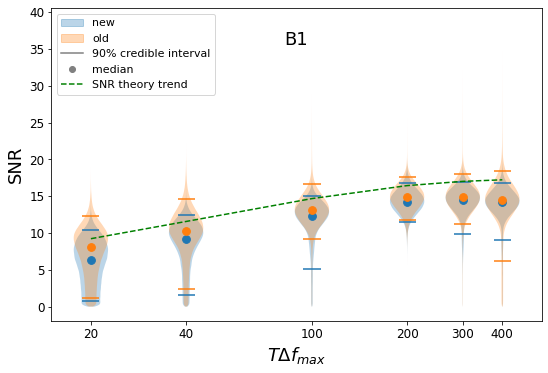

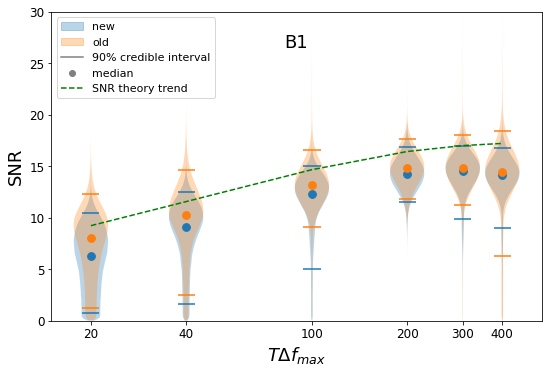

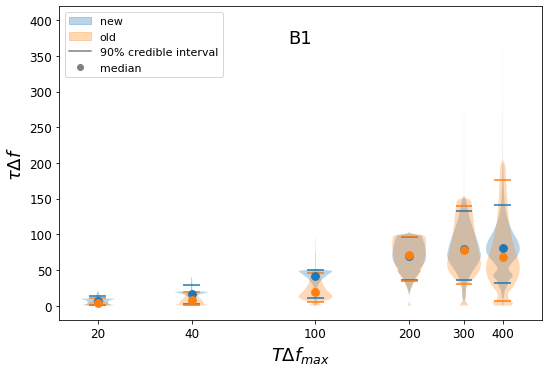

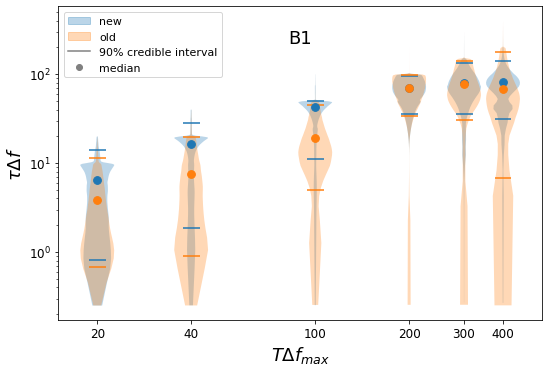

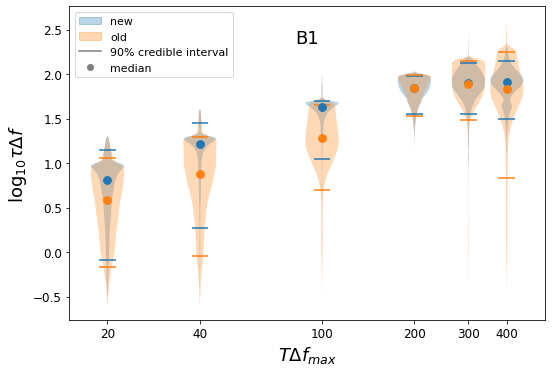

...

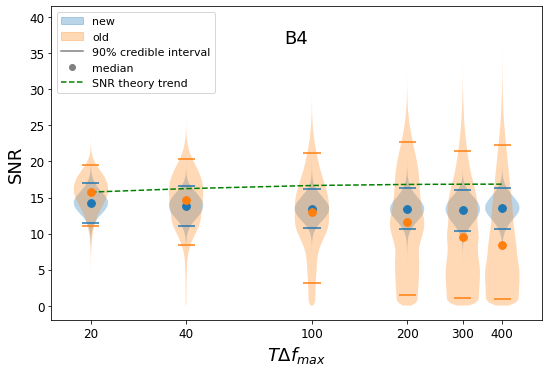

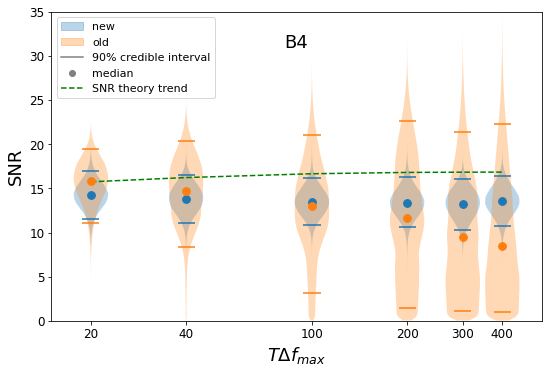

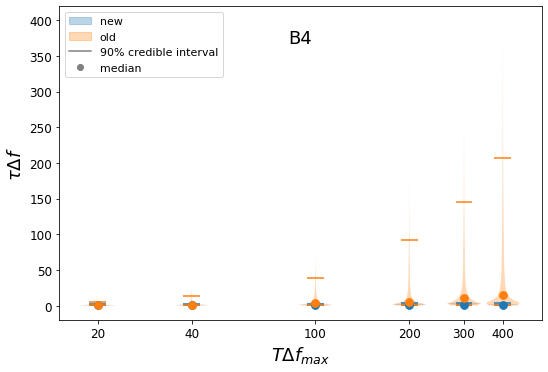

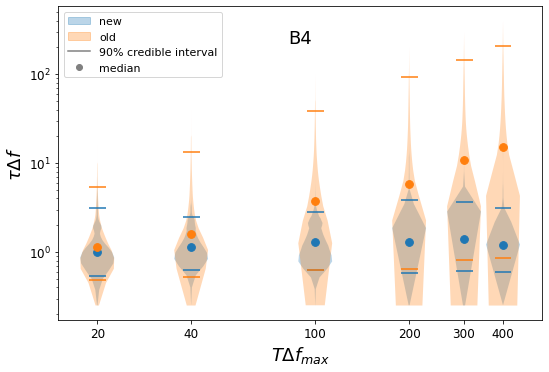

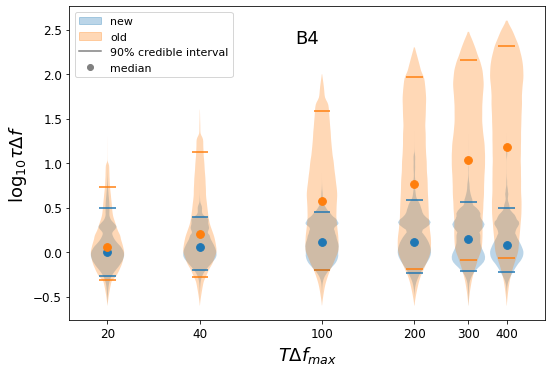

In [72]:
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
for file_array_new_2,file_array_old_2,snr_array_part,name_string,logbmax in zip(file_array_new_test,file_array_old_test,snr_array,name_label_array,logbmax_array):
    quantiles8 = [[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95]]
    quantiles7 = [[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95],[0.05,0.95]]
    new_likelihood_SNR = []
    old_likelihood_SNR = []
    new_likelihood_qfactor = []
    old_likelihood_qfactor = []
    for file_array_new_3,file_array_old_3 in zip(file_array_new_2,file_array_old_2):
        posterior_array_new = [bilby.result.read_in_result(result_single).posterior for result_single in file_array_new_3]
        posterior_array_old = [bilby.result.read_in_result(result_single).posterior for result_single in file_array_old_3]
        posterior_array_allplus_new = pd.concat(posterior_array_new,ignore_index=True)
        posterior_array_allplus_old = pd.concat(posterior_array_old,ignore_index=True)
        new_likelihood_SNR.append(posterior_array_allplus_new['SNR'])
        old_likelihood_SNR.append(posterior_array_allplus_old['SNR'])
        new_likelihood_qfactor.append(posterior_array_allplus_new['spacing']/posterior_array_allplus_new['width'])
        old_likelihood_qfactor.append(posterior_array_allplus_old['spacing']/posterior_array_allplus_old['width'])
        
    fig, ax = plt.subplots(figsize = (7.5,5),constrained_layout=True)
    labels = []
    parts1 = ax.violinplot(new_likelihood_SNR,positions=np.log(duration_array),showmedians=False,quantiles=quantiles8,widths = 0.25,showextrema=False)
    parts2 = ax.violinplot(old_likelihood_SNR,positions=np.log(duration_array),showmedians=False,quantiles=quantiles7,widths = 0.25,showextrema=False)
    #parts1['cmedians'].set_linestyle('solid')
    parts1['cquantiles'].set_linestyle('solid')
    #parts2['cmedians'].set_linestyle('solid')
    parts2['cquantiles'].set_linestyle('solid')
    ax.set_xticks(np.log(duration_array))
    ax.set_xticklabels([str(x) for x in duration_array],fontsize = 12)
    
    patch1 = mpatches.Patch(color=parts1["bodies"][0].get_facecolor().flatten(), label='new')
    patch2 = mpatches.Patch(color=parts2["bodies"][0].get_facecolor().flatten(), label='old')
    #patch3 = mpatches.Patch(alpha=0.2, color='gray', label='noise level')
    #patch2 = mpatches.Patch(color='C1', label='oldlikelihood')
    line1 = mlines.Line2D([], [], color='grey', label='90% credible interval')
    points1 = mlines.Line2D([], [], color='grey', marker='o',linestyle='None', label='median')
    
    line3 = mlines.Line2D([], [], color='green',ls='--', label='SNR theory trend')
    #ax.axhline(-2.5,color = 'r',ls = '--',label = 'noise level')
    positions = np.log(duration_array)
    medians1 = [np.median(x) for x in new_likelihood_SNR]
    #medians1= np.percentile(new_likelihood_logB, 50, axis=1)
    ax.scatter(positions, medians1, marker='o', color=parts1["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    #medians2 = np.percentile(old_likelihood_logB, 50, axis=1)
    medians2 = [np.median(x) for x in old_likelihood_SNR]
    ax.scatter(positions, medians2, marker='o', color=parts2["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    ax.plot(positions,snr_array_part,color = 'green',ls = '--',label = 'SNR theory trend')
    ax.set_xlabel(r'$T\Delta f_{max}$',fontsize = 18)
    ax.set_ylabel('SNR',fontsize = 18)
    ax.text(0.5, 0.9, name_string, horizontalalignment='center',verticalalignment='center', transform=ax.transAxes,fontsize = 18)
    # ax.set_yscale('log')
    plt.yticks(fontsize = 12)
    plt.legend(handles=[patch1, patch2, line1, points1,line3], loc=2,fontsize = 11)
    plt.savefig('SNR_violinplot_%s.pdf'%file_array_new_3[0].split("/")[0],dpi=300)
    plt.show()
    plt.close()
    
    
    fig, ax = plt.subplots(figsize = (7.5,5),constrained_layout=True)
    labels = []
    parts1 = ax.violinplot(new_likelihood_SNR,positions=np.log(duration_array),showmedians=False,quantiles=quantiles8,widths = 0.25,showextrema=False)
    parts2 = ax.violinplot(old_likelihood_SNR,positions=np.log(duration_array),showmedians=False,quantiles=quantiles7,widths = 0.25,showextrema=False)
    #parts1['cmedians'].set_linestyle('solid')
    parts1['cquantiles'].set_linestyle('solid')
    #parts2['cmedians'].set_linestyle('solid')
    parts2['cquantiles'].set_linestyle('solid')
    ax.set_xticks(np.log(duration_array))
    ax.set_xticklabels([str(x) for x in duration_array],fontsize = 12)
    
    patch1 = mpatches.Patch(color=parts1["bodies"][0].get_facecolor().flatten(), label='new')
    patch2 = mpatches.Patch(color=parts2["bodies"][0].get_facecolor().flatten(), label='old')
    #patch3 = mpatches.Patch(alpha=0.2, color='gray', label='noise level')
    #patch2 = mpatches.Patch(color='C1', label='oldlikelihood')
    line1 = mlines.Line2D([], [], color='grey', label='90% credible interval')
    points1 = mlines.Line2D([], [], color='grey', marker='o',linestyle='None', label='median')
    
    line3 = mlines.Line2D([], [], color='green',ls='--', label='SNR theory trend')
    #ax.axhline(-2.5,color = 'r',ls = '--',label = 'noise level')
    positions = np.log(duration_array)
    medians1 = [np.median(x) for x in new_likelihood_SNR]
    #medians1= np.percentile(new_likelihood_logB, 50, axis=1)
    ax.scatter(positions, medians1, marker='o', color=parts1["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    #medians2 = np.percentile(old_likelihood_logB, 50, axis=1)
    medians2 = [np.median(x) for x in old_likelihood_SNR]
    ax.scatter(positions, medians2, marker='o', color=parts2["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    ax.plot(positions,snr_array_part,color = 'green',ls = '--',label = 'SNR theory trend')
    ax.set_xlabel(r'$T\Delta f_{max}$',fontsize = 18)
    ax.set_ylabel('SNR',fontsize = 18)
    ax.text(0.5, 0.9, name_string, horizontalalignment='center',verticalalignment='center', transform=ax.transAxes,fontsize = 18)
    ax.set_ylim(0,logbmax)
    # ax.set_yscale('log')
    plt.yticks(fontsize = 12)
    plt.legend(handles=[patch1, patch2, line1, points1,line3], loc=2,fontsize = 11)
    plt.savefig('SNR_violinplot_%s_fix_ylim.pdf'%file_array_new_3[0].split("/")[0],dpi=300)
    plt.show()
    plt.close()
    
    fig, ax = plt.subplots(figsize = (7.5,5),constrained_layout=True)
    labels = []

    parts1 = ax.violinplot(new_likelihood_qfactor,positions=np.log(duration_array),showmedians=False,quantiles=quantiles8,widths = 0.25,showextrema=False)
    parts2 = ax.violinplot(old_likelihood_qfactor,positions=np.log(duration_array),showmedians=False,quantiles=quantiles7,widths = 0.25,showextrema=False)
    #parts1['cmedians'].set_linestyle('solid')
    parts1['cquantiles'].set_linestyle('solid')
    #parts2['cmedians'].set_linestyle('solid')
    parts2['cquantiles'].set_linestyle('solid')
    ax.set_xticks(np.log(duration_array))
    ax.set_xticklabels([str(x) for x in duration_array],fontsize = 12)
    
    patch1 = mpatches.Patch(color=parts1["bodies"][0].get_facecolor().flatten(), label='new')
    patch2 = mpatches.Patch(color=parts2["bodies"][0].get_facecolor().flatten(), label='old')
    #patch3 = mpatches.Patch(alpha=0.2, color='gray', label='noise level')
    #patch2 = mpatches.Patch(color='C1', label='oldlikelihood')
    line1 = mlines.Line2D([], [], color='grey', label='90% credible interval')
    points1 = mlines.Line2D([], [], color='grey', marker='o',linestyle='None', label='median')
    
    line3 = mlines.Line2D([], [], color='grey',ls='--', label='snr theory trend')
    #ax.axhline(-2.5,color = 'r',ls = '--',label = 'noise level')
    positions = np.log(duration_array)
    medians1 = [np.median(x) for x in new_likelihood_qfactor]
    #medians1= np.percentile(new_likelihood_logB, 50, axis=1)
    ax.scatter(positions, medians1, marker='o', color=parts1["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    #medians2 = np.percentile(old_likelihood_logB, 50, axis=1)
    medians2 = [np.median(x) for x in old_likelihood_qfactor]
    ax.scatter(positions, medians2, marker='o', color=parts2["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    ax.text(0.5, 0.9, name_string, horizontalalignment='center',verticalalignment='center', transform=ax.transAxes,fontsize = 18)
    #ax.plot(positions,snr_array_part,color = 'grey',ls = '--',label = 'snr theory trend')
    ax.set_xlabel(r'$T\Delta f_{max}$',fontsize = 18)
    ax.set_ylabel(r'$\tau \Delta f$',fontsize = 18)
    # ax.set_yscale('log')
    plt.yticks(fontsize = 12)
    plt.legend(handles=[patch1, patch2, line1, points1], loc=2,fontsize = 11)
    plt.savefig('qfactor_violinplot_%s.pdf'%file_array_new_3[0].split("/")[0],dpi=300)
    plt.show()
    plt.close()
    
    fig, ax = plt.subplots(figsize = (7.5,5),constrained_layout=True)
    labels = []

    parts1 = ax.violinplot(new_likelihood_qfactor,positions=np.log(duration_array),showmedians=False,quantiles=quantiles8,widths = 0.25,showextrema=False)
    parts2 = ax.violinplot(old_likelihood_qfactor,positions=np.log(duration_array),showmedians=False,quantiles=quantiles7,widths = 0.25,showextrema=False)
    #parts1['cmedians'].set_linestyle('solid')
    parts1['cquantiles'].set_linestyle('solid')
    #parts2['cmedians'].set_linestyle('solid')
    parts2['cquantiles'].set_linestyle('solid')
    ax.set_xticks(np.log(duration_array))
    ax.set_xticklabels([str(x) for x in duration_array],fontsize = 12)
    
    patch1 = mpatches.Patch(color=parts1["bodies"][0].get_facecolor().flatten(), label='new')
    patch2 = mpatches.Patch(color=parts2["bodies"][0].get_facecolor().flatten(), label='old')
    #patch3 = mpatches.Patch(alpha=0.2, color='gray', label='noise level')
    #patch2 = mpatches.Patch(color='C1', label='oldlikelihood')
    line1 = mlines.Line2D([], [], color='grey', label='90% credible interval')
    points1 = mlines.Line2D([], [], color='grey', marker='o',linestyle='None', label='median')
    
    line3 = mlines.Line2D([], [], color='grey',ls='--', label='snr theory trend')
    #ax.axhline(-2.5,color = 'r',ls = '--',label = 'noise level')
    positions = np.log(duration_array)
    medians1 = [np.median(x) for x in new_likelihood_qfactor]
    #medians1= np.percentile(new_likelihood_logB, 50, axis=1)
    ax.scatter(positions, medians1, marker='o', color=parts1["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    #medians2 = np.percentile(old_likelihood_logB, 50, axis=1)
    medians2 = [np.median(x) for x in old_likelihood_qfactor]
    ax.scatter(positions, medians2, marker='o', color=parts2["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    ax.text(0.5, 0.9, name_string, horizontalalignment='center',verticalalignment='center', transform=ax.transAxes,fontsize = 18)
    #ax.plot(positions,snr_array_part,color = 'grey',ls = '--',label = 'snr theory trend')
    ax.set_xlabel(r'$T\Delta f_{max}$',fontsize = 18)
    ax.set_ylabel(r'$\tau \Delta f$',fontsize = 18)
    ax.set_yscale('log')
    plt.yticks(fontsize = 12)
    plt.legend(handles=[patch1, patch2, line1, points1], loc=2,fontsize = 11)
    plt.savefig('qfactor_violinplot_%s_yscalelog.pdf'%file_array_new_3[0].split("/")[0],dpi=300)
    plt.show()
    plt.close()
    
    
    log10_new_likelihood_qfactor = []
    log10_old_likelihood_qfactor = []
    for i in range(len(new_likelihood_qfactor)):
        log10_new_likelihood_qfactor.append(np.log10(new_likelihood_qfactor[i]))
        log10_old_likelihood_qfactor.append(np.log10(old_likelihood_qfactor[i]))
        
    fig, ax = plt.subplots(figsize = (7.5,5),constrained_layout=True)
    labels = []

    parts1 = ax.violinplot(log10_new_likelihood_qfactor,positions=np.log(duration_array),showmedians=False,quantiles=quantiles8,widths = 0.25,showextrema=False)
    parts2 = ax.violinplot(log10_old_likelihood_qfactor,positions=np.log(duration_array),showmedians=False,quantiles=quantiles7,widths = 0.25,showextrema=False)
    #parts1['cmedians'].set_linestyle('solid')
    parts1['cquantiles'].set_linestyle('solid')
    #parts2['cmedians'].set_linestyle('solid')
    parts2['cquantiles'].set_linestyle('solid')
    ax.set_xticks(np.log(duration_array))
    ax.set_xticklabels([str(x) for x in duration_array],fontsize = 12)

    patch1 = mpatches.Patch(color=parts1["bodies"][0].get_facecolor().flatten(), label='new')
    patch2 = mpatches.Patch(color=parts2["bodies"][0].get_facecolor().flatten(), label='old')
    #patch3 = mpatches.Patch(alpha=0.2, color='gray', label='noise level')
    #patch2 = mpatches.Patch(color='C1', label='oldlikelihood')
    line1 = mlines.Line2D([], [], color='grey', label='90% credible interval')
    points1 = mlines.Line2D([], [], color='grey', marker='o',linestyle='None', label='median')

    line3 = mlines.Line2D([], [], color='grey',ls='--', label='snr theory trend')
    #ax.axhline(-2.5,color = 'r',ls = '--',label = 'noise level')
    positions = np.log(duration_array)
    medians1 = [np.median(x) for x in log10_new_likelihood_qfactor]
    #medians1= np.percentile(new_likelihood_logB, 50, axis=1)
    ax.scatter(positions, medians1, marker='o', color=parts1["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    #medians2 = np.percentile(old_likelihood_logB, 50, axis=1)
    medians2 = [np.median(x) for x in log10_old_likelihood_qfactor]
    ax.scatter(positions, medians2, marker='o', color=parts2["bodies"][0].get_facecolor().flatten(), s=60, zorder=3,alpha = 1)
    #ax.text(0.5,0.5,name_string,fontsize = 18)
    ax.text(0.5, 0.9, name_string, horizontalalignment='center',verticalalignment='center', transform=ax.transAxes,fontsize = 18)
    #ax.plot(positions,snr_array_part,color = 'grey',ls = '--',label = 'snr theory trend')
    ax.set_xlabel(r'$T\Delta f_{max}$',fontsize = 18)
    ax.set_ylabel(r'$\log_{10} \tau \Delta f$',fontsize = 18)
    #ax.set_yscale('log')
    plt.yticks(fontsize = 12)
    plt.legend(handles=[patch1, patch2, line1, points1], loc=2,fontsize = 11)
    plt.savefig('log_qfactor_violinplot_%s.pdf'%file_array_new_3[0].split("/")[0],dpi=300)
    plt.show()
    plt.close()

# parameter table
table 3 & table 4

In [1]:
import pandas as pd

import matplotlib.pyplot as plt
import numpy as np
import csv

import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d
import bilby
from glob import glob
from bilby.core.prior import PriorDict



import sys
sys.path.append("..")
from burstevidence_newcomb import burstevidence as burstevidence_old
from burstevidence_newcomb import burstevidence_qnm as burstevidence
from comb_models_version3 import qnmcombmodel_cut as combmodel

#chi = 2/3
chi = 0.69
f_RD = (1.5251-1.1568*(1-chi)**0.129)/(2*np.pi)
R_bar = 0.00547/(1+1/np.sqrt(1-chi**2))
#0.006 should be 0.00572031?


fmin = 0
fmax = f_RD

noise0 = np.load('noise100_500second.npy')

keys_array = ['log_likelihood','spacing', 'phase', 'amplitude','width',  'fmin', 'fmax', 'SNR','qfactor']
headers = ['name', 'log_likelihood_median', 'log_likelihood_plus', 'log_likelihood_minus', 'spacing_median', 'spacing_plus', 'spacing_minus', 'phase_median', 'phase_plus', 'phase_minus', 'amplitude_median', 'amplitude_plus', 'amplitude_minus', 'log10width_median', 'log10width_plus', 'log10width_minus', 'fmin_median', 'fmin_plus', 'fmin_minus', 'fmax_median', 'fmax_plus', 'fmax_minus', 'SNR_median', 'SNR_plus', 'SNR_minus', 'qfactor_median', 'qfactor_plus', 'qfactor_minus']
with open('PE_new.csv', 'w') as f:
    f_csv = csv.writer(f)
    f_csv.writerow(headers)

In [2]:
def format_number(a, a1, a2):
    # get the effective digits of the minimum value of a1 and a2
    min_uncertainty = min(a1, a2)

    if 'e' in str(min_uncertainty):
        digit = -int(str(min_uncertainty).split('e')[1])
        a_new = a*10**digit
        a1_new = a1*10**digit
        a2_new = a2*10**digit
        return format_number(a_new, a1_new, a2_new)+' 10^{-%d}'%digit
    elif min_uncertainty < 1:
        # calculate the effective digits
        effective_digits = len(str(min_uncertainty).split('.')[1]) - len(str(int(str(min_uncertainty).split('.')[1]))) + 1
        # format the string
        formatted_a = "{:.{prec}f}".format(a, prec=effective_digits)
        formatted_a1 = "{:.{prec}f}".format(a1, prec=effective_digits)
        formatted_a2 = "{:.{prec}f}".format(a2, prec=effective_digits)
        # combine the final result
        formatted_str = f'{formatted_a}'+'^{+'+f'{formatted_a1}'+'}_{-'+f'{formatted_a2}'+'}'
    else:
        desired_precision = 10**int(np.log10(min_uncertainty))
        if int(min_uncertainty/desired_precision) == 1:
            effective_digits = 1
            formatted_a = "{:.{prec}f}".format(a, prec=effective_digits)
            formatted_a1 = "{:.{prec}f}".format(a1, prec=effective_digits)
            formatted_a2 = "{:.{prec}f}".format(a2, prec=effective_digits)
        else:
            formatted_a = str(int(round(a / desired_precision) * desired_precision))
            formatted_a1 = str(int(round(a1 / desired_precision) * desired_precision))
            formatted_a2 = str(int(round(a2 / desired_precision) * desired_precision))
        formatted_str = f'{formatted_a}'+'^{+'+f'{formatted_a1}'+'}_{-'+f'{formatted_a2}'+'}'
    return formatted_str

In [3]:
duration_array_str = glob("echo_waves/*.dat")
duration_array_str.sort()
for i in range(len(duration_array_str)):
    duration_array_str[i] = duration_array_str[i].split("/")[1].split("N")[1].split('.')[0]
duration_array_str = list(dict.fromkeys(duration_array_str))
duration_array_str

['010', '020', '050', '100', '150', '200']

In [4]:
duration_array = glob("echo_waves/*.dat")
duration_array.sort()
for i in range(len(duration_array)):
    duration_array[i] = int(duration_array[i].split("/")[1].split("N")[1].split('.')[0])
duration_array = list(dict.fromkeys(duration_array))
duration_array.sort()
duration_array = np.array(duration_array)
duration_array

array([ 10,  20,  50, 100, 150, 200])

In [5]:
name_array = glob("echo_waves/*.dat")
name_array.sort()
for i in range(len(name_array)):
    name_array[i] = name_array[i].split("/")[1].split("N")[0]
#delete duplicates in name array
name_array = list(dict.fromkeys(name_array))
name_array.sort()
name_array = name_array[::-1]
name_array.append('noise')
name_array

['w1specM50Rw0.99Chi0.69',
 'w1specM50RdV0.2Chi0.69',
 'w1specM50RbolT10Chi0.69',
 'w1Xin',
 'noise']

In [6]:
for string_likelihood in ['newlikelihood','oldlikelihood']:
    for name in name_array:
        print(name,string_likelihood)
        for duration_str in duration_array_str:
        # for string_likelihood in ['newlikelihood','oldlikelhood']:
            # if string_likelihood == 'newlikelihood':
            file_array = sorted(glob('%s/%s/*%s*SNR*.json'%(name,string_likelihood,'N'+duration_str)))
            # if string_likelihood == 'oldlikelhood':
            #     file_array = sorted(glob('%s/%s/*%s*.json'%(name,string_likelihood,'N'+duration_str)))
            if name == 'noise':
                file = glob('echo_waves/*%s*%s.dat'%(name_array[0],'N'+duration_str))[0]
            else:
                file = glob('echo_waves/*%s*%s.dat'%(name,'N'+duration_str))[0]
            i = 0

            inject_data = np.genfromtxt(file,delimiter="\t",dtype=np.complex128)

            omega = np.real(inject_data[0::,0])
            frequency = omega/(2*np.pi)
            df = np.diff(frequency)[0]
            duration = 1/df
            dt = duration/len(omega)
            frequency = frequency[0:len(frequency)//2]

            length0 = int(500*4096)
            noisep = noise0[i*length0:(i+1)*length0]


            NFFT = 2048
            fs = 1/dt
            psd_window = np.blackman(NFFT)
            NOVL = int(NFFT/2)

            Pxx_strain, freqs = mlab.psd(noisep, Fs = fs, NFFT = NFFT,window = psd_window,noverlap = NOVL)
            psd_strain = interp1d(freqs, Pxx_strain)

            posterior_array= [bilby.result.read_in_result(result_single).posterior for result_single in file_array]
            posterior_array_allplus = pd.concat(posterior_array,ignore_index=True)
            
            logBdata = pd.read_csv(sorted(glob('%s/*%s*%s*.csv'%(name,'N'+duration_str,string_likelihood)))[0])['logB'].values
            
            rows = []
            rows.append(name+'N'+duration_str+string_likelihood)
            
            format_string = '& '+str(int(duration_str)*2)+' & '
            for keys in keys_array:
                if keys in ['width', 'amplitude', 'phase', 'spacing', 'fmin', 'fmax','SNR']:
                    median = np.median(posterior_array_allplus[keys])
                    lowerlimit = np.percentile(posterior_array_allplus[keys], 5)
                    upperlimit = np.percentile(posterior_array_allplus[keys], 95)
                if keys == 'width':
                    median = np.median(np.log10(posterior_array_allplus[keys]))
                    lowerlimit = np.percentile(np.log10(posterior_array_allplus[keys]), 5)
                    upperlimit = np.percentile(np.log10(posterior_array_allplus[keys]), 95)
                #     headers.append('log10'+keys+'_median')
                #     headers.append('log10'+keys+'_plus')
                #     headers.append('log10'+keys+'_minus')
                # else:
                #     headers.append(keys+'_median')
                #     headers.append(keys+'_plus')
                #     headers.append(keys+'_minus')
                if keys == 'amplitude':
                    median = np.median(posterior_array_allplus[keys])/np.sqrt(np.mean(psd_strain(frequency))/(4*df))
                    lowerlimit = np.percentile(posterior_array_allplus[keys], 5)/np.sqrt(np.mean(psd_strain(frequency))/(4*df))
                    upperlimit = np.percentile(posterior_array_allplus[keys], 95)/np.sqrt(np.mean(psd_strain(frequency))/(4*df))
                if keys == 'qfactor':
                    median = np.median(posterior_array_allplus['spacing']/posterior_array_allplus['width'])
                    lowerlimit = np.percentile(posterior_array_allplus['spacing']/posterior_array_allplus['width'], 5)
                    upperlimit = np.percentile(posterior_array_allplus['spacing']/posterior_array_allplus['width'], 95)
                if keys == 'log_likelihood':
                    median = np.median(logBdata)
                    lowerlimit = np.percentile(logBdata, 5)
                    upperlimit = np.percentile(logBdata, 95)       
                rows.append(median)
                rows.append(upperlimit-median)
                rows.append(median-lowerlimit)
                # print(keys, median, upperlimit-median,median-lowerlimit,lowerlimit,upperlimit)
                if keys in ['log_likelihood','spacing', 'phase', 'amplitude','width',  'fmin', 'fmax']:
                    format_string = format_string + '$'+format_number(median, upperlimit-median,median-lowerlimit)+ '$'+' & '
            # format_string[-1]='\\'
            format_string = format_string[0:-2]+'\\\\'
            print(format_string)
            with open('PE_new.csv', 'a+') as f:
                f_csv = csv.writer(f)
                f_csv.writerow(rows)

w1specM50Rw0.99Chi0.69 newlikelihood
& 20 & $-1.6^{+6.4}_{-1.1}$ & $0.0012^{+0.0011}_{-0.0005}$ & $0.6^{+0.4}_{-0.5}$ & $1.3^{+2.0}_{-1.2}$ & $-3.7^{+0.9}_{-0.2}$ & $0.04^{+0.02}_{-0.04}$ & $0.077^{+0.007}_{-0.042}$ \\
& 40 & $1^{+14}_{-3}$ & $0.0011^{+0.0011}_{-0.0004}$ & $0.8^{+0.2}_{-0.7}$ & $2.5^{+1.5}_{-2.2}$ & $-4.14^{+0.95}_{-0.09}$ & $0.05^{+0.02}_{-0.04}$ & $0.080^{+0.005}_{-0.037}$ \\
& 100 & $20.8^{+15.6}_{-23.1}$ & $0.0011^{+0.0006}_{-0.0004}$ & $0.83^{+0.05}_{-0.64}$ & $3.3^{+1.2}_{-2.6}$ & $-4.56^{+0.58}_{-0.07}$ & $0.05^{+0.01}_{-0.03}$ & $0.078^{+0.005}_{-0.008}$ \\
& 200 & $40^{+20}_{-20}$ & $11492^{+3}_{-5746} 10^{-7}$ & $0.83^{+0.01}_{-0.16}$ & $3.3^{+1.3}_{-1.2}$ & $-4.8^{+0.2}_{-0.1}$ & $0.046^{+0.010}_{-0.013}$ & $0.076^{+0.005}_{-0.003}$ \\
& 300 & $40^{+20}_{-40}$ & $11493^{+3}_{-5746} 10^{-7}$ & $0.83^{+0.01}_{-0.20}$ & $3.0^{+1.2}_{-1.4}$ & $-4.9^{+0.3}_{-0.2}$ & $0.04^{+0.01}_{-0.02}$ & $0.076^{+0.005}_{-0.005}$ \\
& 400 & $40^{+20}_{-30}$ & $11493^{+4}_{-574